# Descriptive  Statistical summary of data

In [2]:
# import libraries

import pandas as pd # library for data manipulation and analysis
import numpy as np # library for numerical calculations and matrix manipulation.
import seaborn as sns # Seaborn for data visualization
import statistics as sts # for statistical calculations
import matplotlib.pyplot as plt # for generating plots and visualizations
import plotly.express as px  # for interactive visualizations
from sklearn.preprocessing import LabelEncoder  #LabelEncoder to transform categorical variables into numerical
from sklearn.preprocessing import MinMaxScaler  #MinMaxScaler to normalize data within a range
!pip install nltk

In [3]:
df = pd.read_csv('FAOSTAT_data_en_12-1-2024 (1novo.csv') # import df

In [4]:
df.head() # print the first five rows of the df

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QI,Production Indices,8,Albania,432,Gross Production Index Number (2014-2016 = 100),2212,Raw milk of buffalo,1961,1961,NaN,3701.63,E,Estimated value
1,QI,Production Indices,8,Albania,432,Gross Production Index Number (2014-2016 = 100),2212,Raw milk of buffalo,1962,1962,NaN,3405.50,E,Estimated value
2,QI,Production Indices,8,Albania,432,Gross Production Index Number (2014-2016 = 100),2212,Raw milk of buffalo,1963,1963,NaN,3035.34,E,Estimated value
3,QI,Production Indices,8,Albania,432,Gross Production Index Number (2014-2016 = 100),2212,Raw milk of buffalo,1964,1964,NaN,2887.27,E,Estimated value
4,QI,Production Indices,8,Albania,432,Gross Production Index Number (2014-2016 = 100),2212,Raw milk of buffalo,1965,1965,NaN,2591.14,E,Estimated value


In [5]:
df.shape # df size

(4069, 14)

In [6]:
df.info() # df infomation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4069 entries, 0 to 4068
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Domain Code       4069 non-null   object 
 1   Domain            4069 non-null   object 
 2   Area Code (M49)   4069 non-null   int64  
 3   Area              4069 non-null   object 
 4   Element Code      4069 non-null   int64  
 5   Element           4069 non-null   object 
 6   Item Code (CPC)   4069 non-null   int64  
 7   Item              4069 non-null   object 
 8   Year Code         4069 non-null   int64  
 9   Year              4069 non-null   int64  
 10  Unit              0 non-null      float64
 11  Value             4069 non-null   float64
 12  Flag              4069 non-null   object 
 13  Flag Description  4069 non-null   object 
dtypes: float64(2), int64(5), object(7)
memory usage: 445.2+ KB


In [7]:
df.describe() # statistical summary of the df

,Area Code (M49),Element Code,Item Code (CPC),Year Code,Year,Unit,Value
count,4069.000000,4069.0,4069.000000,4069.000000,4069.000000,0.0,4069.000000
mean,416.367658,432.0,2252.882035,1994.400344,1994.400344,NaN,164.926680
std,248.125521,0.0,40.189220,16.926520,16.926520,NaN,393.694244
min,8.000000,432.0,2211.000000,1961.000000,1961.000000,NaN,1.180000
25%,246.000000,432.0,2211.000000,1980.000000,1980.000000,NaN,80.590000
50%,380.000000,432.0,2291.000000,1997.000000,1997.000000,NaN,97.150000
75%,642.000000,432.0,2292.000000,2009.000000,2009.000000,NaN,114.840000
max,826.000000,432.0,2293.000000,2022.000000,2022.000000,NaN,5031.440000


In [8]:
# for loop to run through all columns of df and add a line between them

for col in df.columns: 
    print('flooking at column {col}')
    print(df[col].value_counts())
    print('_____________')

flooking at column {col}
Domain Code
QI    4069
Name: count, dtype: int64
_____________
flooking at column {col}
Domain
Production Indices    4069
Name: count, dtype: int64
_____________
flooking at column {col}
Area Code (M49)
8      247
380    228
100    228
300    228
250    171
40     171
620    171
348    171
470    171
724    171
756    156
616    129
578    124
642    114
276    114
643    113
804     93
498     93
807     81
705     78
703     75
528     69
191     66
826     62
352     62
70      62
372     57
246     57
208     57
752     57
112     54
428     52
440     52
688     51
233     46
56      36
499     34
442     34
203     25
234      9
Name: count, dtype: int64
_____________
flooking at column {col}
Area
Albania                                                 247
Italy                                                   228
Bulgaria                                                228
Greece                                                  228
France                

In [9]:
df.isnull().sum() # check for missing data

Domain Code            0
Domain                 0
Area Code (M49)        0
Area                   0
Element Code           0
Element                0
Item Code (CPC)        0
Item                   0
Year Code              0
Year                   0
Unit                4069
Value                  0
Flag                   0
Flag Description       0
dtype: int64

In [10]:
df.dtypes # check for data type

Domain Code          object
Domain               object
Area Code (M49)       int64
Area                 object
Element Code          int64
Element              object
Item Code (CPC)       int64
Item                 object
Year Code             int64
Year                  int64
Unit                float64
Value               float64
Flag                 object
Flag Description     object
dtype: object

In [11]:
# copy the df 
df_new = df.copy()

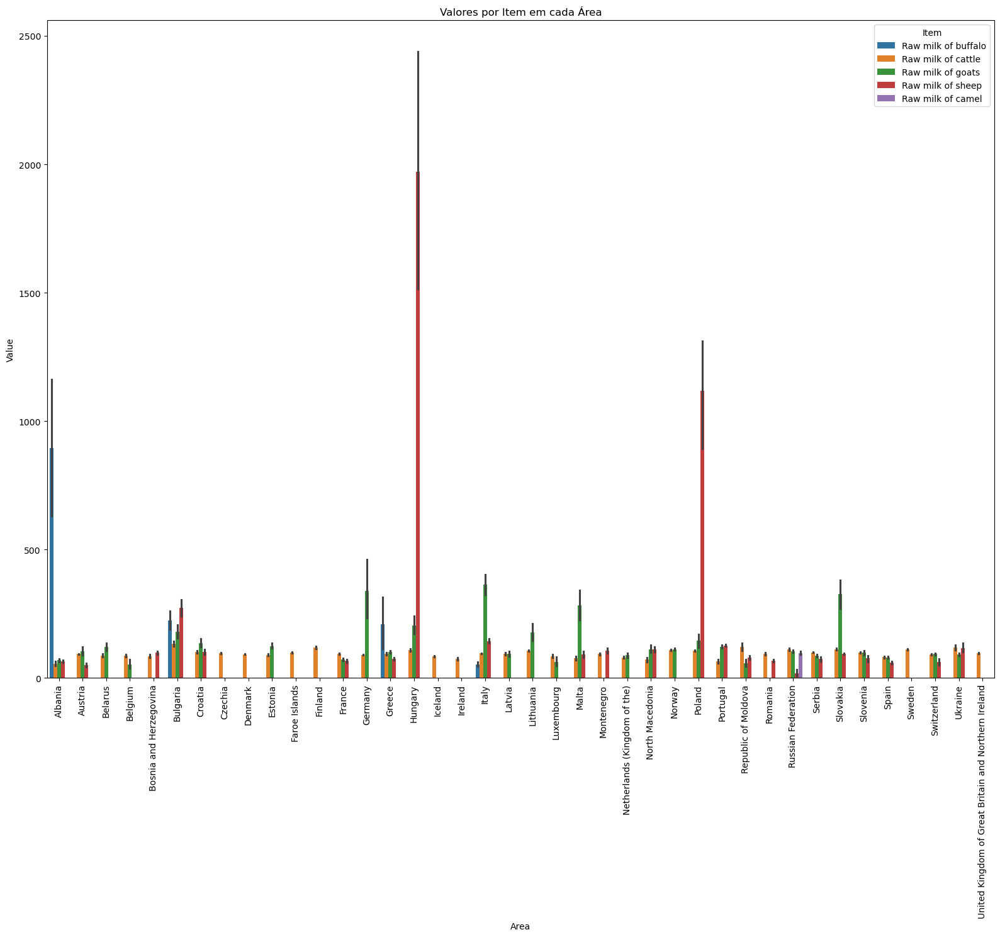

In [12]:
# This graph shows the Gross Production type of milk for each country.
# highlighting Ireland as a focus in our analysis, which is only represented by the production of Raw of milk cattle.

# Assuming df_new is already defined and contains the required columns
Item_per_Area = df_new[['Area', 'Item', 'Value']]  # Ensure these column names are correct

# Create a grouped bar plot
plt.figure(figsize=(16, 15))
sns.barplot(data=Item_per_Area, x='Area', y='Value', hue='Item', dodge=True)
plt.xticks(rotation=90)
plt.title('Valores por Item em cada Área')
plt.ylabel('Value')
plt.xlabel('Area')
plt.legend(title='Item')
plt.tight_layout()
plt.show()


# Data Cleaning

In [14]:
df_new= df_new.drop(columns=['Domain Code', 'Domain'])

In [15]:
df_new= df_new.drop(columns=['Unit', 'Flag'])

In [16]:
df_new= df_new.drop(columns=['Flag Description', 'Element Code'])

In [17]:
df_new= df_new.drop(columns=['Year Code', 'Element'])

In [18]:
df_new= df_new.drop(columns=['Area Code (M49)', 'Item Code (CPC)'])

In [19]:
df_new.head()

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14


In [20]:
df_new.shape

(4069, 4)

In [21]:
# Check for duplicate data
df_new.duplicated().sum()

0

In [22]:
df_new.isnull().sum() # Checking for missing data

Area     0
Item     0
Year     0
Value    0
dtype: int64

# Analysis of categorical variables

In [24]:
df_new.head()

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14


## Variable Area

In [26]:
df_new['Area'].describe()#  statistical analysis of the variable

count        4069
unique         40
top       Albania
freq          247
Name: Area, dtype: object

In [27]:
# count column values (Statistic Label) data exploration 
grouped_Area = df_new.groupby(['Area']).size()
grouped_Area 

Area
Albania                                                 247
Austria                                                 171
Belarus                                                  54
Belgium                                                  36
Bosnia and Herzegovina                                   62
Bulgaria                                                228
Croatia                                                  66
Czechia                                                  25
Denmark                                                  57
Estonia                                                  46
Faroe Islands                                             9
Finland                                                  57
France                                                  171
Germany                                                 114
Greece                                                  228
Hungary                                                 171
Iceland                            

Text(0.5, 0, 'European Countries')

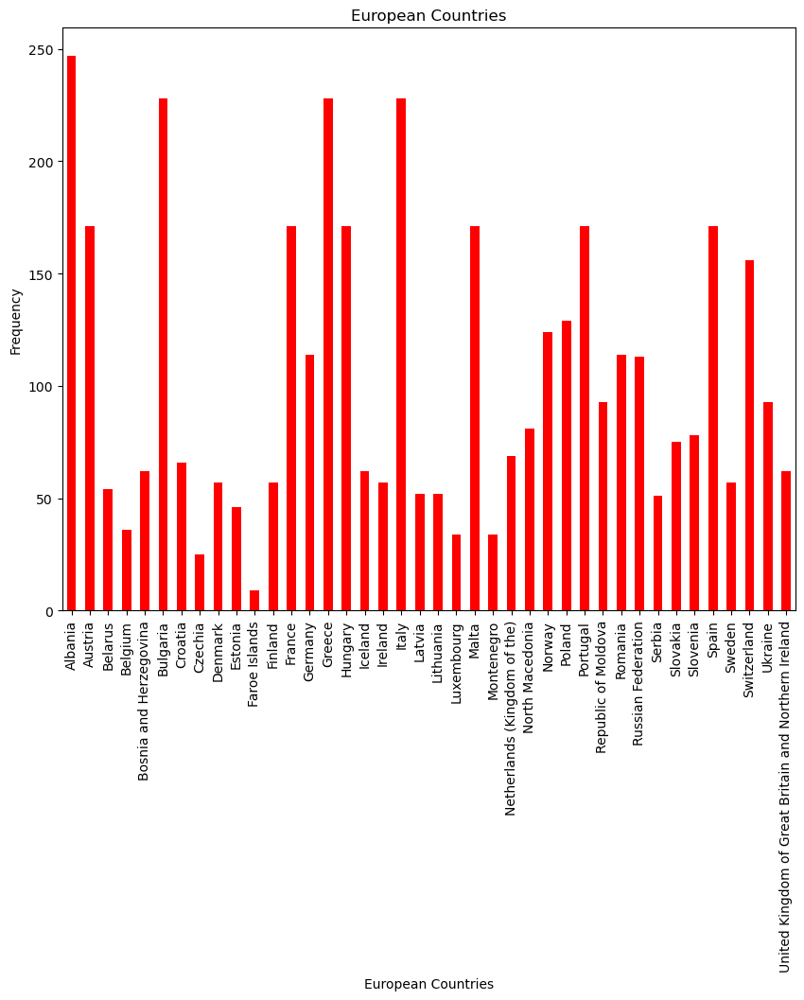

In [28]:
# plot the count volues of the categorical variable.
plt.figure(figsize=(10, 8)) 
grouped_Area .plot.bar(color = 'red')
plt.title('European Countries')
plt.ylabel('Frequency')
plt.xlabel('European Countries')

## Variable Item

In [30]:
df_new['Item'].describe()#  statistical analysis of the variable

count                   4069
unique                     5
top       Raw milk of cattle
freq                    1724
Name: Item, dtype: object

In [31]:
# count column values (Item) data exploration 
grouped_Item = df_new.groupby(['Item']).size()
grouped_Item

Item
Raw milk of buffalo     232
Raw milk of camel        20
Raw milk of cattle     1724
Raw milk of goats      1106
Raw milk of sheep       987
dtype: int64

Text(0.5, 0, 'Milk')

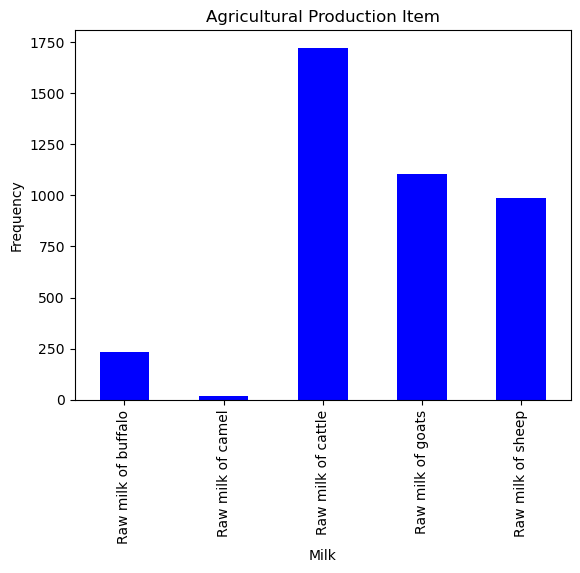

In [32]:
grouped_Item .plot.bar(color = 'blue')
plt.title('Agricultural Production Item')
plt.ylabel('Frequency')
plt.xlabel('Milk')

# Analysis of numerical variables

In [34]:
df_new.head()

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14


## Variable Year

In [36]:
df_new['Year'].describe()

count    4069.000000
mean     1994.400344
std        16.926520
min      1961.000000
25%      1980.000000
50%      1997.000000
75%      2009.000000
max      2022.000000
Name: Year, dtype: float64

In [37]:
# explore num data from (Year)
grouped_Year = df_new.groupby(['Year']).size()
grouped_Year

Year
1961    51
1962    51
1963    51
1964    51
1965    51
        ..
2018    34
2019    34
2020    34
2021    34
2022    33
Length: 62, dtype: int64

In [38]:
df_new.Year.mode()

0    2014
1    2015
2    2016
3    2017
Name: Year, dtype: int64

Text(0.5, 1.0, 'Year')

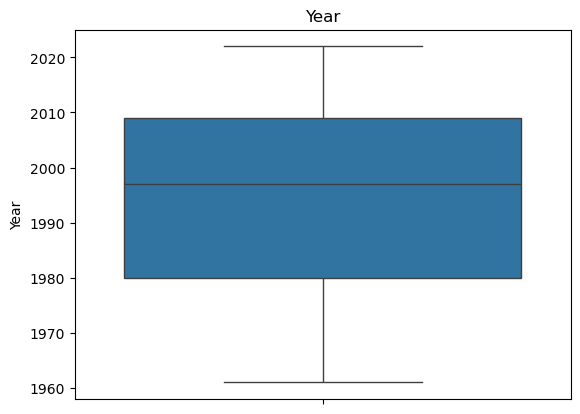

In [39]:
# visualization of outliers in the numeric variable

sns.boxplot(df_new['Year']).set_title('Year')

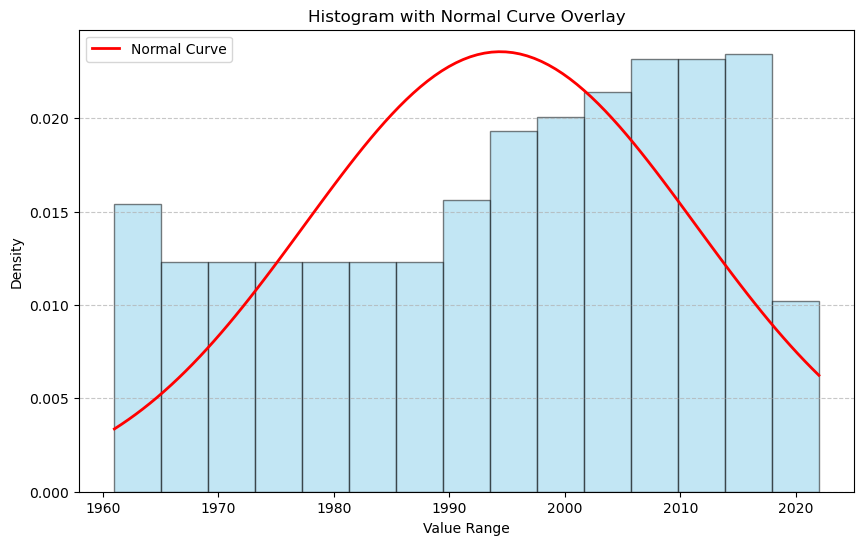

In [40]:
from scipy import stats

## Note from CE: The second step is visualise how the data is distributed using a histogram
# Create histogram
plt.figure(figsize=(10, 6))
count, bins, ignored = plt.hist(df_new['Year'], bins=15, density=True, color='skyblue', edgecolor='black', alpha=0.5)

# calculating the  normal distribution parameters 
mu, std = stats.norm.fit(df_new['Year'])

# Create a range of x values for the normal curve
x = np.linspace(min(df_new['Year']), max(df_new['Year']), 100)

# Create the normal distribution curve
p = stats.norm.pdf(x, mu, std)

# Plot the normal curve
plt.plot(x, p, 'r-', linewidth=2, label='Normal Curve')
plt.xlabel('Value Range')
plt.ylabel('Density')
plt.title('Histogram with Normal Curve Overlay')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.show()

## Variable Value

In [42]:
df_new['Value'].describe()

count    4069.000000
mean      164.926680
std       393.694244
min         1.180000
25%        80.590000
50%        97.150000
75%       114.840000
max      5031.440000
Name: Value, dtype: float64

In [43]:
df_new.Value.mode()

0    962.42
Name: Value, dtype: float64

In [44]:
# Interactive histogram to visualize the distribution of values in the variable VALUE 
hist1 =  px.histogram (df_new,  x = "Value", nbins=60) 
hist1.update_layout(width=800,height=500,title_text='Distribution of values') 
hist1.show()

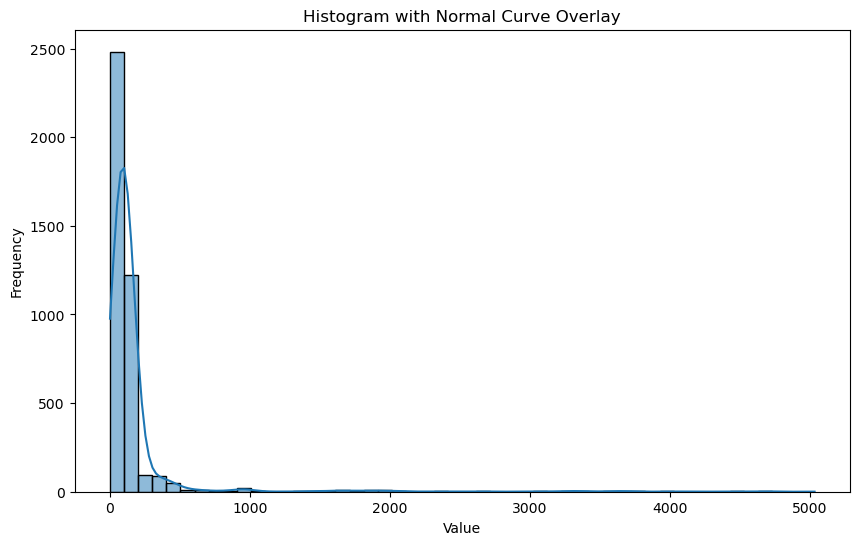

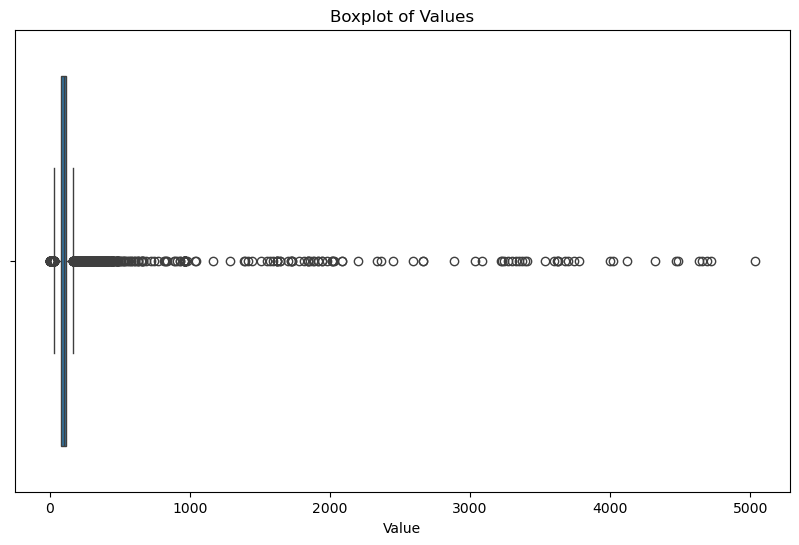

In [45]:
# Histogram
plt.figure(figsize=(10, 6))
sns.histplot(df_new['Value'], bins=50, kde=True)
plt.title('Histogram with Normal Curve Overlay')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

# visualization of outliers in the numeric variable VALUE
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_new['Value'])
plt.title('Boxplot of Values')
plt.show()


# EDA
- my analysis will be focused on the Gross Production of Raw milk of cattle, controlling the Gross Production value of the countries and making a 
- statistical comparison with the Gross Production of Raw milk of cattle in Ireland
- I will remove data from the dataframe that is not relevant to this analysis.

In [47]:
df_new.head()# aqui

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14


In [48]:
df_new_3 = df_new.copy()

In [49]:
df_new_4 = df_new.copy()

In [50]:
# Define the items to remove
items_to_remove = ['Raw milk of goats', 'Raw milk of buffalo', 'Raw milk of sheep', 'Raw milk of camel']

# Remove rows with these items in the 'Item' column
df_cleaned = df_new[~df_new['Item'].isin(items_to_remove)]

# Save the cleaned DataFrame to a new file
df_cleaned.to_csv('df_new_2.csv', index=False)


In [51]:
df_new_2 = pd.read_csv('df_new_2.csv') # import df

In [52]:
area_counts = df_new_2['Area'].value_counts()
area_counts

Area
Albania                                                 62
Iceland                                                 62
Switzerland                                             62
Norway                                                  62
United Kingdom of Great Britain and Northern Ireland    62
Bulgaria                                                57
Ireland                                                 57
Sweden                                                  57
Spain                                                   57
Romania                                                 57
Portugal                                                57
Poland                                                  57
Netherlands (Kingdom of the)                            57
Austria                                                 57
Italy                                                   57
Malta                                                   57
Greece                                             

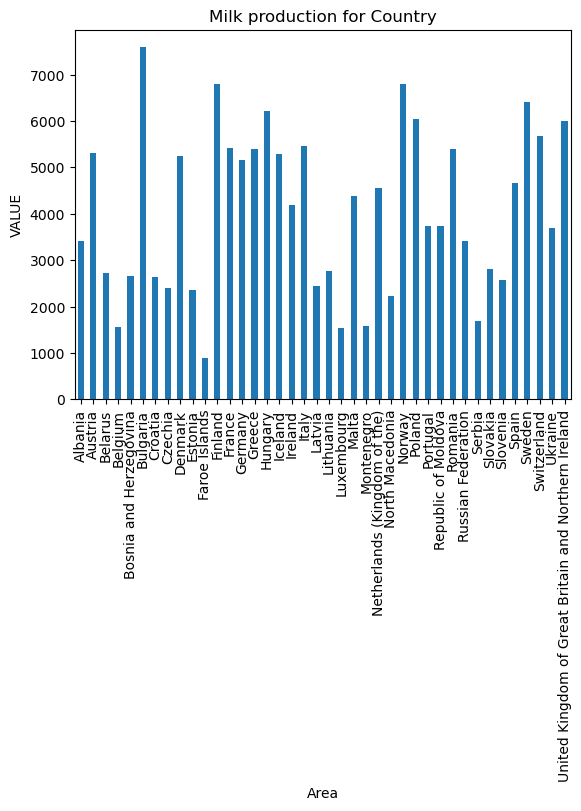

In [53]:
# plot the Area, for better visualization of data 

area_counts = df_new_2.groupby('Area')['Value'].sum().plot(kind='bar', title='Milk production for Country')
plt.ylabel("VALUE")
plt.grid(False)
plt.show()

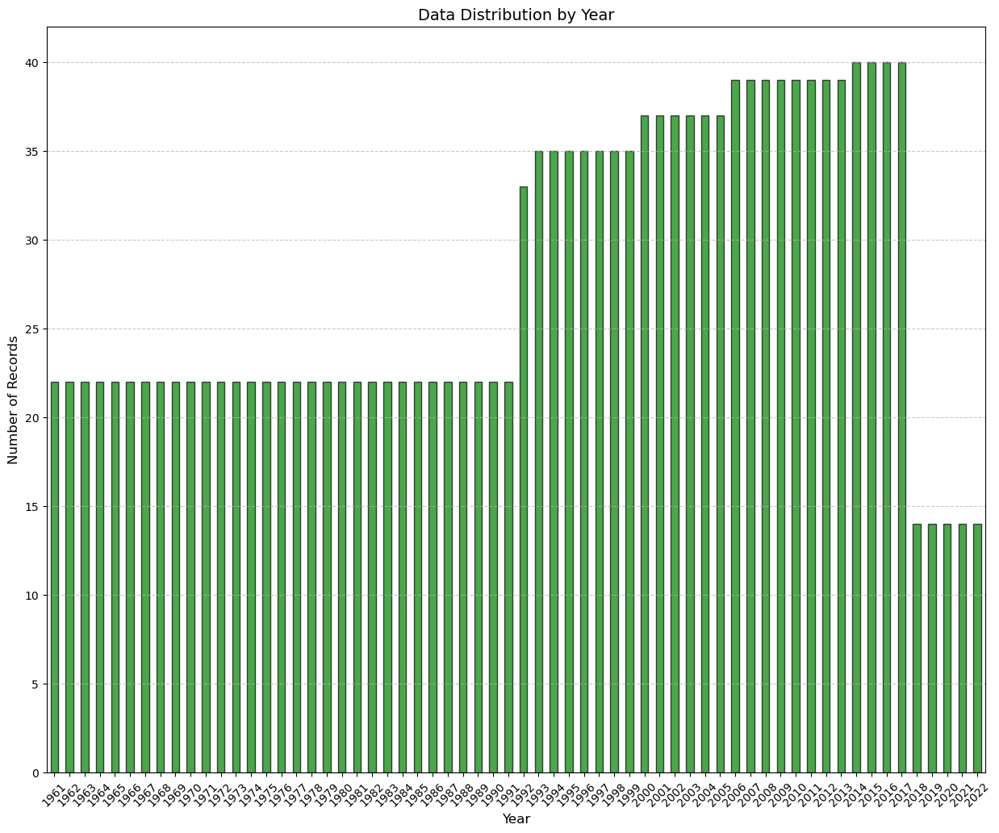

In [54]:
# The distribution of data by year shows the number of records available in each year of the data set, 
# allowing the identification of the temporal trend in the amount of data over the years.

import matplotlib.pyplot as plt

# Contagem de ocorrências por ano
year_counts = df_new_2['Year'].value_counts().sort_index()

# Plotando a distribuição dos dados por ano
plt.figure(figsize=(15, 12))
year_counts.plot(kind='bar', color='green', alpha=0.7, edgecolor='black')
plt.title('Data Distribution by Year', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Records', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


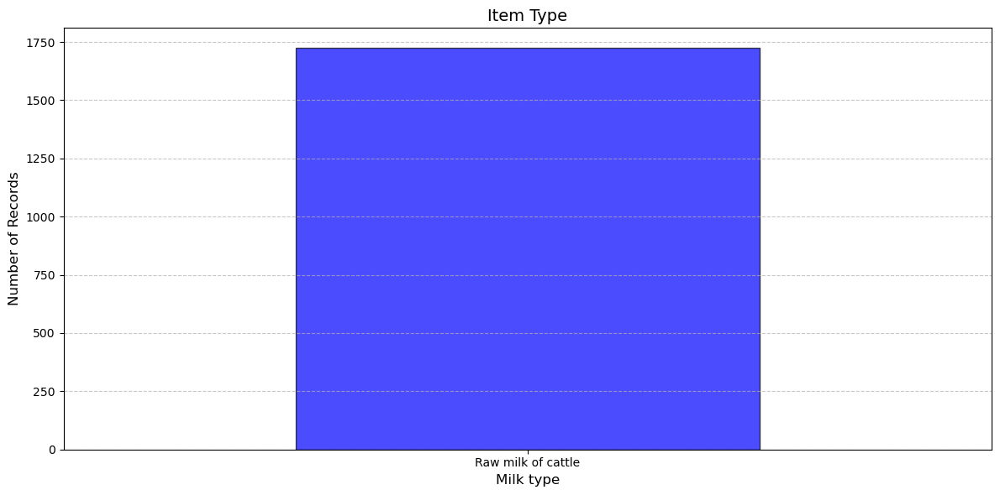

In [55]:
# The graph shows the distribution of data by item type.
# Each bar represents a type of item (type of Milk produced.

# Contagem de ocorrências por tipo de item
item_counts = df_new_2['Item'].value_counts()

# Plotando a distribuição dos dados por tipo de item
plt.figure(figsize=(12, 6))
item_counts.plot(kind='bar', color='blue', alpha=0.7, edgecolor='black')
plt.title('Item Type', fontsize=14)
plt.xlabel('Milk type', fontsize=12)
plt.ylabel('Number of Records', fontsize=12)
plt.xticks(rotation=0, ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Raw Milk of Cattle

In [57]:
# Filtrar os dados para o item "Raw milk of cattle"
raw_milk_data = df_new_2[df_new_2['Item'] == 'Raw milk of cattle']

# Agrupar por país e somar os valores
top_producers = raw_milk_data.groupby('Area')['Value'].sum().reset_index()

# Selecionar os 5 maiores produtores
top_producers = top_producers.nlargest(5, 'Value')

# Criar o gráfico interativo
fig = px.bar(
    top_producers,
    x='Area',
    y='Value',
    title='Top 5 Raw Milk of Cattle producing countries',
    labels={'Area': 'Cauntries', 'Value': 'Gross Production value'},
    text='Value',
)
# Ajustar tamanho do gráfico
fig.update_layout(
    width=900,  # Largura
    height=750   # Altura
)

# Melhorar o layout do gráfico
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()


In [58]:

# Filtrar os dados para o item "Raw milk of cattle"
raw_milk_data = df_new_2[df_new_2['Item'] == 'Raw milk of cattle']

# Agrupar por país e somar os valores
producers = raw_milk_data.groupby('Area')['Value'].sum().reset_index()

# Selecionar os 5 maiores produtores
top_producers = producers.nlargest(5, 'Value')

# Garantir que a Irlanda esteja na análise
if 'Ireland' not in top_producers['Area'].values:
    ireland_data = producers[producers['Area'] == 'Ireland']
    top_producers = pd.concat([top_producers, ireland_data], ignore_index=True)

# Criar o gráfico interativo
fig = px.bar(
    top_producers,
    x='Area',
    y='Value',
    title='Top 5 Raw Milk of Cattle producing countries VS Irlanda',
    labels={'Area': 'Countries', 'Value': 'Gross Production value'},
    text='Value',
    color='Area'  # Destaque de cores para cada país
)

# Ajustar tamanho do gráfico
fig.update_layout(
    width=900,  # Largura
    height=600   # Altura
)


# Melhorar o layout do gráfico
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', xaxis_tickangle=-45)

# Mostrar o gráfico
fig.show()


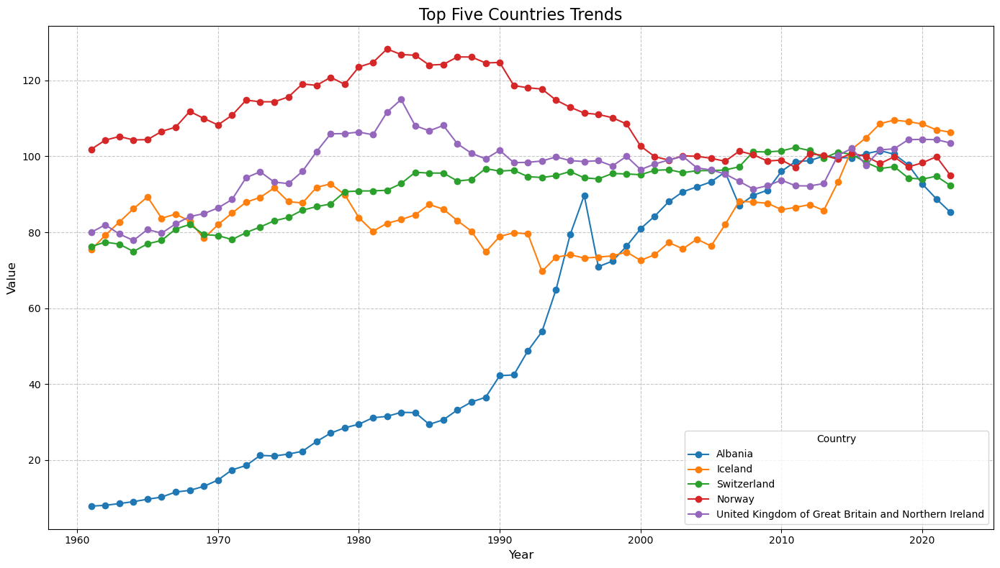

In [59]:
# The graph shows trends in Gross Milk production values ​​over the years for the five countries with the highest number of records in the dataset.
#Notes:
# It is clear that Spain and Greece show consistent growth over time, while others have fluctuations.


# Certifique-se de que area_counts seja recalculado corretamente como uma série
area_counts = df_new_2['Area'].value_counts()

# Selecionar os cinco países com mais registros
top_countries = area_counts.head(5).index

# Filtrar os dados apenas para esses países
top_countries_data = df_new_2[df_new_2['Area'].isin(top_countries)]

# Analisar as tendências ao longo dos anos para os cinco países principais
plt.figure(figsize=(14, 8))
for country in top_countries:
    country_data = top_countries_data[top_countries_data['Area'] == country]
    trend = country_data.groupby('Year')['Value'].sum()
    plt.plot(trend.index, trend.values, marker='o', label=country)

# Configuração do gráfico
plt.title('Top Five Countries Trends', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.legend(title="Country", fontsize=10)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



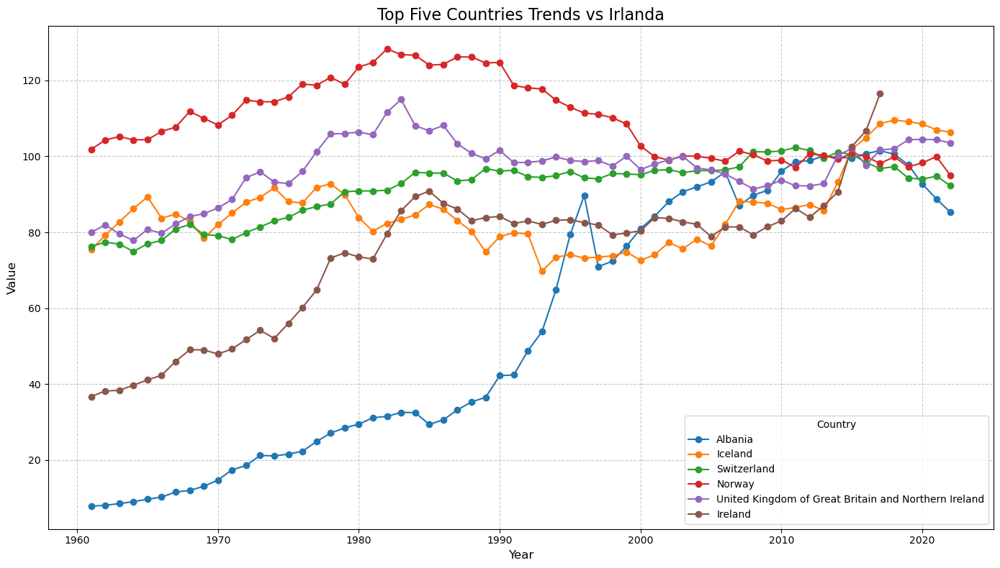

In [60]:
# Certificar-se de que area_counts é recalculado corretamente como uma série
area_counts = df_new_2['Area'].value_counts()

# Selecionar os cinco países com mais registros
top_countries = area_counts.head(5).index

# Adicionar a Irlanda ao conjunto de países para análise
countries_to_compare = list(top_countries) + ['Ireland']

# Filtrar os dados para os países selecionados
selected_countries_data = df_new_2[df_new_2['Area'].isin(countries_to_compare)]

# Analisar as tendências ao longo dos anos para os países selecionados
plt.figure(figsize=(14, 8))
for country in countries_to_compare:
    country_data = selected_countries_data[selected_countries_data['Area'] == country]
    trend = country_data.groupby('Year')['Value'].sum()
    plt.plot(trend.index, trend.values, marker='o', label=country)

# Configuração do gráfico
plt.title('Top Five Countries Trends vs Irlanda', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.legend(title="Country", fontsize=10)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Ireland Analysis

In [62]:
ireland_descriptive_stats = ireland_data.describe()
print(ireland_descriptive_stats)

         Value
count     1.00
mean   4190.48
std        NaN
min    4190.48
25%    4190.48
50%    4190.48
75%    4190.48
max    4190.48


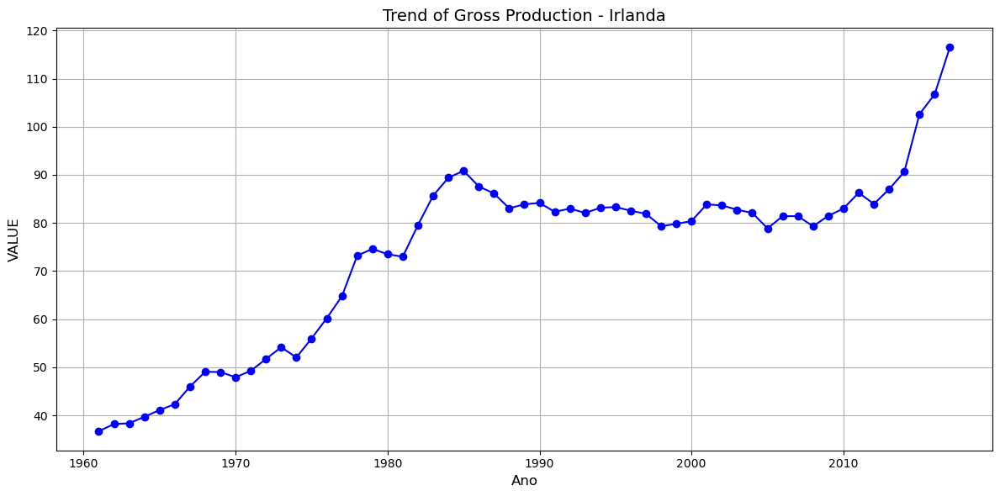

In [63]:
# Filtrar os dados apenas para a Irlanda
ireland_data = df_new_2[df_new_2['Area'] == 'Ireland']

# Agrupar por ano e calcular a média do valor
gross_production = ireland_data.groupby('Year')['Value'].mean()

# Plotar a tendência anual
plt.figure(figsize=(12, 6))
plt.plot(gross_production.index, gross_production.values, marker='o', linestyle='-', color='b')
plt.title("Trend of Gross Production - Irlanda", fontsize=14)
plt.xlabel("Ano", fontsize=12)
plt.ylabel("VALUE", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


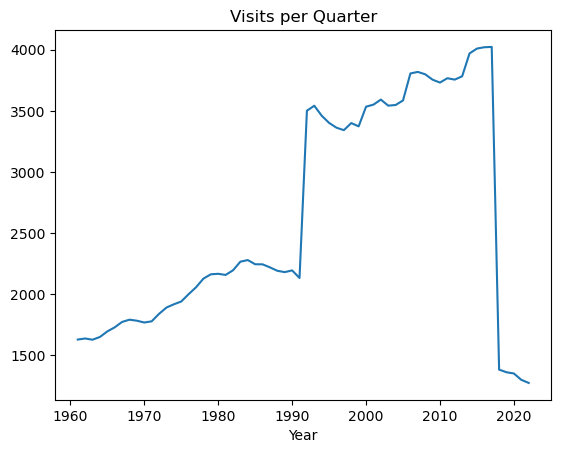

In [64]:
ireland_data = df_new_2[df_new_2['Area'] == 'Ireland']
ireland_data = df_new_2.groupby('Year')['Value'].sum().plot(kind='line', title='Visits per Quarter')
plt.show()

## Gross Production Europe Top 5 Vs Irland

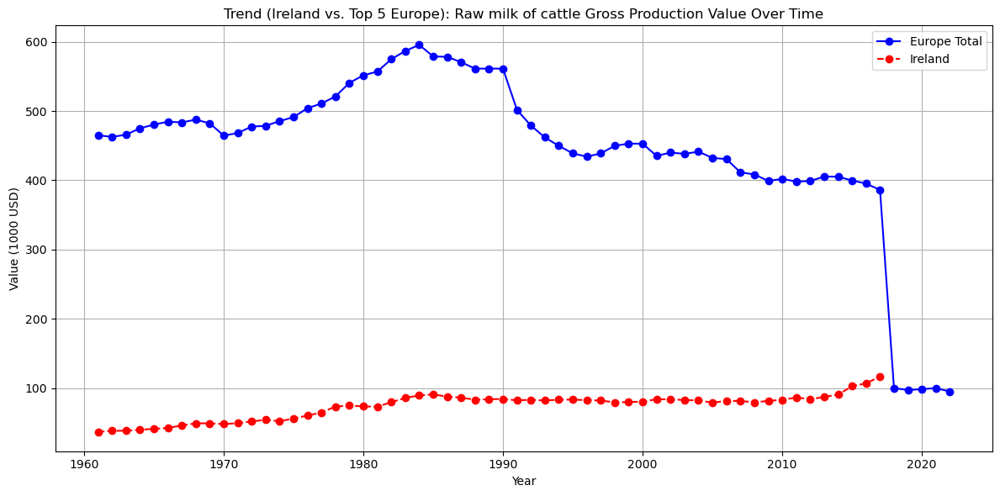

In [66]:
# Filter data for European countries
europe_Top_5 = df_new_2[df_new_2['Area'].isin(['Bulgaria', 'Norway', 'Finland', 'Sweden'])]  # Add top 5 European countries vs Irland

# agroupby data for Europe
europe_agroupby = europe_Top_5.groupby('Year')['Value'].sum()

# Ireland's data
ireland_data = df_new_2[df_new_2['Area'] == 'Ireland']
ireland_agroupby = ireland_data.groupby('Year')['Value'].sum()

# Calculate Ireland's share
VS = (ireland_agroupby / europe_agroupby) * 100


# Plot Ireland vs. Europe
plt.figure(figsize=(12, 6))
plt.plot(europe_agroupby.index, europe_agroupby.values, label='Europe Total', linestyle='-', marker='o', color='blue')
plt.plot(ireland_agroupby.index, ireland_agroupby.values, label='Ireland', linestyle='--', marker='o', color='red')
plt.title('Trend (Ireland vs. Top 5 Europe): Raw milk of cattle Gross Production Value Over Time')
plt.xlabel('Year')
plt.ylabel('Value (1000 USD)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



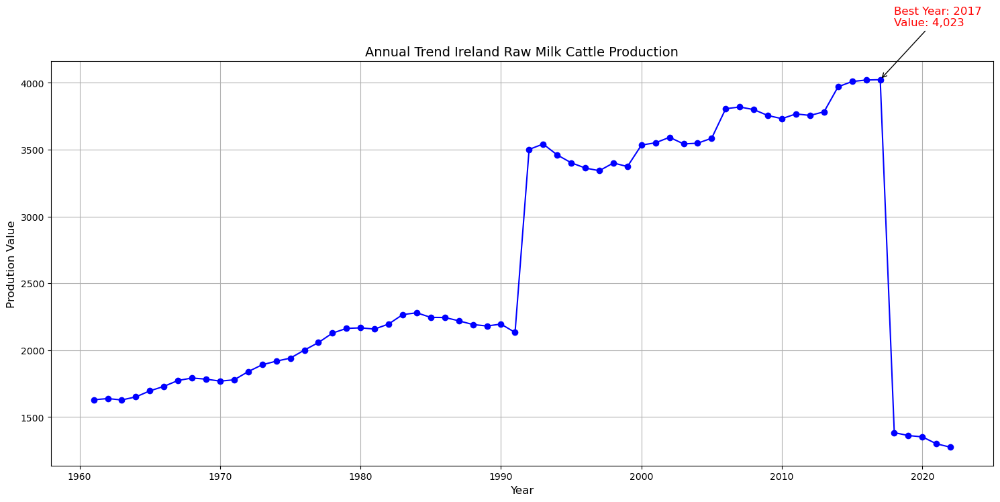

    Year    Value
0   1961  1628.78
1   1962  1637.47
2   1963  1627.38
3   1964  1650.04
4   1965  1695.37
..   ...      ...
57  2018  1382.79
58  2019  1361.03
59  2020  1351.09
60  2021  1299.27
61  2022  1273.85

[62 rows x 2 columns]


In [67]:
# Agrupar os dados da Irlanda por ano e somar os valores
ireland_yearly = df_new_2.groupby('Year')['Value'].sum().reset_index()

# Plotar a tendência anual
plt.figure(figsize=(15, 7))
plt.plot(ireland_yearly['Year'], ireland_yearly['Value'], marker='o', linestyle='-', color='blue')
plt.title("Annual Trend Ireland Raw Milk Cattle Production", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Prodution Value", fontsize=12)
plt.grid(True)
plt.tight_layout()

# Identificar o ano com maior crescimento
max_year = ireland_yearly.loc[ireland_yearly['Value'].idxmax(), 'Year']
max_value = ireland_yearly['Value'].max()
plt.annotate(f"Best Year: {max_year}\nValue: {max_value:,.0f}",
             xy=(max_year, max_value), xytext=(max_year + 1, max_value * 1.1),
             arrowprops=dict(facecolor='Black', arrowstyle='->'), fontsize=12, color='red')

plt.show()

# Exibir os dados agrupados
print(ireland_yearly)

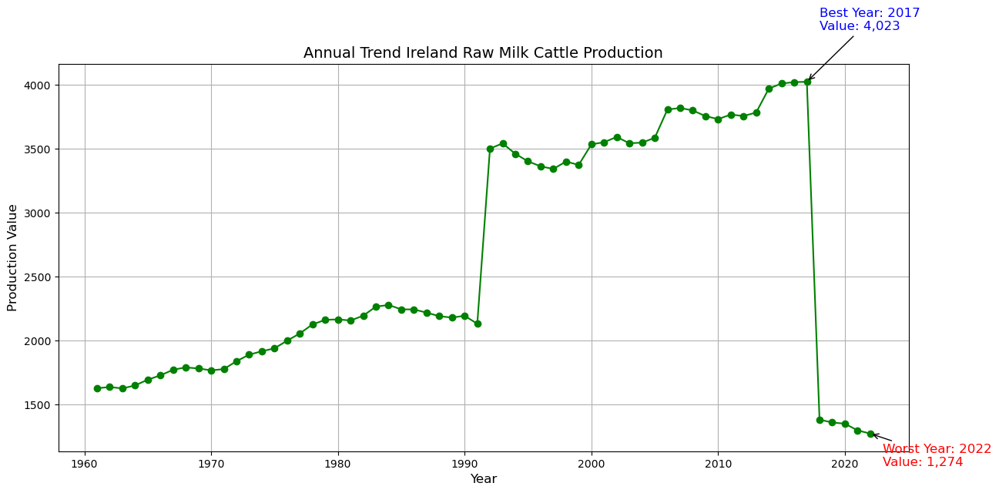

{'Best Year': (2017, 4023.14), 'Worst Year': (2022, 1273.85)}


In [68]:
# Agrupar os dados da Irlanda por ano e somar os valores
ireland_yearly = df_new_2.groupby('Year')['Value'].sum().reset_index()

# Identificar o ano com maior e menor crescimento
max_year = ireland_yearly.loc[ireland_yearly['Value'].idxmax(), 'Year']
max_value = ireland_yearly['Value'].max()
min_year = ireland_yearly.loc[ireland_yearly['Value'].idxmin(), 'Year']
min_value = ireland_yearly['Value'].min()

# Plotar a tendência anual
plt.figure(figsize=(12, 6))
plt.plot(ireland_yearly['Year'], ireland_yearly['Value'], marker='o', linestyle='-', color='green')
plt.title("Annual Trend Ireland Raw Milk Cattle Production", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Production Value", fontsize=12)
plt.grid(True)
plt.tight_layout()

# Anotar o melhor e o pior ano
plt.annotate(f"Best Year: {max_year}\nValue: {max_value:,.0f}",
             xy=(max_year, max_value), xytext=(max_year + 1, max_value * 1.1),
             arrowprops=dict(facecolor='blue', arrowstyle='->'), fontsize=12, color='blue')
plt.annotate(f"Worst Year: {min_year}\nValue: {min_value:,.0f}",
             xy=(min_year, min_value), xytext=(min_year + 1, min_value * 0.8),
             arrowprops=dict(facecolor='red', arrowstyle='->'), fontsize=12, color='red')

plt.show()

# Exibir os anos de maior e menor crescimento
print({"Best Year": (max_year, max_value), "Worst Year": (min_year, min_value)})

# Descriptive Statistical
- Anova to compare averages across all countries
- T tests between Ireland and other countries.
- Wilcoxon
- qui-quadrado

## T test

In [71]:
# dados do df_new2 so cattle milk
from scipy.stats import ttest_1samp

# Retire uma amostra dos dados
sample = df_new_2[df_new_2['Area']=='Ireland']['Value'].sample(30, random_state=42)

# Dados da amostra
H_mean = 100  # Valor hipotético para comparação (100)

# T-Test de uma amostra
t_stat, p_value = ttest_1samp(sample, H_mean)# hypothetical_mean

print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")

# Interpretação of the results
alpha = 0.05
if p_value < alpha:
    print("We reject the null hypothesis (H0). The mean is different from the hypothesized value.")
else:
    print("We do not reject the null hypothesis (H0).")


T-Statistic: -8.01449579893332
P-Value: 7.72412682199642e-09
We reject the null hypothesis (H0). The mean is different from the hypothesized value.


In [72]:
from scipy.stats import ttest_ind
# Filtrar os dados dos dois países

sample_Ireland = df_new_2[df_new_2['Area']=='Ireland']['Value'].sample(30, random_state=42)
sample_Bulgaria = df_new_2[df_new_2['Area']=='Bulgaria']['Value'].sample(30, random_state=42)


# Aplicar o T-Test
t_stat, p_value = ttest_ind(sample_Ireland, sample_Bulgaria)

# Resultados
print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")


# Interpretação
alpha = 0.05
if p_value < alpha:
    print("Rejeitamos a hipótese nula (H0). Existe uma diferença significativa entre as médias de produção dos dois países.")
else:
    print("Não rejeitamos a hipótese nula (H0). Não há diferença significativa entre as médias de produção dos dois países.")


T-Statistic: -8.028731135253448
P-Value: 5.481975104369567e-11
Rejeitamos a hipótese nula (H0). Existe uma diferença significativa entre as médias de produção dos dois países.


## test Shapiro-Wilk verificar a normalidade

In [74]:
from scipy.stats import shapiro
stat, p_value = shapiro(sample_Ireland)
if p_value > 0.05:
    print("Os dados seguem uma distribuição normal.")
else:
    print("Os dados não seguem uma distribuição normal.")


Os dados não seguem uma distribuição normal.


## confidence interval for the population 
- confidence level: Z*
- Confidence Percentage   |Z Value*
- 80                        1,28 
- 90                        1.64
- 95                        1.96
- 98                        2.33
- 99                        2.58
- higher the confidence the more standard errors

In [76]:
df_new_2.head()

,Area,Item,Year,Value
0,Albania,Raw milk of cattle,1961,7.85
1,Albania,Raw milk of cattle,1962,8.06
2,Albania,Raw milk of cattle,1963,8.52
3,Albania,Raw milk of cattle,1964,9.03
4,Albania,Raw milk of cattle,1965,9.66


In [77]:
# estimate average milk production over a period of the last 10 years
# sample data from 5 years of the last 10 years
from scipy.stats import norm

# Filtrar os dados para a Irlanda e o período desejado (exemplo: últimos 10 anos)
country = "Ireland"
sample_Ireland_f = df_new_2[(df_new_2['Area'] == country) & (df_new_2['Year'] >= 2013)]


# Amostrar 5 anos aleatórios
sample_data = sample_Ireland_f.sample(n=5, random_state=42)

# Calcular estatísticas da amostra
mean_value = sample_data['Value'].mean()  # production mean
std_value = sample_data['Value'].std()    # std
n = len(sample_data)                      # sample size

# Cálculo do intervalo de confiança
confidence_level = 0.95
z_score = norm.ppf((1 + confidence_level) / 2)  # Valor crítico Z
margin_of_error = z_score * (std_value / np.sqrt(n))  # Margem de erro
confidence_interval = (mean_value - margin_of_error, mean_value + margin_of_error)

# Exibir o resultado
print(f"Intervalo de Confiança de 95% para a produção média de leite na Irlanda: {confidence_interval}")


Intervalo de Confiança de 95% para a produção média de leite na Irlanda: (90.1552612272232, 111.26073877277679)


In [78]:
from scipy.stats import t
import numpy as np

# Sample statistics
mean_value = sample_data['Value'].mean()  # Sample mean
std_value = sample_data['Value'].std()    # Sample standard deviation
n = len(sample_data)                      # Sample size

# Degrees of freedom
df = n - 1

# Confidence level (95%)
confidence_level = 0.95
t_score = t.ppf((1 + confidence_level) / 2, df)  # t-critical value

# Margin of error
margin_of_error = t_score * (std_value / np.sqrt(n))

# Confidence interval
confidence_interval = (mean_value - margin_of_error, mean_value + margin_of_error)

# Display results
print(f"Intervalo de Confiança de 95% usando T-test: {confidence_interval}")


Intervalo de Confiança de 95% usando T-test: (85.75920494906299, 115.656795050937)


## Kruskal-Wallis H Test
- O teste Kruskal é usado para comparar mais de dois grupos independentes
- Este teste é uma alternativa não paramétrica ao ANOVA,
- ideal para dados que não seguem uma distribuição normal.



In [80]:
from scipy.stats import kruskal

# Dados de três ou mais grupos independentes
sample_Bulgaria = df_new_2[df_new_2['Area']=='Bulgaria']['Value'].sample(30, random_state=42)
sample_Norway = df_new_2[df_new_2['Area']=='Norway']['Value'].sample(30, random_state=42)
sample_Ireland = df_new_2[df_new_2['Area']=='Ireland']['Value'].sample(30, random_state=42)

# Kruskal-Wallis Test
stat, p_value = kruskal(sample_Bulgaria , sample_Norway, sample_Ireland)

print(f"Kruskal-Wallis Statistic: {stat}")
print(f"P-Value: {p_value}")

# Interpretação
alpha = 0.05
if p_value < alpha:
    print("We reject the null hypothesis (H0). At least one group is different.")
else:
    print("We do not reject the null hypothesis (H0).")


Kruskal-Wallis Statistic: 55.256230175715885
P-Value: 1.0029102546633878e-12
We reject the null hypothesis (H0). At least one group is different.


In [81]:
pip install scikit-posthocs

Note: you may need to restart the kernel to use updated packages.


In [82]:
from scikit_posthocs import posthoc_dunn

# Combinar os dados dos três grupos em um único dataframe
import pandas as pd

data = pd.DataFrame({
    'Value': list(sample_Bulgaria) + list(sample_Norway) + list(sample_Ireland),
    'Area': ['Bulgaria']*30 + ['Norway']*30 + ['Ireland']*30
})

# Realizar o Dunn's Test
posthoc = posthoc_dunn(data, val_col='Value', group_col='Area', p_adjust='bonferroni')

print(posthoc)


              Bulgaria       Ireland        Norway
Bulgaria  1.000000e+00  2.243676e-12  1.771896e-01
Ireland   2.243676e-12  1.000000e+00  3.819677e-07
Norway    1.771896e-01  3.819677e-07  1.000000e+00


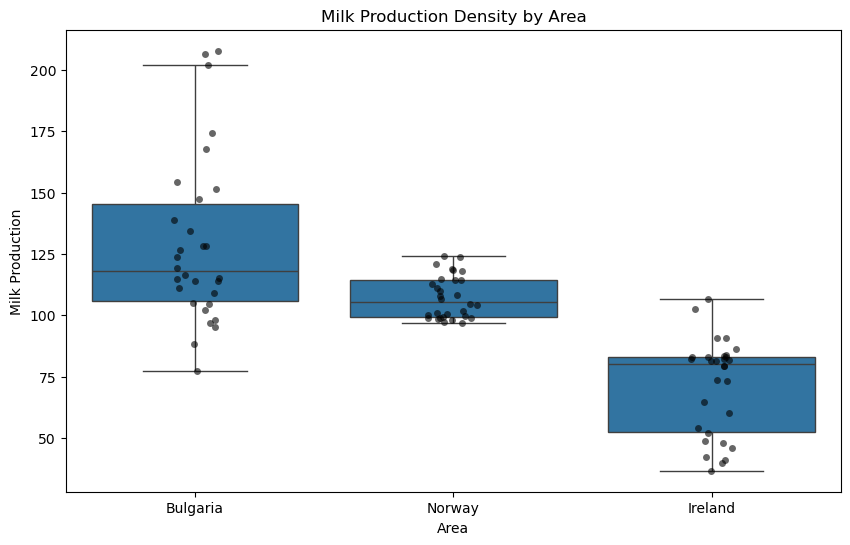

In [83]:
# Violin plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Area', y='Value', data=data, showfliers=False)
sns.stripplot(x='Area', y='Value', data=data, color='black', alpha=0.6, jitter=True)
plt.title('Milk Production Density by Area')
plt.ylabel('Milk Production')
plt.xlabel('Area')
plt.show()


## Chi-Square



In [85]:
from scipy.stats import chi2_contingency

# Dividir os valores de produção em categorias
df_new['Production_Category'] = pd.cut(
    df_new['Value'], bins=3, labels=["Low", "Médium", "High"]
)

# Criar uma tabela de contingência (país vs. categoria de produção)
table = pd.crosstab(df_new['Area'], df_new['Production_Category'])

# Realizar o teste qui-quadrado
chi2_stat, p_value, dof, expected = chi2_contingency(table)

# Resultados
print("Chi-Square:", chi2_stat)
print("P-Value:", p_value)
print("Degrees of Freedom:", dof)
print("Table:")
print(expected)


Chi-Square: 753.891801827076
P-Value: 3.315611828330401e-111
Degrees of Freedom: 78
Table:
[[2.43115016e+02 2.48881789e+00 1.39616613e+00]
 [1.68310396e+02 1.72302777e+00 9.66576554e-01]
 [5.31506513e+01 5.44114033e-01 3.05234701e-01]
 [3.54337675e+01 3.62742689e-01 2.03489801e-01]
 [6.10248218e+01 6.24723519e-01 3.50454657e-01]
 [2.24413861e+02 2.29737036e+00 1.28876874e+00]
 [6.49619071e+01 6.65028262e-01 3.73064635e-01]
 [2.46067830e+01 2.51904645e-01 1.41312362e-01]
 [5.61034652e+01 5.74342590e-01 3.22192185e-01]
 [4.52764807e+01 4.63504547e-01 2.60014746e-01]
 [8.85844188e+00 9.06856722e-02 5.08724502e-02]
 [5.61034652e+01 5.74342590e-01 3.22192185e-01]
 [1.68310396e+02 1.72302777e+00 9.66576554e-01]
 [1.12206930e+02 1.14868518e+00 6.44384370e-01]
 [2.24413861e+02 2.29737036e+00 1.28876874e+00]
 [1.68310396e+02 1.72302777e+00 9.66576554e-01]
 [6.10248218e+01 6.24723519e-01 3.50454657e-01]
 [5.61034652e+01 5.74342590e-01 3.22192185e-01]
 [2.24413861e+02 2.29737036e+00 1.28876874e+0

## Wilcoxon Rank-Sum Test

In [87]:
from scipy.stats import mannwhitneyu

# Dados de dois grupos independentes
sample_Ireland = df_new_2[df_new_2['Area']=='Ireland']['Value'].sample(30, random_state=42)
sample_Bulgaria = df_new_2[df_new_2['Area']=='Bulgaria']['Value'].sample(30, random_state=42)


# Mann-Whitney U Test
stat, p_value = mannwhitneyu(sample_Ireland, sample_Bulgaria, alternative='two-sided')

print(f"Mann-Whitney U Statistic: {stat}")
print(f"P-Value: {p_value}")

# Interpretação
alpha = 0.05
if p_value < alpha:
    print("We reject the null hypothesis (H0). The distributions of the two groups are different.")
else:
    print("We do not reject the null hypothesis (H0).")


Mann-Whitney U Statistic: 31.0
P-Value: 6.121039395876217e-10
We reject the null hypothesis (H0). The distributions of the two groups are different.


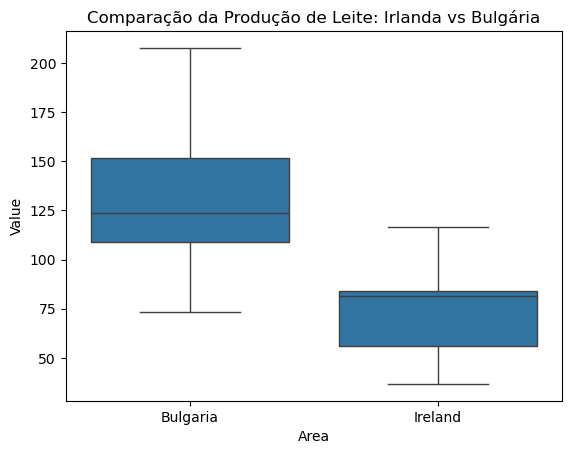

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

# Criar boxplot comparando os dois grupos
df_samples = df_new_2[df_new_2['Area'].isin(['Ireland', 'Bulgaria'])]
sns.boxplot(x='Area', y='Value', data=df_samples)
plt.title('Comparação da Produção de Leite: Irlanda vs Bulgária')
plt.show()


## Normality Test Value col da variavel (df_new) porque tem mais dados

In [90]:
# Central Limit Theorem (CLT)
# Definition:

# The Central Limit Theorem states that the distribution of the sample means of a large number of independent, 
#identically distributed (i.i.d.) random variables approaches a normal distribution (Gaussian) as the sample size increases, regardless of the original distribution of the data.
#This is important because it allows us to make inferences about the population using the normal distribution, even if the original data is not normally distributed.

In [91]:
df_new.head()

,Area,Item,Year,Value,Production_Category
0,Albania,Raw milk of buffalo,1961,3701.63,High
1,Albania,Raw milk of buffalo,1962,3405.50,High
2,Albania,Raw milk of buffalo,1963,3035.34,Médium
3,Albania,Raw milk of buffalo,1964,2887.27,Médium
4,Albania,Raw milk of buffalo,1965,2591.14,Médium


In [92]:
df_new['Value'].describe()

count    4069.000000
mean      164.926680
std       393.694244
min         1.180000
25%        80.590000
50%        97.150000
75%       114.840000
max      5031.440000
Name: Value, dtype: float64

In [93]:
# Calculate the mean and standard deviation of the VALUE column
mean = df_new['Value'].mean()
std = df_new['Value'].std()

mean, std

(164.9266797739002, 393.69424425766437)

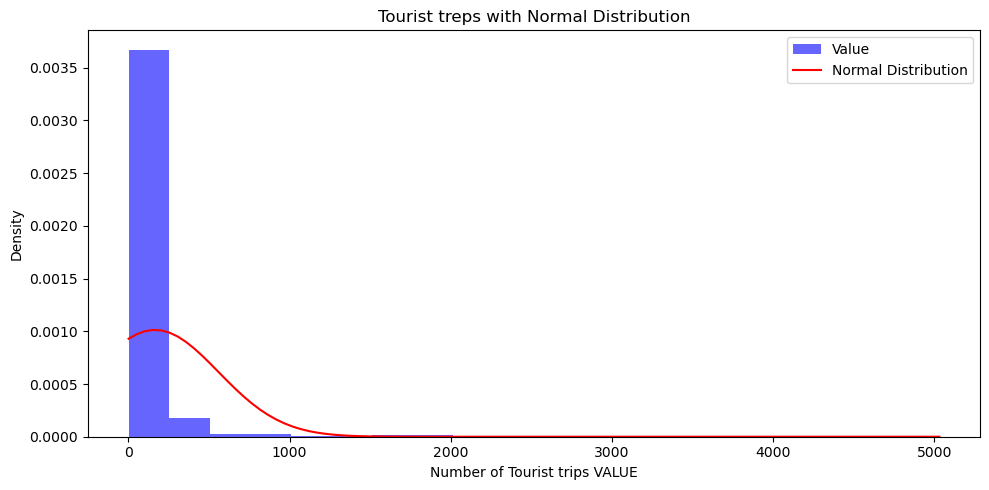

In [94]:
from scipy.stats import norm

# plot the normal distribution curve
normal_d = np.linspace(df_new['Value'].min(), df_new['Value'].max(), 100)
normal_probs = norm.pdf(normal_d, mean, std)

# Plot the Normal distribution value
plt.figure(figsize=(10, 5))
plt.hist(df_new['Value'], bins=20, density=True, alpha=0.6, color='blue', label="Value")
plt.plot(normal_d, normal_probs, 'r-', label=f"Normal Distribution")
plt.xlabel('Number of Tourist trips VALUE')
plt.ylabel('Density')
plt.title("Tourist treps with Normal Distribution")
plt.legend()
plt.tight_layout()
plt.show()

In [95]:
from scipy import stats
# Shapiro-Wilk Test
stat, p_value = stats.shapiro(df_new['Value'])
print(f'Statistic: {stat}, p-value: {p_value}')

if p_value >= 0.05:
    print("Sample appears to be normally distributed.")
else:
    print("Sample does not appear to be normally distributed.")


Statistic: 0.23987253113440166, p-value: 3.143362687682884e-84
Sample does not appear to be normally distributed.


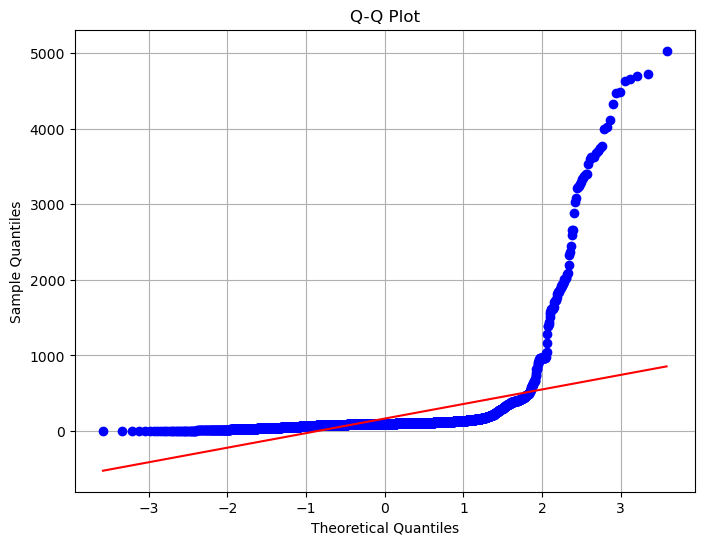

In [96]:
##A Q-Q (quantile-quantile) plot is a graphical tool to assess if a dataset follows a specified distribution (usually normal).
#Create a Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(df_new['Value'], dist="norm", plot=plt)

#Add titles and labels
plt.title('Q-Q Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

# Show the plot
plt.grid()
plt.show()

### Central Limit Theorem (CLT)

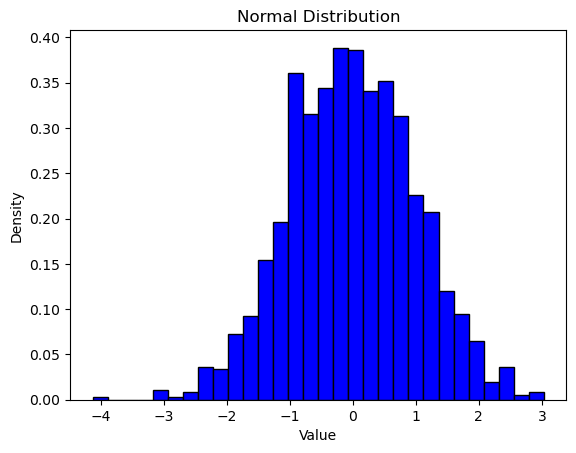

      Value
0 -0.594167
1 -0.916702
2  0.448915
3  1.054692
4 -0.412716


In [98]:

# Gerar 1000 números aleatórios a partir de uma distribuição normal
df_new = pd.DataFrame(np.random.normal(0, 1, 1500), columns=['Value'])

# Plotar o histograma da distribuição
plt.hist(df_new['Value'], bins=30, color='blue', edgecolor='black', density=True)
plt.title('Normal Distribution')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()

# Exibir as primeiras linhas do DataFrame
print(df_new.head())


In [99]:
from scipy import stats
# Shapiro-Wilk Test
stat, p_value = stats.shapiro(df_new['Value'])
print(f'Statistic: {stat}, p-value: {p_value}')

Statistic: 0.9988611681367776, p-value: 0.4612947087356445


In [100]:
if p_value >= 0.05:
    print("Sample appears to be normally distributed.")
else:
    print("Sample does not appear to be normally distributed.")

Sample appears to be normally distributed.


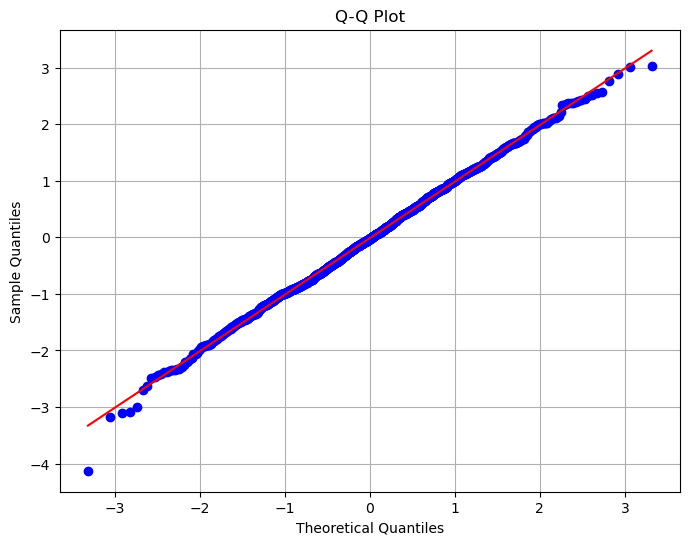

In [101]:
##A Q-Q (quantile-quantile) plot is a graphical tool to assess if a dataset follows a specified distribution (usually normal).
#Create a Q-Q plot
plt.figure(figsize=(8, 6))
stats.probplot(df_new['Value'], dist="norm", plot=plt)

#Add titles and labels
plt.title('Q-Q Plot')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

# Show the plot
plt.grid()
plt.show()

# Time Series
- Intake of Cows Milk by Milk Processors and Co-Ops
- Consumo de leite de vaca por processadores de leite e cooperativast?

In [103]:
!pip install pmdarima

In [104]:
from datetime import datetime
#registro de converters para uso do matplotlib
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima.arima import auto_arima

In [105]:
df_milk=pd.read_csv('AKM01.20241202T221206.csv')

In [106]:
df_milk.head()

,Statistic Label,Month,Domestic or Import Source,UNIT,VALUE
0,Intake of Cows Milk by Milk Processors and Co-Ops,1975 January,Domestic,Million Litres,55.8
1,Intake of Cows Milk by Milk Processors and Co-Ops,1975 February,Domestic,Million Litres,84.4
2,Intake of Cows Milk by Milk Processors and Co-Ops,1975 March,Domestic,Million Litres,193.3
3,Intake of Cows Milk by Milk Processors and Co-Ops,1975 April,Domestic,Million Litres,327.5
4,Intake of Cows Milk by Milk Processors and Co-Ops,1975 May,Domestic,Million Litres,493.5


In [107]:
df_milk.shape

(597, 5)

In [108]:
df_milk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 597 entries, 0 to 596
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Statistic Label            597 non-null    object 
 1   Month                      597 non-null    object 
 2   Domestic or Import Source  597 non-null    object 
 3   UNIT                       597 non-null    object 
 4   VALUE                      597 non-null    float64
dtypes: float64(1), object(4)
memory usage: 23.4+ KB


In [109]:
df_milk.describe()

,VALUE
count,597.000000
mean,460.445025
std,252.043553
min,55.800000
25%,218.000000
50%,461.200000
75%,643.200000
max,1181.000000


In [110]:
df_milk.isnull().sum()

Statistic Label              0
Month                        0
Domestic or Import Source    0
UNIT                         0
VALUE                        0
dtype: int64

In [111]:
df_milk.dtypes

Statistic Label               object
Month                         object
Domestic or Import Source     object
UNIT                          object
VALUE                        float64
dtype: object

## Data cleaning

In [113]:
df_milk= df_milk.drop(columns=['Statistic Label', 'Domestic or Import Source', 'UNIT'])

In [114]:
df_milk.head()

,Month,VALUE
0,1975 January,55.8
1,1975 February,84.4
2,1975 March,193.3
3,1975 April,327.5
4,1975 May,493.5


In [115]:
# creation of the year variable
# and extraction of the first 4 data values ​​from the Quarter variable for the year variable

df_milk['Year'] = df_milk['Month'].str[:4]  # Extract the first 4 characters (year)

In [116]:
df_milk.head()


,Month,VALUE,Year
0,1975 January,55.8,1975
1,1975 February,84.4,1975
2,1975 March,193.3,1975
3,1975 April,327.5,1975
4,1975 May,493.5,1975


##Start

In [118]:
df_milk['Month'] = pd.to_datetime(df_milk['Month'], format='%Y %B')#  converter variavel Month em um Datatime com a funcao pd.to_datetime() 

In [119]:
df_milk.set_index('Month', inplace=True)# defenir index

In [120]:
df_milk.head()

,VALUE,Year
Month,,
1975-01-01,55.8,1975
1975-02-01,84.4,1975
1975-03-01,193.3,1975
1975-04-01,327.5,1975
1975-05-01,493.5,1975


In [121]:
df_milk.dtypes

VALUE    float64
Year      object
dtype: object

In [122]:
time_series = df_milk['VALUE']
time_series

Month
1975-01-01      55.8
1975-02-01      84.4
1975-03-01     193.3
1975-04-01     327.5
1975-05-01     493.5
               ...  
2024-05-01    1107.4
2024-06-01    1032.5
2024-07-01     973.9
2024-08-01     888.9
2024-09-01     769.6
Name: VALUE, Length: 597, dtype: float64

In [123]:
time_series[1]

C:\Users\tecap\AppData\Local\Temp\ipykernel_40516\573606877.py:1: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



84.4

In [124]:
time_series['1975-02']

Month
1975-02-01    84.4
Name: VALUE, dtype: float64

In [125]:
time_series['1975-01-01':'2024-09-01']

Month
1975-01-01      55.8
1975-02-01      84.4
1975-03-01     193.3
1975-04-01     327.5
1975-05-01     493.5
               ...  
2024-05-01    1107.4
2024-06-01    1032.5
2024-07-01     973.9
2024-08-01     888.9
2024-09-01     769.6
Name: VALUE, Length: 597, dtype: float64

In [126]:
time_series.index.max()

Timestamp('2024-09-01 00:00:00')

In [127]:
time_series.index.min()

Timestamp('1975-01-01 00:00:00')

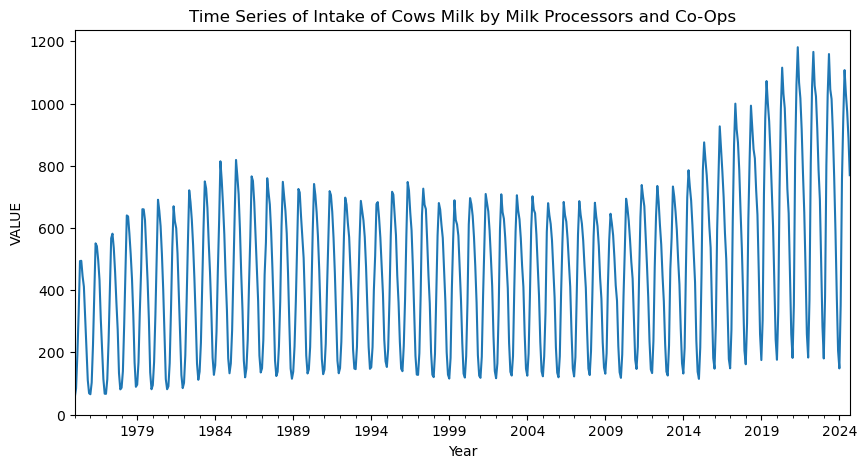

In [128]:
df_milk['VALUE'].plot(title='Time Series of Intake of Cows Milk by Milk Processors and Co-Ops', figsize=(10, 5))
plt.xlabel('Year')
plt.ylabel('VALUE')
plt.show()


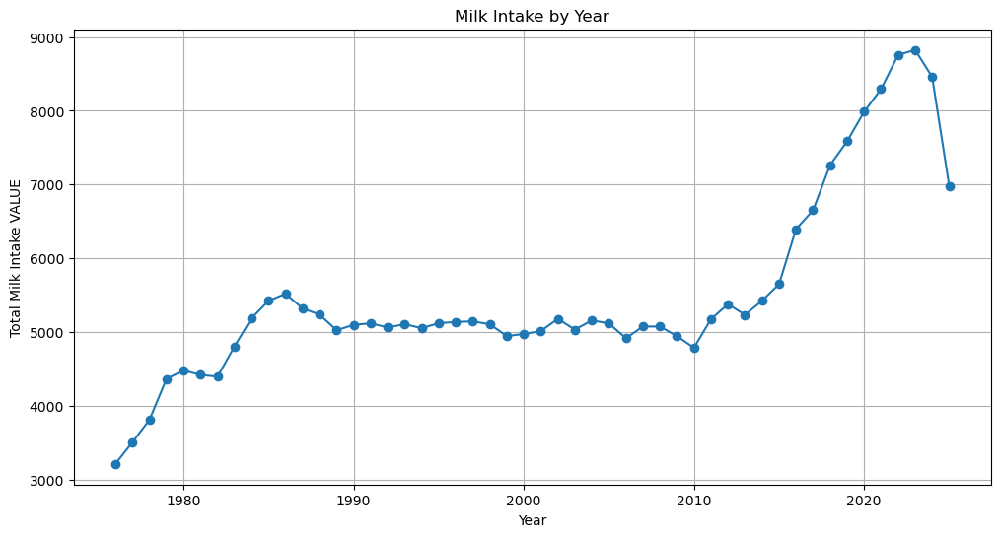

Month
1975-12-31    3212.00
1976-12-31    3504.40
1977-12-31    3809.50
1978-12-31    4362.90
1979-12-31    4478.10
1980-12-31    4418.10
1981-12-31    4394.20
1982-12-31    4805.10
1983-12-31    5186.20
1984-12-31    5422.90
1985-12-31    5518.30
1986-12-31    5320.10
1987-12-31    5235.00
1988-12-31    5023.40
1989-12-31    5096.90
1990-12-31    5117.20
1991-12-31    5061.40
1992-12-31    5105.00
1993-12-31    5051.80
1994-12-31    5119.50
1995-12-31    5135.60
1996-12-31    5144.30
1997-12-31    5104.60
1998-12-31    4944.40
1999-12-31    4973.30
2000-12-31    5011.30
2001-12-31    5178.70
2002-12-31    5032.30
2003-12-31    5157.00
2004-12-31    5116.00
2005-12-31    4915.30
2006-12-31    5073.80
2007-12-31    5074.30
2008-12-31    4943.30
2009-12-31    4785.30
2010-12-31    5173.40
2011-12-31    5377.10
2012-12-31    5232.50
2013-12-31    5422.70
2014-12-31    5648.60
2015-12-31    6395.30
2016-12-31    6651.00
2017-12-31    7262.80
2018-12-31    7585.10
2019-12-31    7986.20
2020

In [129]:
# Resample the time series to annual frequency and sum the values
time_series_year = df_milk['VALUE'].resample('YE').sum()

# Plot the annual resampled time series
plt.figure(figsize=(12, 6))
plt.plot(time_series_year, marker='o')
plt.title('Milk Intake by Year')
plt.xlabel('Year')
plt.ylabel('Total Milk Intake VALUE')
plt.grid()
plt.show()

time_series_year


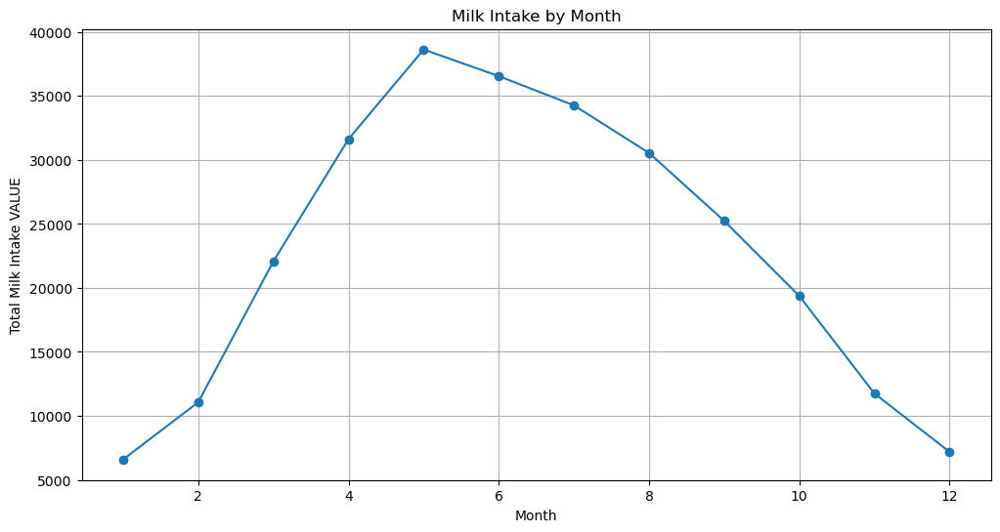

Month
1      6587.09
2     11060.48
3     22071.81
4     31624.43
5     38631.84
6     36552.80
7     34268.70
8     30546.71
9     25240.32
10    19371.23
11    11746.32
12     7183.95
Name: VALUE, dtype: float64

In [130]:
# Resample the time series to monthly frequency and sum the values
time_series_month = time_series.groupby([lambda x: x.month]).sum()

# Plot the monthly resampled time series
plt.figure(figsize=(12, 6))
plt.plot(time_series_month, marker='o')
plt.title('Milk Intake by Month')
plt.xlabel('Month')
plt.ylabel('Total Milk Intake VALUE')
plt.grid()
plt.show()

time_series_month


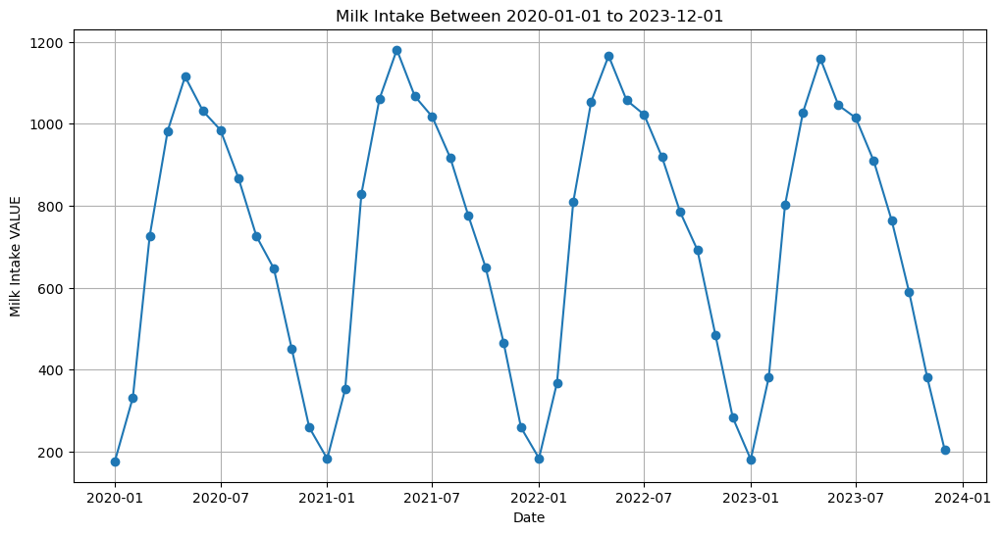

In [131]:
# Attempting to filter and visualize the time series between specific dates
try:
    ts_datas = df_milk['VALUE']['2020-01-01':'2023-12-01']
    plt.figure(figsize=(12, 6))
    plt.plot(ts_datas, marker='o')
    plt.title('Milk Intake Between 2020-01-01 to 2023-12-01')
    plt.xlabel('Date')
    plt.ylabel('Milk Intake VALUE')
    plt.grid()
    plt.show()

# error handling
except KeyError:
    "df not found."

## Decomposition
- decomposicao = seasonal_decompose(time_series)- 
tendencia = decomposicao.trend- 
sazonal = decomposicao.seasona- l
aleatorio = decomposicao.resid

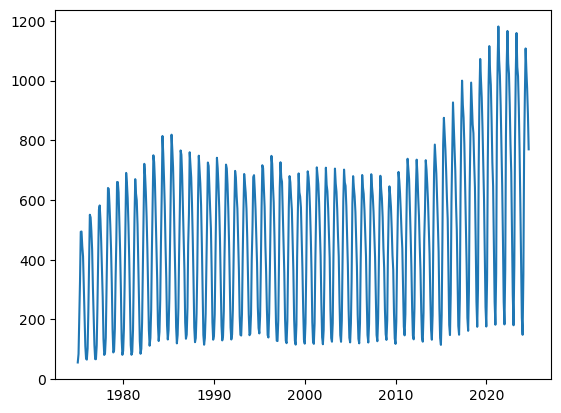

In [133]:
# Visualização da série temporal
plt.plot(time_series)

In [134]:
# Decomposição da série temporal, criando uma variável para cada formato
decomposicao = seasonal_decompose(time_series)

In [135]:
#tendencia
tendencia = decomposicao.trend
tendencia

Month
1975-01-01   NaN
1975-02-01   NaN
1975-03-01   NaN
1975-04-01   NaN
1975-05-01   NaN
              ..
2024-05-01   NaN
2024-06-01   NaN
2024-07-01   NaN
2024-08-01   NaN
2024-09-01   NaN
Name: trend, Length: 597, dtype: float64

In [136]:
#sozonalidade
sazonal = decomposicao.seasonal
sazonal

Month
1975-01-01   -327.106441
1975-02-01   -237.251884
1975-03-01    -15.549401
1975-04-01    173.945958
1975-05-01    312.679387
                 ...    
2024-05-01    312.679387
2024-06-01    270.553571
2024-07-01    224.051135
2024-08-01    149.520582
2024-09-01     42.954630
Name: seasonal, Length: 597, dtype: float64

In [137]:
#erro
aleatorio = decomposicao.resid
aleatorio

Month
1975-01-01   NaN
1975-02-01   NaN
1975-03-01   NaN
1975-04-01   NaN
1975-05-01   NaN
              ..
2024-05-01   NaN
2024-06-01   NaN
2024-07-01   NaN
2024-08-01   NaN
2024-09-01   NaN
Name: resid, Length: 597, dtype: float64

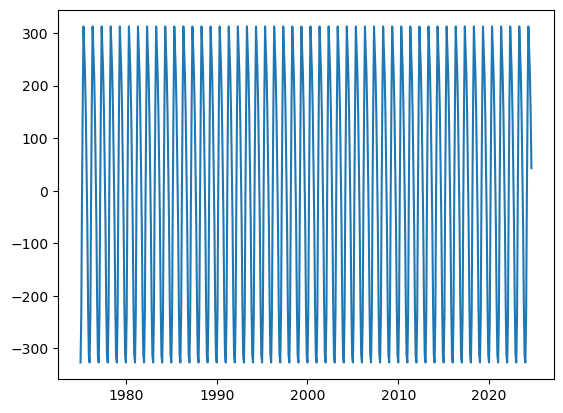

In [138]:
# Visualização de gráfico para cada formato da série temporal
plt.plot(sazonal)

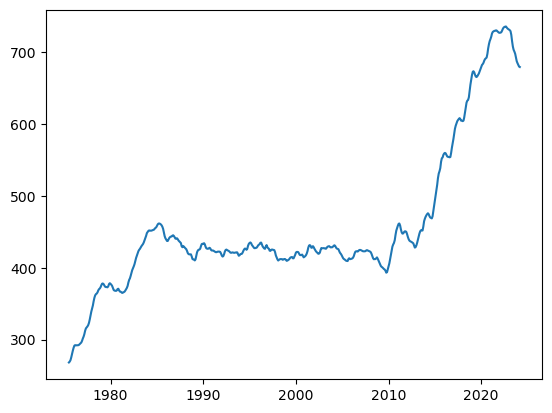

In [139]:
plt.plot(tendencia)

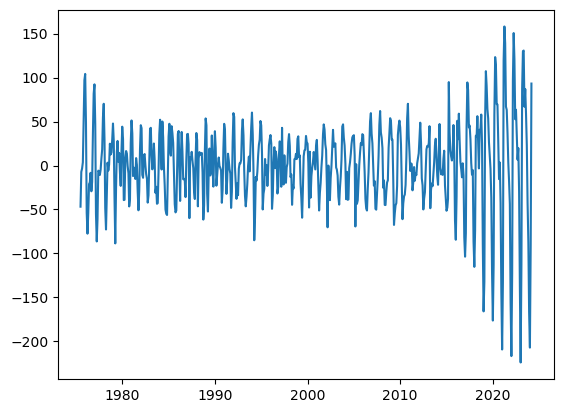

In [140]:
plt.plot(aleatorio)# é o erro as observesoes quer nao se consege esplicar matematicamente

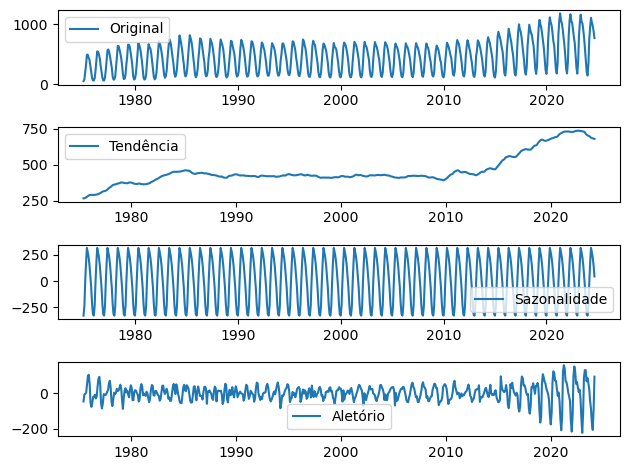

In [141]:
plt.subplot(4,1,1)
plt.plot(time_series, label = 'Original')
plt.legend(loc = 'best')

# Visualização somente da tendência
plt.subplot(4,1,2)
plt.plot(tendencia, label = 'Tendência')
plt.legend(loc = 'best')

# Visualização somente da sazonalidade
plt.subplot(4,1,3)
plt.plot(sazonal, label = 'Sazonalidade')
plt.legend(loc = 'best')

# Visualização somente do elemento aleatório
plt.subplot(4,1,4)
plt.plot(aleatorio, label = 'Aletório')
plt.legend(loc = 'best')
plt.tight_layout()

## Arima

In [143]:
df_milk

,VALUE,Year
Month,,
1975-01-01,55.8,1975
1975-02-01,84.4,1975
1975-03-01,193.3,1975
1975-04-01,327.5,1975
1975-05-01,493.5,1975
...,...,...
2024-05-01,1107.4,2024
2024-06-01,1032.5,2024
2024-07-01,973.9,2024


In [144]:
df_milk= df_milk.drop(columns=['Year'])# auto_arima requer uma série unidimensional,AIC é a metrica que avalia o quanto o modele é bom, o objectivo é menimizar o AIC, quano memor o AIC melhor

In [145]:
stepwise_model = auto_arima(df_milk, start_p=1,start_q=1,start_d= 0, start_P=0, max_p=3, max_q=3, m=12, seasonal=True, trace=True, stepwise=False)

 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=5794.367, Time=0.06 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=5792.350, Time=0.42 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=5788.488, Time=0.83 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=5791.550, Time=0.68 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=5792.115, Time=1.09 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=5779.620, Time=1.85 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=5789.334, Time=0.67 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=5783.185, Time=1.96 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=5.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=5578.808, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=5543.548, Time=0.86 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=5538.780, Time=1.81 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=5540.012, Time=0.71 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=5541.814, Time=1.05 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=5528.577, Time=2.43 sec


In [146]:
print(stepwise_model.aic())

5339.740540237706


In [147]:
stepwise_model = auto_arima(df_milk, start_p=1,start_q=1,start_d= 0, start_P=0, max_p=3, max_q=3, m=12, seasonal=True, trace=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=5362.149, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=5794.367, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=5374.631, Time=0.88 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=5543.548, Time=0.72 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=5827.206, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=5474.325, Time=0.20 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=5358.519, Time=0.92 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=5374.154, Time=1.04 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=5355.740, Time=3.84 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=5353.828, Time=1.96 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=5541.647, Time=1.37 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=5352.548, Time=1.74 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=5354.504, Time=2.71 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=5357.377, Time=1.16 sec
 ARIMA(0,0,0)(2,1,0

In [148]:
print(stepwise_model.aic())

5336.7351241932


In [149]:
train = df_milk.loc['1975-01-01':'2023-12-01']
test = df_milk.loc['2024-01-01':]

In [150]:
train

,VALUE
Month,
1975-01-01,55.80
1975-02-01,84.40
1975-03-01,193.30
1975-04-01,327.50
1975-05-01,493.50
...,...
2023-08-01,909.10
2023-09-01,763.70
2023-10-01,588.67


In [151]:
 test

,VALUE
Month,
2024-01-01,148.47
2024-02-01,351.90
2024-03-01,757.20
2024-04-01,952.00
2024-05-01,1107.40
2024-06-01,1032.50
2024-07-01,973.90
2024-08-01,888.90
2024-09-01,769.60


In [152]:
stepwise_model.fit(train)

ARIMA(order=(3, 0, 2), scoring_args={}, seasonal_order=(2, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [153]:
future_forecast = stepwise_model.predict(n_periods=24)

In [154]:
future_forecast

2024-01-01     134.564947
2024-02-01     339.375185
2024-03-01     784.027685
2024-04-01    1025.522981
2024-05-01    1148.969393
2024-06-01    1041.484330
2024-07-01    1004.461924
2024-08-01     903.727630
2024-09-01     761.891071
2024-10-01     625.246125
2024-11-01     421.818423
2024-12-01     232.487124
2025-01-01     149.524352
2025-02-01     350.145671
2025-03-01     785.227860
2025-04-01    1024.364095
2025-05-01    1146.616177
2025-06-01    1038.241736
2025-07-01    1002.725208
2025-08-01     900.945561
2025-09-01     759.027711
2025-10-01     620.467710
2025-11-01     414.407802
2025-12-01     227.309868
Freq: MS, dtype: float64

In [155]:
future_forecast = pd.DataFrame(future_forecast,index = test.index,columns=["Month"])

<Axes: xlabel='Month'>

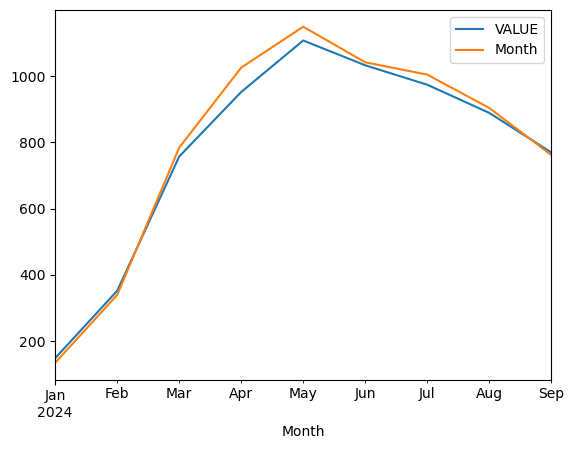

In [156]:
#azul test laranja forecast
pd.concat([test,future_forecast],axis=1).plot()

<Axes: xlabel='Month'>

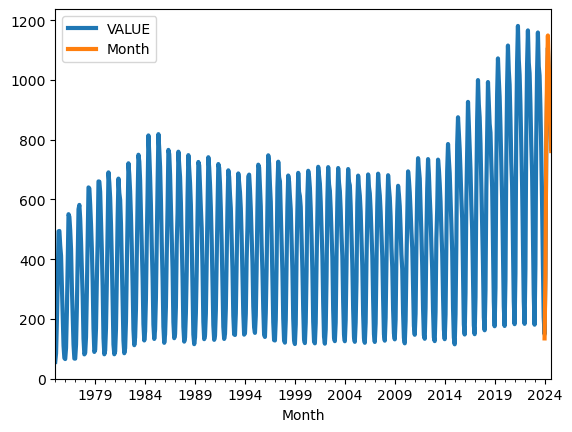

In [157]:
pd.concat([df_milk,future_forecast],axis=1).plot(linewidth=3)


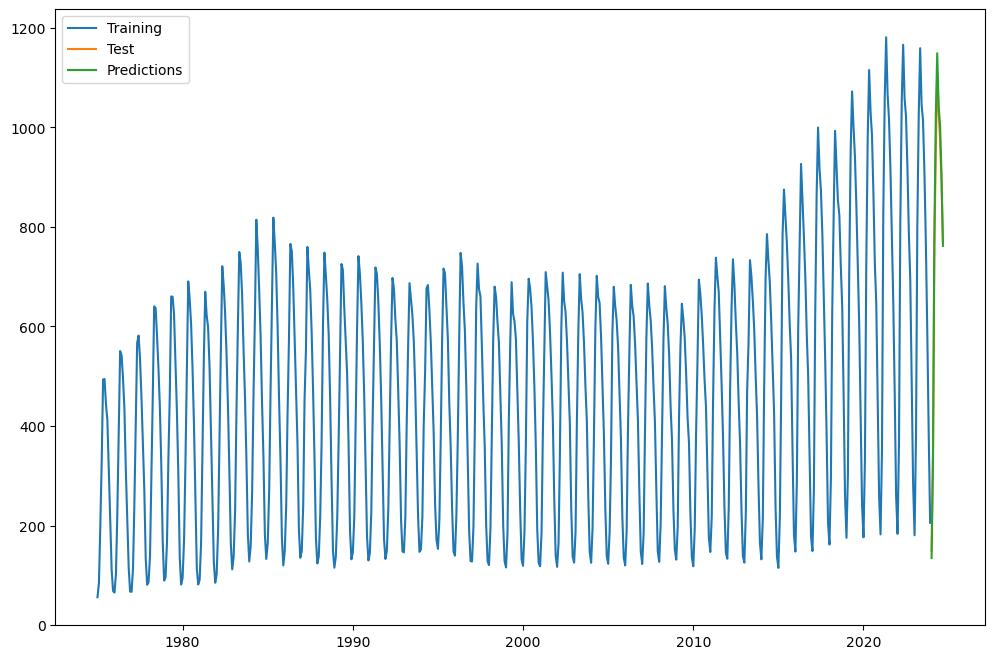

In [158]:

plt.figure(figsize=(12,8))
plt.plot(train, label = 'Training')
plt.plot(test, label = 'Test')
plt.plot(future_forecast, label = 'Predictions')
plt.legend();


## Time serios 2

In [160]:
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [161]:
pip install mglearn

Note: you may need to restart the kernel to use updated packages.


In [162]:
import mglearn

In [163]:
df_milk.head()

,VALUE
Month,
1975-01-01,55.8
1975-02-01,84.4
1975-03-01,193.3
1975-04-01,327.5
1975-05-01,493.5


In [164]:
# Display the citibike values
df_milk.index.astype("int64").values
df_milk.values

array([[  55.8 ],
       [  84.4 ],
       [ 193.3 ],
       [ 327.5 ],
       [ 493.5 ],
       [ 494.4 ],
       [ 445.3 ],
       [ 411.5 ],
       [ 310.8 ],
       [ 216.5 ],
       [ 110.5 ],
       [  68.5 ],
       [  65.4 ],
       [ 102.7 ],
       [ 222.8 ],
       [ 388.4 ],
       [ 550.5 ],
       [ 541.5 ],
       [ 496.9 ],
       [ 433.8 ],
       [ 307.3 ],
       [ 213.9 ],
       [ 114.1 ],
       [  67.1 ],
       [  66.7 ],
       [ 113.7 ],
       [ 236.9 ],
       [ 399.8 ],
       [ 567.1 ],
       [ 581.6 ],
       [ 535.4 ],
       [ 458.9 ],
       [ 361.5 ],
       [ 273.7 ],
       [ 133.2 ],
       [  81.  ],
       [  86.3 ],
       [ 139.2 ],
       [ 289.2 ],
       [ 459.3 ],
       [ 640.2 ],
       [ 637.  ],
       [ 582.3 ],
       [ 516.2 ],
       [ 436.2 ],
       [ 320.6 ],
       [ 167.1 ],
       [  89.3 ],
       [  96.3 ],
       [ 168.3 ],
       [ 327.7 ],
       [ 462.5 ],
       [ 660.3 ],
       [ 659.7 ],
       [ 625.1 ],
       [ 5

Text(0, 0.5, 'Rentals')

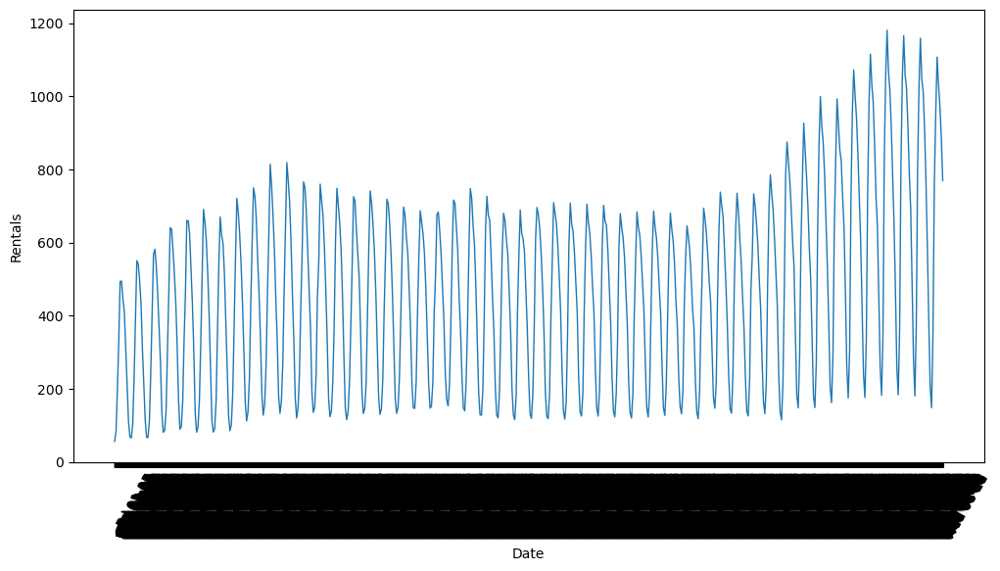

In [165]:
# Set the size of the data set
plt.figure(figsize = (12, 6))

# Arrange the data set using date_range() method
ts = pd.date_range(start = time_series.index.min(), end = time_series.index.max(), freq = 'D')

# Set the date format for the plot
plt.xticks(ts, ts.strftime("%a %m-%d"), rotation = 60, ha = "left")
# plt.xticks(xticks, xticks.strftime("%d-%m-%d"), rotation = 90, ha = "left")

plt.plot(time_series, linewidth = 1)
plt.xlabel("Date")
plt.ylabel("Rentals")

In [166]:
# extract the target values (number of rentals)
y = time_series.values

# convert to POSIX time by dividing by 10**9
X = time_series.index.astype("int64").values.reshape(-1, 1) // 10**9

X.shape, y.shape

((597, 1), (597,))

In [167]:
print(X[:20])

[[157766400]
 [160444800]
 [162864000]
 [165542400]
 [168134400]
 [170812800]
 [173404800]
 [176083200]
 [178761600]
 [181353600]
 [184032000]
 [186624000]
 [189302400]
 [191980800]
 [194486400]
 [197164800]
 [199756800]
 [202435200]
 [205027200]
 [207705600]]


In [168]:
n_train = len(df_milk.loc['1975-01-01':'2023-12-01'])

# function to evaluate and plot a regressor on a given feature set
def eval_on_features(features, target, regressor):
    # split the given features into a training and a test set
    X_train, X_test = features[:n_train], features[n_train:]
   
    # also split the target array
    y_train, y_test = target[:n_train], target[n_train:]    
    
    regressor.fit(X_train, y_train)
    print("Test-set R^2: {:.2f}".format(regressor.score(X_test, y_test)))
    
    y_pred = regressor.predict(X_test)
    y_pred_train = regressor.predict(X_train)
    plt.figure(figsize = (10, 3))

    plt.plot(range(n_train), y_train, label="Train")  # Training data
    plt.plot(range(n_train, n_train + len(y_test)), y_test, '-', label="Test")  # Test data
    plt.plot(range(n_train), y_pred_train, '--', label="Prediction Train")  # Prediction on train
    plt.plot(range(n_train, n_train + len(y_test)), y_pred, '--', label="Prediction Test")  # Prediction on test

    plt.plot(range(n_train, len(y_test) + n_train), y_pred, '--', label = "prediction test")
    plt.legend(loc = (1.01, 0))
    plt.xlabel("Date")
    plt.ylabel("Rentals")

In [169]:
print(X, y)

[[ 157766400]
 [ 160444800]
 [ 162864000]
 [ 165542400]
 [ 168134400]
 [ 170812800]
 [ 173404800]
 [ 176083200]
 [ 178761600]
 [ 181353600]
 [ 184032000]
 [ 186624000]
 [ 189302400]
 [ 191980800]
 [ 194486400]
 [ 197164800]
 [ 199756800]
 [ 202435200]
 [ 205027200]
 [ 207705600]
 [ 210384000]
 [ 212976000]
 [ 215654400]
 [ 218246400]
 [ 220924800]
 [ 223603200]
 [ 226022400]
 [ 228700800]
 [ 231292800]
 [ 233971200]
 [ 236563200]
 [ 239241600]
 [ 241920000]
 [ 244512000]
 [ 247190400]
 [ 249782400]
 [ 252460800]
 [ 255139200]
 [ 257558400]
 [ 260236800]
 [ 262828800]
 [ 265507200]
 [ 268099200]
 [ 270777600]
 [ 273456000]
 [ 276048000]
 [ 278726400]
 [ 281318400]
 [ 283996800]
 [ 286675200]
 [ 289094400]
 [ 291772800]
 [ 294364800]
 [ 297043200]
 [ 299635200]
 [ 302313600]
 [ 304992000]
 [ 307584000]
 [ 310262400]
 [ 312854400]
 [ 315532800]
 [ 318211200]
 [ 320716800]
 [ 323395200]
 [ 325987200]
 [ 328665600]
 [ 331257600]
 [ 333936000]
 [ 336614400]
 [ 339206400]
 [ 341884800]
 [ 344

Test-set R^2: -2.51


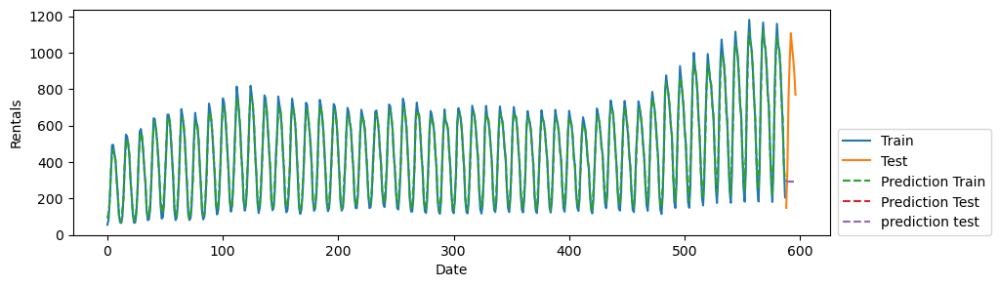

In [170]:
from sklearn.ensemble import RandomForestRegressor

# Create an object 'regressor' by calling a method RandomForestRegressor()
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)

# Call the method eval_on_features() to calculate the R^2 and plot
eval_on_features(X, y, regressor)

In [171]:
x

array([1961.        , 1961.61616162, 1962.23232323, 1962.84848485,
       1963.46464646, 1964.08080808, 1964.6969697 , 1965.31313131,
       1965.92929293, 1966.54545455, 1967.16161616, 1967.77777778,
       1968.39393939, 1969.01010101, 1969.62626263, 1970.24242424,
       1970.85858586, 1971.47474747, 1972.09090909, 1972.70707071,
       1973.32323232, 1973.93939394, 1974.55555556, 1975.17171717,
       1975.78787879, 1976.4040404 , 1977.02020202, 1977.63636364,
       1978.25252525, 1978.86868687, 1979.48484848, 1980.1010101 ,
       1980.71717172, 1981.33333333, 1981.94949495, 1982.56565657,
       1983.18181818, 1983.7979798 , 1984.41414141, 1985.03030303,
       1985.64646465, 1986.26262626, 1986.87878788, 1987.49494949,
       1988.11111111, 1988.72727273, 1989.34343434, 1989.95959596,
       1990.57575758, 1991.19191919, 1991.80808081, 1992.42424242,
       1993.04040404, 1993.65656566, 1994.27272727, 1994.88888889,
       1995.50505051, 1996.12121212, 1996.73737374, 1997.35353

## PRE-PROCESSING SUMMARY
target = variable to be targeted.

features = set of predictor variables with categorical variables transformed into numeric ones by the labelencoder.

features_esc = set of predictor variables with categorical variables transformed into numeric ones, Normalization.

df_new_encoded = set of predictor variables transformed by the labelencoder and onehotencoder, without Normalization.

df_new_encoded_esc = set of predictor variables transformed by the labelencoder and onehotencoder Normalization.

In [173]:
df_new_3.head()

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14


In [174]:
df_new_3.shape

(4069, 4)

In [175]:
df_new_3.dtypes

Area      object
Item      object
Year       int64
Value    float64
dtype: object

## One-Hot Encoding

In [177]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# One-Hot Encoding on categorical variables
df_new3_encoded = pd.get_dummies(df_new_3, columns=['Area','Item'])

In [178]:
df_new3_encoded.head()

,Year,Value,Area_Albania,Area_Austria,Area_Belarus,Area_Belgium,Area_Bosnia and Herzegovina,Area_Bulgaria,Area_Croatia,Area_Czechia,...,Area_Spain,Area_Sweden,Area_Switzerland,Area_Ukraine,Area_United Kingdom of Great Britain and Northern Ireland,Item_Raw milk of buffalo,Item_Raw milk of camel,Item_Raw milk of cattle,Item_Raw milk of goats,Item_Raw milk of sheep
0,1961,3701.63,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
1,1962,3405.50,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
2,1963,3035.34,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
3,1964,2887.27,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
4,1965,2591.14,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False


In [179]:
df_new3_encoded.shape

(4069, 47)

In [180]:
df_new3_encoded_df = pd.DataFrame(df_new3_encoded)
df_new3_encoded_df

,Year,Value,Area_Albania,Area_Austria,Area_Belarus,Area_Belgium,Area_Bosnia and Herzegovina,Area_Bulgaria,Area_Croatia,Area_Czechia,...,Area_Spain,Area_Sweden,Area_Switzerland,Area_Ukraine,Area_United Kingdom of Great Britain and Northern Ireland,Item_Raw milk of buffalo,Item_Raw milk of camel,Item_Raw milk of cattle,Item_Raw milk of goats,Item_Raw milk of sheep
0,1961,3701.63,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
1,1962,3405.50,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
2,1963,3035.34,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
3,1964,2887.27,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
4,1965,2591.14,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4064,2018,101.99,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
4065,2019,104.39,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
4066,2020,104.49,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
4067,2021,104.39,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False


# LabelEncoder

In [182]:
from sklearn.preprocessing import LabelEncoder
# Encode the 'Area of ​​Residence' column
# Create an instance of LabelEncoder

label_encoder = LabelEncoder()

df_new_3['Area'] = label_encoder.fit_transform(df_new_3['Area'])
df_new_3['Item'] = label_encoder.fit_transform(df_new_3['Item'])
df_new_3.head()

,Area,Item,Year,Value
0,0,0,1961,3701.63
1,0,0,1962,3405.50
2,0,0,1963,3035.34
3,0,0,1964,2887.27
4,0,0,1965,2591.14


In [183]:
df_new_3.dtypes

Area       int32
Item       int32
Year       int64
Value    float64
dtype: object

In [184]:
df_new_3.shape

(4069, 4)

# Predictor and Target Attributes

In [186]:
df_new_3.head()

,Area,Item,Year,Value
0,0,0,1961,3701.63
1,0,0,1962,3405.50
2,0,0,1963,3035.34
3,0,0,1964,2887.27
4,0,0,1965,2591.14


In [187]:
# Moving column 'Item' to position 4
df_new_3 = df_new_3[['Area', 'Year', 'Value','Item']]

In [188]:
df_new_3.head()

,Area,Year,Value,Item
0,0,1961,3701.63,0
1,0,1962,3405.50,0
2,0,1963,3035.34,0
3,0,1964,2887.27,0
4,0,1965,2591.14,0


In [189]:
# # Select features (predictor variables) - columns 0 to 3
features = df_new_3.iloc[:, 0:3].values  # This selects columns 0 through 3 as features.

In [190]:
features

array([[   0.  , 1961.  , 3701.63],
       [   0.  , 1962.  , 3405.5 ],
       [   0.  , 1963.  , 3035.34],
       ...,
       [  39.  , 2020.  ,  104.49],
       [  39.  , 2021.  ,  104.39],
       [  39.  , 2022.  ,  103.52]])

In [191]:
features.shape

(4069, 3)

In [192]:
# # Select target variable - column 4 ('VALUE')
target = df_new_3.iloc[:, 3].values  # This selects the target variable

In [193]:
target

array([0, 0, 0, ..., 2, 2, 2])

In [194]:
target.shape

(4069,)

# escalonamento
# MinMaxScaler on non-normal data
* Normalization (uses maximum and minimum values ​​as reference).
* df_new3_encoded_es
* usa a media proxima de 0 e o desvio padrao std proximo de 1

In [196]:
# Apply normalization to feature data
df_new3_encoded_esc = MinMaxScaler().fit_transform(df_new3_encoded)

In [197]:
df_new3_encoded_esc

array([[0.        , 0.73563792, 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.01639344, 0.6767682 , 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.03278689, 0.60318155, 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.96721311, 0.02053771, 0.        , ..., 1.        , 0.        ,
        0.        ],
       [0.98360656, 0.02051783, 0.        , ..., 1.        , 0.        ,
        0.        ],
       [1.        , 0.02034487, 0.        , ..., 1.        , 0.        ,
        0.        ]])

In [198]:
df_new3_encoded_esc_df = pd.DataFrame(df_new3_encoded_esc)
df_new3_encoded_esc_df

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
0,0.000000,0.735638,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.016393,0.676768,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.032787,0.603182,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.049180,0.573746,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.065574,0.514876,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4064,0.934426,0.020041,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4065,0.950820,0.020518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4066,0.967213,0.020538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4067,0.983607,0.020518,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [199]:
df_new3_encoded_esc_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
count,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,...,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000,4069.000000
mean,0.547547,0.032552,0.060703,0.042025,0.013271,0.008847,0.015237,0.056033,0.016220,0.006144,...,0.042025,0.014008,0.038339,0.022856,0.015237,0.057016,0.004915,0.423691,0.271811,0.242566
std,0.277484,0.078265,0.238814,0.200671,0.114447,0.093655,0.122510,0.230015,0.126337,0.078152,...,0.200671,0.117539,0.192036,0.149462,0.122510,0.231903,0.069945,0.494203,0.444948,0.428687
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.311475,0.015786,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.590164,0.019079,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.786885,0.022595,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# MinMaxScaler on non-normal data
* Normalization (uses maximum and minimum values ​​as reference).
* features_esc

In [201]:
# Apply normalization to feature data
features_esc = MinMaxScaler().fit_transform(features)

In [202]:
features_esc

array([[0.        , 0.        , 0.73563792],
       [0.        , 0.01639344, 0.6767682 ],
       [0.        , 0.03278689, 0.60318155],
       ...,
       [1.        , 0.96721311, 0.02053771],
       [1.        , 0.98360656, 0.02051783],
       [1.        , 1.        , 0.02034487]])

In [203]:
# I Put the feature values ​​in a df

features_df = pd.DataFrame(features_esc)
features_df

,0,1,2
0,0.0,0.000000,0.735638
1,0.0,0.016393,0.676768
2,0.0,0.032787,0.603182
3,0.0,0.049180,0.573746
4,0.0,0.065574,0.514876
...,...,...,...
4064,1.0,0.934426,0.020041
4065,1.0,0.950820,0.020518
4066,1.0,0.967213,0.020538
4067,1.0,0.983607,0.020518


In [204]:
features_df.describe()

,0,1,2
count,4069.000000,4069.000000,4069.000000
mean,0.490834,0.547547,0.032552
std,0.302184,0.277484,0.078265
min,0.000000,0.000000,0.000000
25%,0.282051,0.311475,0.015786
50%,0.461538,0.590164,0.019079
75%,0.743590,0.786885,0.022595
max,1.000000,1.000000,1.000000


In [205]:
features.shape

(4069, 3)

# Classification
* features_esc
* df_new3_encoded_es

In [207]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features_esc, target, test_size=0.2, random_state=42)

In [208]:
X_train.shape

(3255, 3)

In [209]:
X_test.shape

(814, 3)

In [210]:
y_train.shape

(3255,)

In [211]:
y_test.shape

(814,)

In [212]:
y_test

array([2, 4, 3, 2, 4, 3, 3, 2, 3, 4, 3, 4, 3, 3, 2, 2, 4, 2, 2, 4, 4, 3,
       2, 2, 4, 4, 2, 2, 2, 3, 2, 2, 3, 4, 2, 2, 2, 3, 4, 0, 4, 3, 2, 1,
       2, 2, 3, 2, 4, 2, 0, 3, 4, 2, 4, 2, 3, 3, 2, 2, 2, 2, 3, 0, 2, 2,
       2, 3, 2, 4, 3, 2, 2, 3, 3, 2, 4, 2, 2, 2, 4, 3, 3, 4, 3, 3, 4, 2,
       2, 3, 2, 3, 3, 3, 4, 0, 4, 3, 3, 2, 2, 2, 0, 3, 2, 3, 2, 2, 2, 4,
       0, 2, 3, 2, 3, 3, 4, 4, 2, 3, 4, 2, 4, 3, 0, 2, 3, 2, 2, 2, 2, 4,
       3, 4, 2, 2, 4, 2, 4, 2, 0, 3, 4, 3, 4, 2, 2, 4, 0, 2, 4, 4, 3, 2,
       3, 4, 3, 2, 2, 2, 4, 2, 2, 2, 3, 4, 2, 3, 2, 3, 3, 3, 3, 2, 3, 0,
       2, 3, 3, 3, 4, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 4, 0, 2, 3, 3,
       3, 2, 4, 4, 3, 3, 2, 3, 3, 4, 2, 4, 2, 2, 3, 2, 3, 2, 4, 2, 3, 3,
       4, 4, 3, 3, 2, 0, 3, 2, 2, 4, 3, 2, 4, 3, 2, 2, 3, 4, 2, 2, 3, 2,
       2, 2, 3, 0, 3, 3, 4, 4, 4, 2, 2, 2, 3, 4, 2, 2, 2, 4, 3, 4, 2, 2,
       2, 4, 4, 2, 2, 4, 4, 2, 4, 2, 2, 2, 3, 2, 2, 4, 3, 3, 2, 3, 4, 2,
       3, 2, 3, 4, 2, 2, 0, 3, 4, 2, 4, 4, 0, 4, 2,

In [213]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
import pandas as pd
# Defining the classification models to be used in the test
models = {
    "Logistic Regression": LogisticRegression(max_iter=500),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "k-Nearest Neighbour": KNeighborsClassifier(n_neighbors=7),
    "Support Vector Machine": SVC()
}
# Store results
results = []
# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train, y_train)  # Training the model
    y_pred = model.predict(X_test)  # Making predictions on test data
    
    # # Calculate weighted precision, recall and F1-score metrics
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Add the results to the list
    results.append([name, precision, recall, f1])

# Convert the results to a DataFrame for organized visualization
results_df = pd.DataFrame(results, columns=["Model", "Precision", "Recall", "F1 Score"])
print(results_df)


                    Model  Precision    Recall  F1 Score
0     Logistic Regression   0.275451  0.441032  0.284038
1           Decision Tree   0.701952  0.701474  0.701467
2           Random Forest   0.710388  0.714988  0.709367
3     k-Nearest Neighbour   0.301120  0.332924  0.310479
4  Support Vector Machine   0.634207  0.469287  0.339115


## RandomForestClassifier

In [215]:
from sklearn.ensemble import RandomForestClassifier

In [216]:
random = RandomForestClassifier(n_estimators = 180, criterion='entropy', random_state =42, max_depth=50)
random.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=50, n_estimators=180,
                       random_state=42)

In [217]:
y_prev_random = random.predict(X_test)
y_prev_random 

array([2, 4, 2, 2, 4, 3, 3, 2, 4, 4, 2, 2, 3, 3, 2, 2, 2, 2, 2, 4, 4, 2,
       2, 2, 4, 4, 3, 2, 2, 3, 2, 3, 3, 2, 2, 2, 2, 2, 4, 0, 2, 3, 2, 2,
       2, 2, 2, 3, 4, 2, 3, 2, 3, 2, 3, 2, 3, 3, 2, 2, 2, 2, 3, 0, 2, 2,
       4, 3, 2, 4, 3, 2, 2, 3, 3, 2, 2, 2, 2, 2, 4, 3, 3, 3, 3, 2, 4, 2,
       2, 4, 2, 2, 4, 3, 4, 0, 4, 2, 3, 2, 2, 2, 0, 3, 4, 2, 2, 3, 2, 4,
       0, 2, 3, 2, 3, 3, 4, 4, 2, 4, 4, 2, 4, 4, 0, 4, 3, 3, 2, 2, 2, 4,
       3, 2, 2, 2, 4, 3, 3, 2, 0, 3, 2, 2, 4, 2, 2, 2, 0, 2, 2, 2, 3, 3,
       3, 2, 3, 2, 2, 2, 4, 2, 2, 2, 2, 4, 2, 3, 2, 3, 3, 2, 2, 2, 3, 0,
       2, 4, 3, 3, 2, 2, 2, 4, 3, 4, 2, 2, 2, 2, 4, 2, 2, 2, 0, 2, 2, 3,
       2, 2, 4, 4, 3, 3, 2, 2, 3, 3, 2, 2, 2, 2, 3, 2, 2, 2, 4, 2, 4, 3,
       4, 2, 4, 3, 2, 0, 3, 3, 2, 4, 3, 2, 4, 3, 2, 2, 2, 4, 4, 2, 4, 2,
       3, 2, 2, 0, 3, 3, 2, 3, 3, 4, 2, 2, 3, 4, 2, 2, 2, 4, 3, 4, 2, 2,
       2, 4, 2, 4, 4, 4, 4, 2, 4, 4, 2, 2, 0, 2, 2, 3, 3, 2, 3, 2, 0, 2,
       3, 2, 3, 4, 2, 2, 2, 3, 3, 2, 4, 4, 2, 4, 2,

In [218]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_prev_random))

Accuracy: 0.7174447174447175


              precision    recall  f1-score   support

           0       0.87      0.73      0.80        45
           1       0.00      0.00      0.00         3
           2       0.73      0.85      0.78       350
           3       0.69      0.60      0.64       225
           4       0.69      0.62      0.65       191

    accuracy                           0.72       814
   macro avg       0.60      0.56      0.58       814
weighted avg       0.71      0.72      0.71       814



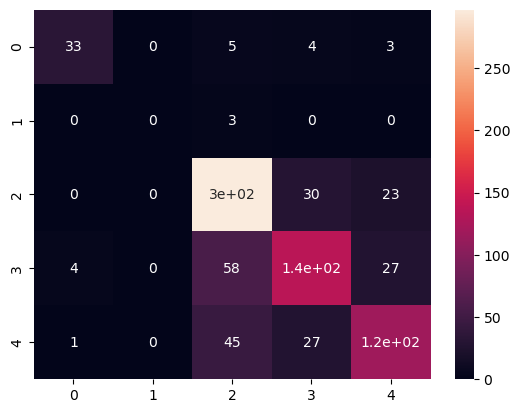

In [219]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
# Calculate cm by calling a method named as 'confusion_matrix'
cm = confusion_matrix(y_test, y_prev_random)

# Call a method heatmap() to plot confusion matrix
sns.heatmap(cm, annot = True)

# print the classification_report based on y_test and y_predict
print(classification_report(y_test, y_prev_random))

In [220]:
prev_train = random.predict(X_train)
prev_train

array([2, 4, 2, ..., 4, 4, 4])

In [221]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_train, prev_train))

Accuracy: 1.0


              precision    recall  f1-score   support

           0       1.00      1.00      1.00       187
           1       1.00      1.00      1.00        17
           2       1.00      1.00      1.00      1374
           3       1.00      1.00      1.00       881
           4       1.00      1.00      1.00       796

    accuracy                           1.00      3255
   macro avg       1.00      1.00      1.00      3255
weighted avg       1.00      1.00      1.00      3255



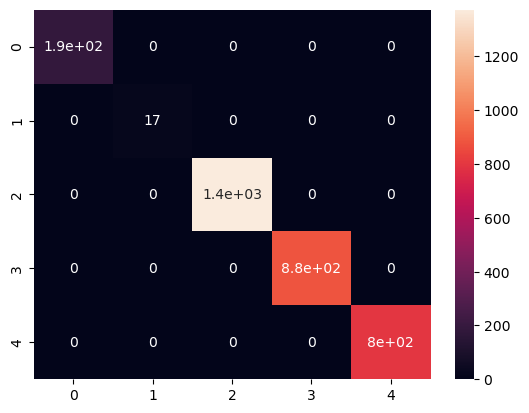

In [222]:
# Calculate cm by calling a method named as 'confusion_matrix'
cm = confusion_matrix(y_train, prev_train)
# Call a method heatmap() to plot confusion matrix
sns.heatmap(cm, annot = True)
# print the classification_report based on y_test and y_predict
print(classification_report(y_train, prev_train))

## cross validation

In [224]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [225]:
KFold = KFold(n_splits = 30, shuffle = True, random_state = 5)

In [226]:
## bldin model############################
model =  RandomForestClassifier(n_estimators = 180, criterion='entropy', random_state =42, max_depth=50)
result = cross_val_score(model, features_esc, target, cv = KFold)

# usamos a media e o desvio padrao  
print("Accuracy Media: %.2f%%" % (result.mean() * 100.0))

Accuracy Media: 72.03%


## Hyperparameter Tunnning using GridSearchCV

In [228]:
from sklearn.model_selection import train_test_split, GridSearchCV


# Definir os grids de hiperparâmetros para o modelo de classificação
param_grid = {
    'Random Forest': {
        'n_estimators': [50, 100, 200],  # Número de árvores na floresta
        'max_depth': [10, 20, None],  # Profundidade máxima da árvore
        'min_samples_split': [2, 5, 10],  # Mínimo de amostras para dividir um nó
        'min_samples_leaf': [1, 2, 4]  # Mínimo de amostras em uma folha
    }
}

# Armazenar resultados
results = []
predictions = {}  # Para armazenar previsões

# Definir o modelo em um dicionário
models = {
    "Random Forest": RandomForestClassifier(random_state=42)
}

# Loop para treinar e ajustar hiperparâmetros com Grid Search
for name, model in models.items():
    # Configurar GridSearchCV com as métricas de classificação
    grid_search = GridSearchCV(
        model, param_grid[name], cv=5, scoring='f1_weighted', n_jobs=-1
    )
    
    # Dividir os dados em conjuntos de treino e teste
    X_train, X_test, y_train, y_test = train_test_split(features_esc, target, test_size=0.2, random_state=42)
    
    # Ajustar o Grid Search
    grid_search.fit(X_train, y_train)
    
    # Obter os melhores parâmetros e pontuação
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    
    # Armazenar os resultados
    results.append([name, best_params, best_score])
    
    # Ajustar o melhor modelo nos dados de treino
    best_model = grid_search.best_estimator_
    
    # Fazer previsões no conjunto de teste
    y_pred = best_model.predict(X_test)
    
    # Armazenar previsões
    predictions[name] = y_pred

# Criar um DataFrame para exibir os resultados
results_df = pd.DataFrame(results, columns=["Model", "Parameters", "CV F1 Score"])
print(results_df)


           Model                                         Parameters  \
0  Random Forest  {'max_depth': None, 'min_samples_leaf': 1, 'mi...   

   CV F1 Score  
0     0.700741  


# Sentimental Analysis

In [230]:
!pip install praw

In [231]:
from textblob import TextBlob
import nltk
nltk.download('vader_lexicon')  # Para análise de sentimento com VADER
nltk.download('stopwords')     # Para remover palavras comuns (stopwords)
nltk.download('punkt')         # Para tokenização
from pprint import pprint
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\tecap\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tecap\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\tecap\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [232]:
import praw

# Configurações da API do Reddit
user_agent = "Scraper 1.0 by /u/PatrickTeca"
reddit = praw.Reddit(
    client_id="G-wrmTM7ctuGWN_MUwIhOA",
    client_secret="5TLUk4NVJUCPJlwXDw0wyTC-lwbe1g",
    user_agent=user_agent
)

# Lista de subreddits e termos de pesquisa
subreddits = ["agriculture", "farming", "dairy", "environment", "EU_agriculture"]
search_terms = ["milk production", "dairy farming", "Dairygold milk production", "dairy cows"]

posts = []

try:
    for sub in subreddits:
        subreddit = reddit.subreddit(sub)
        for term in search_terms:
            for post in subreddit.search(term, time_filter="all", limit=1000):
                post_info = {
                    "Subreddit": sub,
                    "Search Term": term,
                    "Title": post.title,
                    "Score": post.score,
                    "Author": str(post.author),  # Transformar autor em string
                    "Created UTC": post.created_utc,
                    "Selftext": post.selftext,
                }
                posts.append(post_info)
except Exception as e:
    print(f"Erro ao buscar posts: {e}")

# Verifique se encontrou posts antes de continuar
if len(posts) == 0:
    print("Nenhum post encontrado. Verifique o termo de pesquisa ou as credenciais.")
else:
    # Criação de DataFrame
    df_reddit = pd.DataFrame(posts)

    # Função de Análise de Sentimento
    def sentiment_analysis(text):
        try:
            analysis = TextBlob(text)
            return analysis.sentiment.polarity
        except Exception as e:
            return None  # Em caso de erro, retorna None

    # Adicionar a análise de sentimento ao DataFrame
    df_reddit["Sentiment"] = df_reddit["Selftext"].apply(sentiment_analysis)

    # Salvar os dados em um arquivo CSV
    csv_file = "Milk_Production_sentiment_analysis52.csv"
    df_reddit.to_csv(csv_file, index=False)
    print(f"Arquivo salvo: {csv_file}")





Erro ao buscar posts: Redirect to /subreddits/search
Arquivo salvo: Milk_Production_sentiment_analysis52.csv


In [233]:
df_sentiment= pd.read_csv('Milk_Production_sentiment_analysis5.csv')
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,NaN,0.000000
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,NaN,0.000000
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,NaN,0.000000
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,NaN,0.000000
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,NaN,0.000000
...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,NaN,0.000000
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,NaN,0.000000
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,NaN,0.000000


## Analise dos dados

In [235]:
df_sentiment.isnull()

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment
0,False,False,False,False,False,False,True,False
1,False,False,False,False,False,False,True,False
2,False,False,False,False,False,False,True,False
3,False,False,False,False,False,False,True,False
4,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...
996,False,False,False,False,False,False,True,False
997,False,False,False,False,False,False,True,False
998,False,False,False,False,False,False,False,False
999,False,False,False,False,False,False,True,False


In [236]:
df_sentiment.isnull().sum()

Subreddit        0
Search Term      0
Title            0
Score            0
Author           0
Created UTC      0
Selftext       493
Sentiment        0
dtype: int64

In [237]:
def check_nulls():
    number_nulls = df_sentiment.isnull().sum()
    print(" Number of null per col:\n")
    print(number_nulls, '\n')

In [238]:
check_nulls()

 Number of null per col:

Subreddit        0
Search Term      0
Title            0
Score            0
Author           0
Created UTC      0
Selftext       493
Sentiment        0
dtype: int64 



In [239]:
df_sentiment['Selftext'] = df_sentiment['Selftext'].fillna("")



In [240]:
check_nulls()

 Number of null per col:

Subreddit      0
Search Term    0
Title          0
Score          0
Author         0
Created UTC    0
Selftext       0
Sentiment      0
dtype: int64 



### count words

In [242]:
df_sentiment['word_count'] = df_sentiment['Selftext'].str.split().apply(len)
df_sentiment['word_count']

0         0
1         0
2         0
3         0
4         0
       ... 
996       0
997       0
998     218
999       0
1000    230
Name: word_count, Length: 1001, dtype: int64

In [243]:
df_sentiment.dtypes

Subreddit       object
Search Term     object
Title           object
Score            int64
Author          object
Created UTC    float64
Selftext        object
Sentiment      float64
word_count       int64
dtype: object

In [244]:
df_sentiment['word_count'].min() # valor minimo de palavras

0

In [245]:
df_sentiment['word_count'].mean()

141.83116883116884

In [246]:
df_sentiment['word_count'].max()

3746

<Axes: xlabel='word_count', ylabel='Count'>

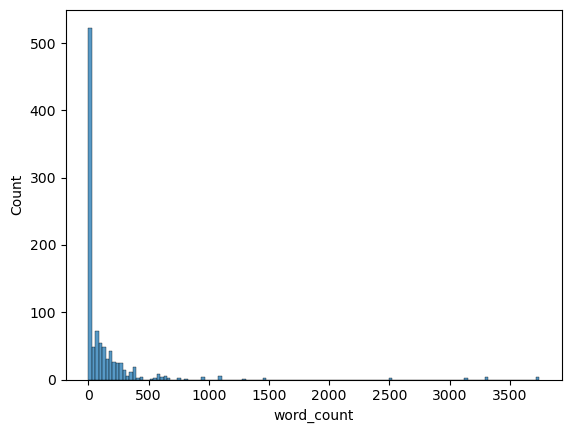

In [247]:
sns.histplot(data = df_sentiment, x ='word_count')# para vereficar a frequencia do numero de palavrasna coluna word count

In [248]:
def count_words(text_column):
  df_sentiment['word_count'] = df_sentiment[text_column].str.split().apply(len)

  min =  df_sentiment['word_count'].min()
  mean =  df_sentiment['word_count'].mean()
  max =  df_sentiment['word_count'].max()

  print("The minimum number of words in the dataset is:", min)
  print("The average number of words in the dataset is:", mean)
  print("The maximum number of words in the dataset is:", max)

  print("\nHistogram of word number frequency")
  sns.histplot(data = df_sentiment, x = 'word_count')

The minimum number of words in the dataset is: 0
The average number of words in the dataset is: 141.83116883116884
The maximum number of words in the dataset is: 3746

Histogram of word number frequency


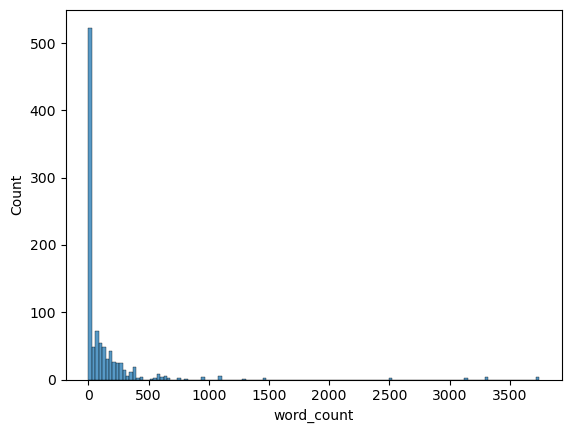

In [249]:
count_words('Selftext')

## Verificando a distribuição dos scores

In [251]:
score_counts = df_sentiment['Score'].value_counts()
score_counts

Score
3      93
1      82
2      76
5      62
4      52
       ..
59      1
255     1
327     1
396     1
75      1
Name: count, Length: 176, dtype: int64

<Axes: xlabel='Score', ylabel='Count'>

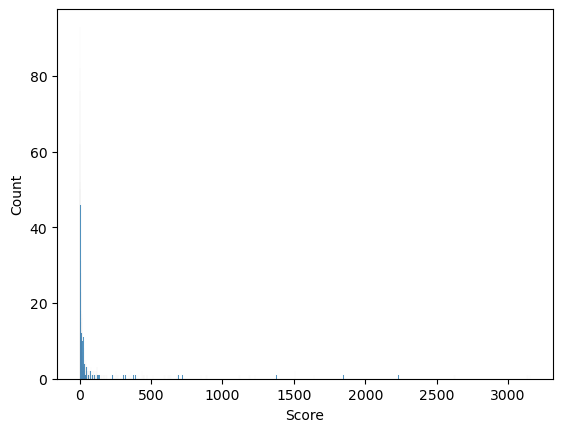

In [252]:
sns.histplot(data =df_sentiment, x ='Score', discrete =True)# dados deven ser semilhantes

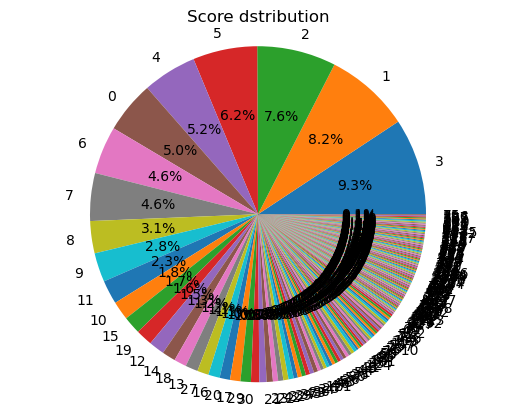

In [253]:
plt.pie(score_counts, labels = score_counts.index, autopct = '%1.1f%%')
plt.title("Score dstribution")
plt.axis('equal')
plt.show()

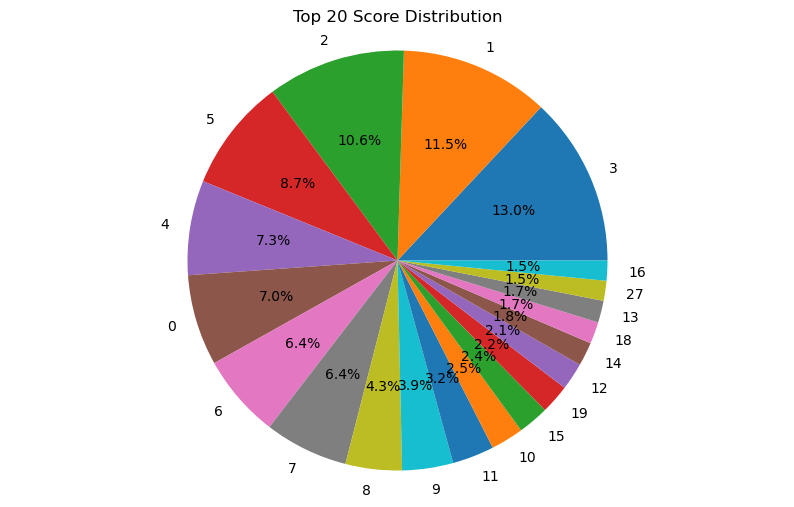

In [254]:
# top 20 value/Score
top_20_scores = score_counts.nlargest(20)


plt.figure(figsize=(10, 6))
plt.pie(top_20_scores, labels=top_20_scores.index, autopct='%1.1f%%')
plt.title("Top 20 Score Distribution")
plt.axis('equal')
plt.show()


## Palavras mais frequentes

In [256]:
from collections import Counter

all_text = ' '.join(df_sentiment['Selftext'])## separar o texto palavra por palavra e depois contar cada palavra.
words = all_text.split()
word_count = Counter(words)

number_words = 10 # top 10 de palavras

most_common_words = word_count.most_common(number_words)
most_common_words_df = pd.DataFrame(most_common_words, columns = ['Word', 'Frequency'])
most_common_words_df

,Word,Frequency
0,the,5287
1,and,4285
2,to,4192
3,of,3435
4,a,3164
5,I,2191
6,in,2097
7,for,1622
8,is,1466
9,that,1258


In [257]:
def most_frequency_words(df_sentiment, text_column, number_words = 20):
  all_text = ' '.join(df_sentiment[text_column])
  words = all_text.split()
  word_count = Counter(words)

  print("\nMost frequent words")
  most_common_words = word_count.most_common(number_words)
  most_common_words_df = pd.DataFrame(most_common_words, columns = ['Word', 'Frequency'])
  display(most_common_words_df)

In [258]:
most_frequency_words(df_sentiment, 'Selftext')


Most frequent words


,Word,Frequency
0,the,5287
1,and,4285
2,to,4192
3,of,3435
4,a,3164
5,I,2191
6,in,2097
7,for,1622
8,is,1466
9,that,1258


## Most frequent words by Score

In [260]:
for class_label in df_sentiment['Score'].unique():
  class_df = df_sentiment[df_sentiment['Score'] == class_label]

  print("\nMost frequent words by Score", class_label)
  most_frequency_words(class_df, 'Selftext')


Most frequent words by Score 28

Most frequent words


,Word,Frequency



Most frequent words by Score 1

Most frequent words


,Word,Frequency
0,and,487
1,the,463
2,to,385
3,of,380
4,a,309
5,in,291
6,–,262
7,I,147
8,is,120
9,for,117



Most frequent words by Score 124

Most frequent words


,Word,Frequency



Most frequent words by Score 7

Most frequent words


,Word,Frequency
0,and,167
1,the,163
2,to,136
3,I,99
4,of,93
5,a,79
6,in,72
7,i,62
8,have,49
9,for,47



Most frequent words by Score 3

Most frequent words


,Word,Frequency
0,the,351
1,a,347
2,to,342
3,and,336
4,I,302
5,of,182
6,in,156
7,for,132
8,is,125
9,that,115



Most frequent words by Score 0

Most frequent words


,Word,Frequency
0,the,273
1,to,185
2,and,181
3,of,171
4,a,125
5,I,118
6,is,88
7,for,84
8,in,78
9,with,50



Most frequent words by Score 4

Most frequent words


,Word,Frequency
0,the,414
1,to,380
2,and,325
3,of,253
4,a,238
5,I,179
6,in,160
7,are,134
8,for,125
9,that,114



Most frequent words by Score 2

Most frequent words


,Word,Frequency
0,the,482
1,to,421
2,a,345
3,and,327
4,of,211
5,I,209
6,in,187
7,for,151
8,is,134
9,have,123



Most frequent words by Score 46

Most frequent words


,Word,Frequency
0,I,28
1,the,27
2,to,25
3,and,19
4,that,15
5,in,10
6,have,10
7,is,9
8,a,8
9,are,7



Most frequent words by Score 16

Most frequent words


,Word,Frequency
0,to,23
1,a,20
2,and,19
3,the,19
4,of,17
5,I,11
6,in,10
7,you,9
8,what,8
9,for,8



Most frequent words by Score 8

Most frequent words


,Word,Frequency
0,the,149
1,to,138
2,of,136
3,a,134
4,and,130
5,I,104
6,dairy,97
7,is,72
8,that,69
9,in,62



Most frequent words by Score 31

Most frequent words


,Word,Frequency



Most frequent words by Score 30

Most frequent words


,Word,Frequency
0,to,14
1,a,10
2,*,10
3,in,7
4,of,7
5,and,6
6,I,6
7,&#x200B;,5
8,can,5
9,from,4



Most frequent words by Score 12

Most frequent words


,Word,Frequency
0,and,58
1,a,43
2,I,43
3,the,41
4,to,39
5,of,28
6,I'm,25
7,it,21
8,for,21
9,my,19



Most frequent words by Score 33

Most frequent words


,Word,Frequency
0,to,11
1,a,7
2,and,6
3,I,6
4,&#x200B;,5
5,in,5
6,of,5
7,can,4
8,their,4
9,farmers,4



Most frequent words by Score 9

Most frequent words


,Word,Frequency
0,the,102
1,of,76
2,a,65
3,to,57
4,and,46
5,in,37
6,with,27
7,for,26
8,I,26
9,on,25



Most frequent words by Score 5

Most frequent words


,Word,Frequency
0,the,486
1,to,455
2,and,406
3,of,360
4,a,304
5,are,198
6,in,185
7,I,160
8,is,160
9,for,156



Most frequent words by Score 10

Most frequent words


,Word,Frequency
0,a,58
1,the,49
2,and,48
3,I,47
4,in,40
5,to,37
6,of,34
7,for,30
8,my,21
9,have,20



Most frequent words by Score 11

Most frequent words


,Word,Frequency
0,to,65
1,and,61
2,I,60
3,the,60
4,a,38
5,have,32
6,of,30
7,be,29
8,in,26
9,for,25



Most frequent words by Score 13

Most frequent words


,Word,Frequency
0,a,52
1,and,48
2,I,38
3,to,37
4,the,32
5,in,29
6,of,23
7,for,20
8,on,16
9,I'm,11



Most frequent words by Score 45

Most frequent words


,Word,Frequency
0,the,59
1,and,43
2,I,38
3,to,37
4,that,23
5,a,20
6,is,19
7,in,18
8,have,18
9,of,14



Most frequent words by Score 6

Most frequent words


,Word,Frequency
0,the,369
1,to,308
2,and,301
3,of,246
4,a,232
5,I,139
6,for,138
7,in,135
8,are,121
9,is,113



Most frequent words by Score 29

Most frequent words


,Word,Frequency
0,and,116
1,from,85
2,the,82
3,National,71
4,a,45
5,Koch,45
6,to,43
7,is,42
8,for,40
9,gets,35



Most frequent words by Score 127

Most frequent words


,Word,Frequency



Most frequent words by Score 43

Most frequent words


,Word,Frequency
0,the,96
1,to,77
2,I,67
3,and,67
4,that,46
5,for,42
6,is,41
7,of,37
8,in,34
9,a,34



Most frequent words by Score 15

Most frequent words


,Word,Frequency
0,the,31
1,to,27
2,and,23
3,of,20
4,a,14
5,you,8
6,is,8
7,in,8
8,or,8
9,for,7



Most frequent words by Score 19

Most frequent words


,Word,Frequency
0,the,490
1,of,392
2,to,257
3,and,250
4,in,162
5,a,117
6,will,96
7,be,88
8,for,74
9,these,70



Most frequent words by Score 34

Most frequent words


,Word,Frequency



Most frequent words by Score 348

Most frequent words


,Word,Frequency
0,the,27
1,and,11
2,to,10
3,of,7
4,in,6
5,South,5
6,African,5
7,with,5
8,will,4
9,City,3



Most frequent words by Score 115

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 236

Most frequent words


,Word,Frequency



Most frequent words by Score 377

Most frequent words


,Word,Frequency



Most frequent words by Score 436

Most frequent words


,Word,Frequency



Most frequent words by Score 307

Most frequent words


,Word,Frequency



Most frequent words by Score 44

Most frequent words


,Word,Frequency
0,a,7
1,I,5
2,and,5
3,on,4
4,to,3
5,have,3
6,the,3
7,what,2
8,I'll,2
9,of,2



Most frequent words by Score 51

Most frequent words


,Word,Frequency
0,the,17
1,to,15
2,a,14
3,and,11
4,I,10
5,for,8
6,is,7
7,in,6
8,out,6
9,my,5



Most frequent words by Score 21

Most frequent words


,Word,Frequency
0,on,4
1,the,3
2,of,2
3,Point,2
4,Reyes,2
5,in,2
6,a,2
7,more,2
8,Skyler,1
9,Thomas,1



Most frequent words by Score 94

Most frequent words


,Word,Frequency



Most frequent words by Score 36

Most frequent words


,Word,Frequency



Most frequent words by Score 35

Most frequent words


,Word,Frequency
0,I,20
1,to,18
2,the,18
3,and,17
4,a,13
5,but,8
6,is,8
7,of,7
8,with,6
9,for,5



Most frequent words by Score 17

Most frequent words


,Word,Frequency
0,and,29
1,a,26
2,the,23
3,to,21
4,in,13
5,that,13
6,of,12
7,I,11
8,with,10
9,farm,9



Most frequent words by Score 20

Most frequent words


,Word,Frequency
0,the,473
1,of,394
2,and,243
3,to,242
4,in,158
5,a,105
6,will,94
7,be,84
8,for,72
9,these,70



Most frequent words by Score 32

Most frequent words


,Word,Frequency
0,the,11
1,you,7
2,a,5
3,about,4
4,and,4
5,to,3
6,young,3
7,in,3
8,for,3
9,are,3



Most frequent words by Score 14

Most frequent words


,Word,Frequency
0,to,14
1,the,13
2,and,9
3,I,8
4,a,7
5,but,7
6,of,7
7,that,6
8,on,4
9,about,4



Most frequent words by Score 80

Most frequent words


,Word,Frequency
0,Average,1
1,air,1
2,filter,1
3,on,1
4,a,1
5,dairy,1
6,farm,1
7,skid,1
8,steer,1
9,haha,1



Most frequent words by Score 18

Most frequent words


,Word,Frequency
0,and,53
1,a,52
2,the,45
3,to,41
4,of,38
5,for,25
6,in,22
7,that,21
8,I,21
9,is,20



Most frequent words by Score 27

Most frequent words


,Word,Frequency
0,and,228
1,from,167
2,National,142
3,the,130
4,to,98
5,Koch,90
6,a,87
7,is,84
8,for,77
9,of,74



Most frequent words by Score 132

Most frequent words


,Word,Frequency



Most frequent words by Score 48

Most frequent words


,Word,Frequency
0,would,2
1,From,1
2,your,1
3,guys,1
4,personal,1
5,"experience,",1
6,which,1
7,you,1
8,say,1
9,be,1



Most frequent words by Score 49

Most frequent words


,Word,Frequency
0,this,2
1,and,2
2,used,2
3,to,2
4,be,2
5,Started,1
6,managing,1
7,property,1
8,found,1
9,trailer,1



Most frequent words by Score 40

Most frequent words


,Word,Frequency
0,I,14
1,and,12
2,the,9
3,a,8
4,to,8
5,he,6
6,because,5
7,is,5
8,week,4
9,more,4



Most frequent words by Score 39

Most frequent words


,Word,Frequency



Most frequent words by Score 65

Most frequent words


,Word,Frequency



Most frequent words by Score 452

Most frequent words


,Word,Frequency
0,I,22
1,and,12
2,to,10
3,a,7
4,the,7
5,for,6
6,my,5
7,is,5
8,dad,4
9,out,4



Most frequent words by Score 321

Most frequent words


,Word,Frequency



Most frequent words by Score 24

Most frequent words


,Word,Frequency



Most frequent words by Score 42

Most frequent words


,Word,Frequency
0,I,18
1,and,15
2,the,14
3,a,12
4,to,11
5,of,7
6,he,6
7,because,5
8,is,5
9,my,4



Most frequent words by Score 230

Most frequent words


,Word,Frequency



Most frequent words by Score 59

Most frequent words


,Word,Frequency



Most frequent words by Score 52

Most frequent words


,Word,Frequency
0,a,4
1,the,4
2,I,4
3,him,4
4,I’ve,2
5,been,2
6,waterfowl,2
7,hunting,2
8,dairy,2
9,for,2



Most frequent words by Score 102

Most frequent words


,Word,Frequency



Most frequent words by Score 76

Most frequent words


,Word,Frequency



Most frequent words by Score 87

Most frequent words


,Word,Frequency



Most frequent words by Score 72

Most frequent words


,Word,Frequency
0,the,6
1,and,5
2,a,5
3,I’m,4
4,have,4
5,of,4
6,to,3
7,but,3
8,I,3
9,in,3



Most frequent words by Score 121

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 74

Most frequent words


,Word,Frequency
0,I,8
1,the,8
2,to,7
3,I'm,6
4,and,6
5,in,5
6,my,5
7,of,4
8,a,3
9,on,2



Most frequent words by Score 37

Most frequent words


,Word,Frequency
0,I,32
1,a,32
2,and,24
3,to,22
4,the,18
5,for,10
6,of,10
7,is,10
8,in,9
9,with,8



Most frequent words by Score 47

Most frequent words


,Word,Frequency
0,the,47
1,of,36
2,and,30
3,to,30
4,for,30
5,acres,27
6,is,23
7,a,22
8,that,19
9,-,16



Most frequent words by Score 41

Most frequent words


,Word,Frequency
0,the,10
1,to,7
2,dairy,6
3,I,5
4,farms,5
5,a,4
6,and,4
7,other,4
8,my,4
9,of,4



Most frequent words by Score 38

Most frequent words


,Word,Frequency
0,a,18
1,the,17
2,to,14
3,and,13
4,I,10
5,we,8
6,me,6
7,for,5
8,they,5
9,on,4



Most frequent words by Score 469

Most frequent words


,Word,Frequency



Most frequent words by Score 88

Most frequent words


,Word,Frequency
0,to,6
1,I,5
2,the,5
3,not,4
4,you,4
5,of,4
6,we,4
7,would,3
8,learn.,2
9,I’m,2



Most frequent words by Score 359

Most frequent words


,Word,Frequency



Most frequent words by Score 53

Most frequent words


,Word,Frequency
0,to,16
1,the,12
2,for,8
3,and,6
4,is,6
5,a,6
6,that,6
7,I've,4
8,my,4
9,in,4



Most frequent words by Score 154

Most frequent words


,Word,Frequency



Most frequent words by Score 125

Most frequent words


,Word,Frequency



Most frequent words by Score 84

Most frequent words


,Word,Frequency
0,the,22
1,I,17
2,to,15
3,and,15
4,was,9
5,of,8
6,a,8
7,it,8
8,on,7
9,in,7



Most frequent words by Score 22

Most frequent words


,Word,Frequency
0,to,16
1,a,13
2,the,10
3,I've,7
4,and,7
5,I'm,6
6,on,5
7,of,5
8,in,5
9,I,4



Most frequent words by Score 67

Most frequent words


,Word,Frequency



Most frequent words by Score 23

Most frequent words


,Word,Frequency
0,a,4
1,will,2
2,I've,2
3,got,2
4,and,2
5,Hi!,1
6,I'm,1
7,currently,1
8,considering,1
9,(and,1



Most frequent words by Score 26

Most frequent words


,Word,Frequency
0,of,10
1,to,10
2,the,10
3,a,9
4,and,5
5,I,5
6,our,5
7,my,4
8,milk,4
9,from,4



Most frequent words by Score 344

Most frequent words


,Word,Frequency
0,the,27
1,and,11
2,to,10
3,of,7
4,in,6
5,South,5
6,African,5
7,with,5
8,will,4
9,City,3



Most frequent words by Score 116

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 239

Most frequent words


,Word,Frequency



Most frequent words by Score 379

Most frequent words


,Word,Frequency



Most frequent words by Score 309

Most frequent words


,Word,Frequency



Most frequent words by Score 91

Most frequent words


,Word,Frequency



Most frequent words by Score 79

Most frequent words


,Word,Frequency



Most frequent words by Score 25

Most frequent words


,Word,Frequency



Most frequent words by Score 54

Most frequent words


,Word,Frequency



Most frequent words by Score 450

Most frequent words


,Word,Frequency
0,I,22
1,and,12
2,to,10
3,a,7
4,the,7
5,for,6
6,my,5
7,is,5
8,dad,4
9,out,4



Most frequent words by Score 391

Most frequent words


,Word,Frequency



Most frequent words by Score 231

Most frequent words


,Word,Frequency



Most frequent words by Score 361

Most frequent words


,Word,Frequency



Most frequent words by Score 119

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 852

Most frequent words


,Word,Frequency



Most frequent words by Score 470

Most frequent words


,Word,Frequency



Most frequent words by Score 189

Most frequent words


,Word,Frequency



Most frequent words by Score 396

Most frequent words


,Word,Frequency



Most frequent words by Score 327

Most frequent words


,Word,Frequency



Most frequent words by Score 255

Most frequent words


,Word,Frequency



Most frequent words by Score 95

Most frequent words


,Word,Frequency



Most frequent words by Score 104

Most frequent words


,Word,Frequency



Most frequent words by Score 101

Most frequent words


,Word,Frequency



Most frequent words by Score 50

Most frequent words


,Word,Frequency
0,a,4
1,I,3
2,on,3
3,the,3
4,have,2
5,and,2
6,in,2
7,like,2
8,to,2
9,Hi.,1



Most frequent words by Score 63

Most frequent words


,Word,Frequency



Most frequent words by Score 57

Most frequent words


,Word,Frequency
0,the,11
1,a,11
2,and,8
3,I,8
4,to,7
5,out,4
6,a.m.,4
7,is,4
8,in,4
9,for,4



Most frequent words by Score 92

Most frequent words


,Word,Frequency



Most frequent words by Score 171

Most frequent words


,Word,Frequency



Most frequent words by Score 61

Most frequent words


,Word,Frequency



Most frequent words by Score 113

Most frequent words


,Word,Frequency



Most frequent words by Score 64

Most frequent words


,Word,Frequency



Most frequent words by Score 1510

Most frequent words


,Word,Frequency



Most frequent words by Score 633

Most frequent words


,Word,Frequency



Most frequent words by Score 2235

Most frequent words


,Word,Frequency



Most frequent words by Score 1122

Most frequent words


,Word,Frequency



Most frequent words by Score 597

Most frequent words


,Word,Frequency



Most frequent words by Score 128

Most frequent words


,Word,Frequency



Most frequent words by Score 73

Most frequent words


,Word,Frequency



Most frequent words by Score 257

Most frequent words


,Word,Frequency
0,the,16
1,to,10
2,and,6
3,a,6
4,I,6
5,it,6
6,them,4
7,save,4
8,in,4
9,for,4



Most frequent words by Score 3137

Most frequent words


,Word,Frequency



Most frequent words by Score 2626

Most frequent words


,Word,Frequency



Most frequent words by Score 271

Most frequent words


,Word,Frequency



Most frequent words by Score 266

Most frequent words


,Word,Frequency



Most frequent words by Score 168

Most frequent words


,Word,Frequency



Most frequent words by Score 1847

Most frequent words


,Word,Frequency



Most frequent words by Score 100

Most frequent words


,Word,Frequency



Most frequent words by Score 893

Most frequent words


,Word,Frequency



Most frequent words by Score 720

Most frequent words


,Word,Frequency
0,the,15
1,to,8
2,and,6
3,video,5
4,is,4
5,of,4
6,for,4
7,WIL's,3
8,that,3
9,in,2



Most frequent words by Score 149

Most frequent words


,Word,Frequency



Most frequent words by Score 56

Most frequent words


,Word,Frequency



Most frequent words by Score 98

Most frequent words


,Word,Frequency



Most frequent words by Score 1188

Most frequent words


,Word,Frequency



Most frequent words by Score 684

Most frequent words


,Word,Frequency



Most frequent words by Score 617

Most frequent words


,Word,Frequency



Most frequent words by Score 686

Most frequent words


,Word,Frequency



Most frequent words by Score 310

Most frequent words


,Word,Frequency



Most frequent words by Score 182

Most frequent words


,Word,Frequency



Most frequent words by Score 218

Most frequent words


,Word,Frequency



Most frequent words by Score 173

Most frequent words


,Word,Frequency



Most frequent words by Score 58

Most frequent words


,Word,Frequency



Most frequent words by Score 627

Most frequent words


,Word,Frequency



Most frequent words by Score 2232

Most frequent words


,Word,Frequency



Most frequent words by Score 1113

Most frequent words


,Word,Frequency



Most frequent words by Score 117

Most frequent words


,Word,Frequency



Most frequent words by Score 62

Most frequent words


,Word,Frequency



Most frequent words by Score 589

Most frequent words


,Word,Frequency



Most frequent words by Score 130

Most frequent words


,Word,Frequency



Most frequent words by Score 90

Most frequent words


,Word,Frequency



Most frequent words by Score 3132

Most frequent words


,Word,Frequency



Most frequent words by Score 409

Most frequent words


,Word,Frequency



Most frequent words by Score 443

Most frequent words


,Word,Frequency



Most frequent words by Score 3156

Most frequent words


,Word,Frequency



Most frequent words by Score 2624

Most frequent words


,Word,Frequency



Most frequent words by Score 259

Most frequent words


,Word,Frequency



Most frequent words by Score 289

Most frequent words


,Word,Frequency



Most frequent words by Score 1640

Most frequent words


,Word,Frequency



Most frequent words by Score 1378

Most frequent words


,Word,Frequency



Most frequent words by Score 110

Most frequent words


,Word,Frequency



Most frequent words by Score 1227

Most frequent words


,Word,Frequency



Most frequent words by Score 1194

Most frequent words


,Word,Frequency



Most frequent words by Score 884

Most frequent words


,Word,Frequency



Most frequent words by Score 77

Most frequent words


,Word,Frequency



Most frequent words by Score 89

Most frequent words


,Word,Frequency



Most frequent words by Score 690

Most frequent words


,Word,Frequency



Most frequent words by Score 692

Most frequent words


,Word,Frequency



Most frequent words by Score 106

Most frequent words


,Word,Frequency



Most frequent words by Score 642

Most frequent words


,Word,Frequency



Most frequent words by Score 187

Most frequent words


,Word,Frequency



Most frequent words by Score 512

Most frequent words


,Word,Frequency



Most frequent words by Score 139

Most frequent words


,Word,Frequency



Most frequent words by Score 123

Most frequent words


,Word,Frequency



Most frequent words by Score 159

Most frequent words


,Word,Frequency



Most frequent words by Score 305

Most frequent words


,Word,Frequency



Most frequent words by Score 60

Most frequent words


,Word,Frequency



Most frequent words by Score 75

Most frequent words


,Word,Frequency


In [261]:
##############apagar esse ####################
def most_frequency_words_by_class(text_column, class_column):
  for class_label in df_sentiment[class_column].unique():
    class_df = df_sentiment[df_sentiment[class_column] == class_label]

    print("\nMost frequent words by Score", class_label)
    most_frequency_words(class_df, text_column)

In [262]:
most_frequency_words_by_class('Selftext', 'Score')


Most frequent words by Score 28

Most frequent words


,Word,Frequency



Most frequent words by Score 1

Most frequent words


,Word,Frequency
0,and,487
1,the,463
2,to,385
3,of,380
4,a,309
5,in,291
6,–,262
7,I,147
8,is,120
9,for,117



Most frequent words by Score 124

Most frequent words


,Word,Frequency



Most frequent words by Score 7

Most frequent words


,Word,Frequency
0,and,167
1,the,163
2,to,136
3,I,99
4,of,93
5,a,79
6,in,72
7,i,62
8,have,49
9,for,47



Most frequent words by Score 3

Most frequent words


,Word,Frequency
0,the,351
1,a,347
2,to,342
3,and,336
4,I,302
5,of,182
6,in,156
7,for,132
8,is,125
9,that,115



Most frequent words by Score 0

Most frequent words


,Word,Frequency
0,the,273
1,to,185
2,and,181
3,of,171
4,a,125
5,I,118
6,is,88
7,for,84
8,in,78
9,with,50



Most frequent words by Score 4

Most frequent words


,Word,Frequency
0,the,414
1,to,380
2,and,325
3,of,253
4,a,238
5,I,179
6,in,160
7,are,134
8,for,125
9,that,114



Most frequent words by Score 2

Most frequent words


,Word,Frequency
0,the,482
1,to,421
2,a,345
3,and,327
4,of,211
5,I,209
6,in,187
7,for,151
8,is,134
9,have,123



Most frequent words by Score 46

Most frequent words


,Word,Frequency
0,I,28
1,the,27
2,to,25
3,and,19
4,that,15
5,in,10
6,have,10
7,is,9
8,a,8
9,are,7



Most frequent words by Score 16

Most frequent words


,Word,Frequency
0,to,23
1,a,20
2,and,19
3,the,19
4,of,17
5,I,11
6,in,10
7,you,9
8,what,8
9,for,8



Most frequent words by Score 8

Most frequent words


,Word,Frequency
0,the,149
1,to,138
2,of,136
3,a,134
4,and,130
5,I,104
6,dairy,97
7,is,72
8,that,69
9,in,62



Most frequent words by Score 31

Most frequent words


,Word,Frequency



Most frequent words by Score 30

Most frequent words


,Word,Frequency
0,to,14
1,a,10
2,*,10
3,in,7
4,of,7
5,and,6
6,I,6
7,&#x200B;,5
8,can,5
9,from,4



Most frequent words by Score 12

Most frequent words


,Word,Frequency
0,and,58
1,a,43
2,I,43
3,the,41
4,to,39
5,of,28
6,I'm,25
7,it,21
8,for,21
9,my,19



Most frequent words by Score 33

Most frequent words


,Word,Frequency
0,to,11
1,a,7
2,and,6
3,I,6
4,&#x200B;,5
5,in,5
6,of,5
7,can,4
8,their,4
9,farmers,4



Most frequent words by Score 9

Most frequent words


,Word,Frequency
0,the,102
1,of,76
2,a,65
3,to,57
4,and,46
5,in,37
6,with,27
7,for,26
8,I,26
9,on,25



Most frequent words by Score 5

Most frequent words


,Word,Frequency
0,the,486
1,to,455
2,and,406
3,of,360
4,a,304
5,are,198
6,in,185
7,I,160
8,is,160
9,for,156



Most frequent words by Score 10

Most frequent words


,Word,Frequency
0,a,58
1,the,49
2,and,48
3,I,47
4,in,40
5,to,37
6,of,34
7,for,30
8,my,21
9,have,20



Most frequent words by Score 11

Most frequent words


,Word,Frequency
0,to,65
1,and,61
2,I,60
3,the,60
4,a,38
5,have,32
6,of,30
7,be,29
8,in,26
9,for,25



Most frequent words by Score 13

Most frequent words


,Word,Frequency
0,a,52
1,and,48
2,I,38
3,to,37
4,the,32
5,in,29
6,of,23
7,for,20
8,on,16
9,I'm,11



Most frequent words by Score 45

Most frequent words


,Word,Frequency
0,the,59
1,and,43
2,I,38
3,to,37
4,that,23
5,a,20
6,is,19
7,in,18
8,have,18
9,of,14



Most frequent words by Score 6

Most frequent words


,Word,Frequency
0,the,369
1,to,308
2,and,301
3,of,246
4,a,232
5,I,139
6,for,138
7,in,135
8,are,121
9,is,113



Most frequent words by Score 29

Most frequent words


,Word,Frequency
0,and,116
1,from,85
2,the,82
3,National,71
4,a,45
5,Koch,45
6,to,43
7,is,42
8,for,40
9,gets,35



Most frequent words by Score 127

Most frequent words


,Word,Frequency



Most frequent words by Score 43

Most frequent words


,Word,Frequency
0,the,96
1,to,77
2,I,67
3,and,67
4,that,46
5,for,42
6,is,41
7,of,37
8,in,34
9,a,34



Most frequent words by Score 15

Most frequent words


,Word,Frequency
0,the,31
1,to,27
2,and,23
3,of,20
4,a,14
5,you,8
6,is,8
7,in,8
8,or,8
9,for,7



Most frequent words by Score 19

Most frequent words


,Word,Frequency
0,the,490
1,of,392
2,to,257
3,and,250
4,in,162
5,a,117
6,will,96
7,be,88
8,for,74
9,these,70



Most frequent words by Score 34

Most frequent words


,Word,Frequency



Most frequent words by Score 348

Most frequent words


,Word,Frequency
0,the,27
1,and,11
2,to,10
3,of,7
4,in,6
5,South,5
6,African,5
7,with,5
8,will,4
9,City,3



Most frequent words by Score 115

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 236

Most frequent words


,Word,Frequency



Most frequent words by Score 377

Most frequent words


,Word,Frequency



Most frequent words by Score 436

Most frequent words


,Word,Frequency



Most frequent words by Score 307

Most frequent words


,Word,Frequency



Most frequent words by Score 44

Most frequent words


,Word,Frequency
0,a,7
1,I,5
2,and,5
3,on,4
4,to,3
5,have,3
6,the,3
7,what,2
8,I'll,2
9,of,2



Most frequent words by Score 51

Most frequent words


,Word,Frequency
0,the,17
1,to,15
2,a,14
3,and,11
4,I,10
5,for,8
6,is,7
7,in,6
8,out,6
9,my,5



Most frequent words by Score 21

Most frequent words


,Word,Frequency
0,on,4
1,the,3
2,of,2
3,Point,2
4,Reyes,2
5,in,2
6,a,2
7,more,2
8,Skyler,1
9,Thomas,1



Most frequent words by Score 94

Most frequent words


,Word,Frequency



Most frequent words by Score 36

Most frequent words


,Word,Frequency



Most frequent words by Score 35

Most frequent words


,Word,Frequency
0,I,20
1,to,18
2,the,18
3,and,17
4,a,13
5,but,8
6,is,8
7,of,7
8,with,6
9,for,5



Most frequent words by Score 17

Most frequent words


,Word,Frequency
0,and,29
1,a,26
2,the,23
3,to,21
4,in,13
5,that,13
6,of,12
7,I,11
8,with,10
9,farm,9



Most frequent words by Score 20

Most frequent words


,Word,Frequency
0,the,473
1,of,394
2,and,243
3,to,242
4,in,158
5,a,105
6,will,94
7,be,84
8,for,72
9,these,70



Most frequent words by Score 32

Most frequent words


,Word,Frequency
0,the,11
1,you,7
2,a,5
3,about,4
4,and,4
5,to,3
6,young,3
7,in,3
8,for,3
9,are,3



Most frequent words by Score 14

Most frequent words


,Word,Frequency
0,to,14
1,the,13
2,and,9
3,I,8
4,a,7
5,but,7
6,of,7
7,that,6
8,on,4
9,about,4



Most frequent words by Score 80

Most frequent words


,Word,Frequency
0,Average,1
1,air,1
2,filter,1
3,on,1
4,a,1
5,dairy,1
6,farm,1
7,skid,1
8,steer,1
9,haha,1



Most frequent words by Score 18

Most frequent words


,Word,Frequency
0,and,53
1,a,52
2,the,45
3,to,41
4,of,38
5,for,25
6,in,22
7,that,21
8,I,21
9,is,20



Most frequent words by Score 27

Most frequent words


,Word,Frequency
0,and,228
1,from,167
2,National,142
3,the,130
4,to,98
5,Koch,90
6,a,87
7,is,84
8,for,77
9,of,74



Most frequent words by Score 132

Most frequent words


,Word,Frequency



Most frequent words by Score 48

Most frequent words


,Word,Frequency
0,would,2
1,From,1
2,your,1
3,guys,1
4,personal,1
5,"experience,",1
6,which,1
7,you,1
8,say,1
9,be,1



Most frequent words by Score 49

Most frequent words


,Word,Frequency
0,this,2
1,and,2
2,used,2
3,to,2
4,be,2
5,Started,1
6,managing,1
7,property,1
8,found,1
9,trailer,1



Most frequent words by Score 40

Most frequent words


,Word,Frequency
0,I,14
1,and,12
2,the,9
3,a,8
4,to,8
5,he,6
6,because,5
7,is,5
8,week,4
9,more,4



Most frequent words by Score 39

Most frequent words


,Word,Frequency



Most frequent words by Score 65

Most frequent words


,Word,Frequency



Most frequent words by Score 452

Most frequent words


,Word,Frequency
0,I,22
1,and,12
2,to,10
3,a,7
4,the,7
5,for,6
6,my,5
7,is,5
8,dad,4
9,out,4



Most frequent words by Score 321

Most frequent words


,Word,Frequency



Most frequent words by Score 24

Most frequent words


,Word,Frequency



Most frequent words by Score 42

Most frequent words


,Word,Frequency
0,I,18
1,and,15
2,the,14
3,a,12
4,to,11
5,of,7
6,he,6
7,because,5
8,is,5
9,my,4



Most frequent words by Score 230

Most frequent words


,Word,Frequency



Most frequent words by Score 59

Most frequent words


,Word,Frequency



Most frequent words by Score 52

Most frequent words


,Word,Frequency
0,a,4
1,the,4
2,I,4
3,him,4
4,I’ve,2
5,been,2
6,waterfowl,2
7,hunting,2
8,dairy,2
9,for,2



Most frequent words by Score 102

Most frequent words


,Word,Frequency



Most frequent words by Score 76

Most frequent words


,Word,Frequency



Most frequent words by Score 87

Most frequent words


,Word,Frequency



Most frequent words by Score 72

Most frequent words


,Word,Frequency
0,the,6
1,and,5
2,a,5
3,I’m,4
4,have,4
5,of,4
6,to,3
7,but,3
8,I,3
9,in,3



Most frequent words by Score 121

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 74

Most frequent words


,Word,Frequency
0,I,8
1,the,8
2,to,7
3,I'm,6
4,and,6
5,in,5
6,my,5
7,of,4
8,a,3
9,on,2



Most frequent words by Score 37

Most frequent words


,Word,Frequency
0,I,32
1,a,32
2,and,24
3,to,22
4,the,18
5,for,10
6,of,10
7,is,10
8,in,9
9,with,8



Most frequent words by Score 47

Most frequent words


,Word,Frequency
0,the,47
1,of,36
2,and,30
3,to,30
4,for,30
5,acres,27
6,is,23
7,a,22
8,that,19
9,-,16



Most frequent words by Score 41

Most frequent words


,Word,Frequency
0,the,10
1,to,7
2,dairy,6
3,I,5
4,farms,5
5,a,4
6,and,4
7,other,4
8,my,4
9,of,4



Most frequent words by Score 38

Most frequent words


,Word,Frequency
0,a,18
1,the,17
2,to,14
3,and,13
4,I,10
5,we,8
6,me,6
7,for,5
8,they,5
9,on,4



Most frequent words by Score 469

Most frequent words


,Word,Frequency



Most frequent words by Score 88

Most frequent words


,Word,Frequency
0,to,6
1,I,5
2,the,5
3,not,4
4,you,4
5,of,4
6,we,4
7,would,3
8,learn.,2
9,I’m,2



Most frequent words by Score 359

Most frequent words


,Word,Frequency



Most frequent words by Score 53

Most frequent words


,Word,Frequency
0,to,16
1,the,12
2,for,8
3,and,6
4,is,6
5,a,6
6,that,6
7,I've,4
8,my,4
9,in,4



Most frequent words by Score 154

Most frequent words


,Word,Frequency



Most frequent words by Score 125

Most frequent words


,Word,Frequency



Most frequent words by Score 84

Most frequent words


,Word,Frequency
0,the,22
1,I,17
2,to,15
3,and,15
4,was,9
5,of,8
6,a,8
7,it,8
8,on,7
9,in,7



Most frequent words by Score 22

Most frequent words


,Word,Frequency
0,to,16
1,a,13
2,the,10
3,I've,7
4,and,7
5,I'm,6
6,on,5
7,of,5
8,in,5
9,I,4



Most frequent words by Score 67

Most frequent words


,Word,Frequency



Most frequent words by Score 23

Most frequent words


,Word,Frequency
0,a,4
1,will,2
2,I've,2
3,got,2
4,and,2
5,Hi!,1
6,I'm,1
7,currently,1
8,considering,1
9,(and,1



Most frequent words by Score 26

Most frequent words


,Word,Frequency
0,of,10
1,to,10
2,the,10
3,a,9
4,and,5
5,I,5
6,our,5
7,my,4
8,milk,4
9,from,4



Most frequent words by Score 344

Most frequent words


,Word,Frequency
0,the,27
1,and,11
2,to,10
3,of,7
4,in,6
5,South,5
6,African,5
7,with,5
8,will,4
9,City,3



Most frequent words by Score 116

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 239

Most frequent words


,Word,Frequency



Most frequent words by Score 379

Most frequent words


,Word,Frequency



Most frequent words by Score 309

Most frequent words


,Word,Frequency



Most frequent words by Score 91

Most frequent words


,Word,Frequency



Most frequent words by Score 79

Most frequent words


,Word,Frequency



Most frequent words by Score 25

Most frequent words


,Word,Frequency



Most frequent words by Score 54

Most frequent words


,Word,Frequency



Most frequent words by Score 450

Most frequent words


,Word,Frequency
0,I,22
1,and,12
2,to,10
3,a,7
4,the,7
5,for,6
6,my,5
7,is,5
8,dad,4
9,out,4



Most frequent words by Score 391

Most frequent words


,Word,Frequency



Most frequent words by Score 231

Most frequent words


,Word,Frequency



Most frequent words by Score 361

Most frequent words


,Word,Frequency



Most frequent words by Score 119

Most frequent words


,Word,Frequency
0,a,2
1,of,2
2,This,1
3,sub,1
4,is,1
5,dump,1
6,full,1
7,bunch,1
8,Karens,1
9,if,1



Most frequent words by Score 852

Most frequent words


,Word,Frequency



Most frequent words by Score 470

Most frequent words


,Word,Frequency



Most frequent words by Score 189

Most frequent words


,Word,Frequency



Most frequent words by Score 396

Most frequent words


,Word,Frequency



Most frequent words by Score 327

Most frequent words


,Word,Frequency



Most frequent words by Score 255

Most frequent words


,Word,Frequency



Most frequent words by Score 95

Most frequent words


,Word,Frequency



Most frequent words by Score 104

Most frequent words


,Word,Frequency



Most frequent words by Score 101

Most frequent words


,Word,Frequency



Most frequent words by Score 50

Most frequent words


,Word,Frequency
0,a,4
1,I,3
2,on,3
3,the,3
4,have,2
5,and,2
6,in,2
7,like,2
8,to,2
9,Hi.,1



Most frequent words by Score 63

Most frequent words


,Word,Frequency



Most frequent words by Score 57

Most frequent words


,Word,Frequency
0,the,11
1,a,11
2,and,8
3,I,8
4,to,7
5,out,4
6,a.m.,4
7,is,4
8,in,4
9,for,4



Most frequent words by Score 92

Most frequent words


,Word,Frequency



Most frequent words by Score 171

Most frequent words


,Word,Frequency



Most frequent words by Score 61

Most frequent words


,Word,Frequency



Most frequent words by Score 113

Most frequent words


,Word,Frequency



Most frequent words by Score 64

Most frequent words


,Word,Frequency



Most frequent words by Score 1510

Most frequent words


,Word,Frequency



Most frequent words by Score 633

Most frequent words


,Word,Frequency



Most frequent words by Score 2235

Most frequent words


,Word,Frequency



Most frequent words by Score 1122

Most frequent words


,Word,Frequency



Most frequent words by Score 597

Most frequent words


,Word,Frequency



Most frequent words by Score 128

Most frequent words


,Word,Frequency



Most frequent words by Score 73

Most frequent words


,Word,Frequency



Most frequent words by Score 257

Most frequent words


,Word,Frequency
0,the,16
1,to,10
2,and,6
3,a,6
4,I,6
5,it,6
6,them,4
7,save,4
8,in,4
9,for,4



Most frequent words by Score 3137

Most frequent words


,Word,Frequency



Most frequent words by Score 2626

Most frequent words


,Word,Frequency



Most frequent words by Score 271

Most frequent words


,Word,Frequency



Most frequent words by Score 266

Most frequent words


,Word,Frequency



Most frequent words by Score 168

Most frequent words


,Word,Frequency



Most frequent words by Score 1847

Most frequent words


,Word,Frequency



Most frequent words by Score 100

Most frequent words


,Word,Frequency



Most frequent words by Score 893

Most frequent words


,Word,Frequency



Most frequent words by Score 720

Most frequent words


,Word,Frequency
0,the,15
1,to,8
2,and,6
3,video,5
4,is,4
5,of,4
6,for,4
7,WIL's,3
8,that,3
9,in,2



Most frequent words by Score 149

Most frequent words


,Word,Frequency



Most frequent words by Score 56

Most frequent words


,Word,Frequency



Most frequent words by Score 98

Most frequent words


,Word,Frequency



Most frequent words by Score 1188

Most frequent words


,Word,Frequency



Most frequent words by Score 684

Most frequent words


,Word,Frequency



Most frequent words by Score 617

Most frequent words


,Word,Frequency



Most frequent words by Score 686

Most frequent words


,Word,Frequency



Most frequent words by Score 310

Most frequent words


,Word,Frequency



Most frequent words by Score 182

Most frequent words


,Word,Frequency



Most frequent words by Score 218

Most frequent words


,Word,Frequency



Most frequent words by Score 173

Most frequent words


,Word,Frequency



Most frequent words by Score 58

Most frequent words


,Word,Frequency



Most frequent words by Score 627

Most frequent words


,Word,Frequency



Most frequent words by Score 2232

Most frequent words


,Word,Frequency



Most frequent words by Score 1113

Most frequent words


,Word,Frequency



Most frequent words by Score 117

Most frequent words


,Word,Frequency



Most frequent words by Score 62

Most frequent words


,Word,Frequency



Most frequent words by Score 589

Most frequent words


,Word,Frequency



Most frequent words by Score 130

Most frequent words


,Word,Frequency



Most frequent words by Score 90

Most frequent words


,Word,Frequency



Most frequent words by Score 3132

Most frequent words


,Word,Frequency



Most frequent words by Score 409

Most frequent words


,Word,Frequency



Most frequent words by Score 443

Most frequent words


,Word,Frequency



Most frequent words by Score 3156

Most frequent words


,Word,Frequency



Most frequent words by Score 2624

Most frequent words


,Word,Frequency



Most frequent words by Score 259

Most frequent words


,Word,Frequency



Most frequent words by Score 289

Most frequent words


,Word,Frequency



Most frequent words by Score 1640

Most frequent words


,Word,Frequency



Most frequent words by Score 1378

Most frequent words


,Word,Frequency



Most frequent words by Score 110

Most frequent words


,Word,Frequency



Most frequent words by Score 1227

Most frequent words


,Word,Frequency



Most frequent words by Score 1194

Most frequent words


,Word,Frequency



Most frequent words by Score 884

Most frequent words


,Word,Frequency



Most frequent words by Score 77

Most frequent words


,Word,Frequency



Most frequent words by Score 89

Most frequent words


,Word,Frequency



Most frequent words by Score 690

Most frequent words


,Word,Frequency



Most frequent words by Score 692

Most frequent words


,Word,Frequency



Most frequent words by Score 106

Most frequent words


,Word,Frequency



Most frequent words by Score 642

Most frequent words


,Word,Frequency



Most frequent words by Score 187

Most frequent words


,Word,Frequency



Most frequent words by Score 512

Most frequent words


,Word,Frequency



Most frequent words by Score 139

Most frequent words


,Word,Frequency



Most frequent words by Score 123

Most frequent words


,Word,Frequency



Most frequent words by Score 159

Most frequent words


,Word,Frequency



Most frequent words by Score 305

Most frequent words


,Word,Frequency



Most frequent words by Score 60

Most frequent words


,Word,Frequency



Most frequent words by Score 75

Most frequent words


,Word,Frequency


## WordCloud

In [264]:
!pip install wordcloud

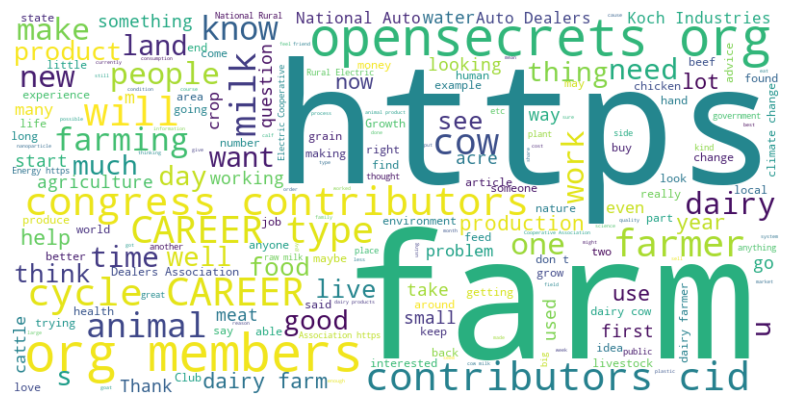

In [265]:
from wordcloud import WordCloud

all_text = ' '.join(df_sentiment['Selftext'])

wordcloud = WordCloud(width = 800, height = 400, background_color = 'white').generate(all_text)

plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

### Data processing

### ## Removing emojis

In [268]:
import re

def remove_emojis(text):
  emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols and pictograms
                           u"\U0001F680-\U0001F6FF"  # transport and symbols
                           u"\U0001F700-\U0001F77F"  # alchemical symbols
                           u"\U0001F780-\U0001F7FF"  # geometric symbols
                           u"\U0001F800-\U0001F8FF"  # symbols and pictograms supplement
                           u"\U0001F900-\U0001F9FF"  # additional emoticons
                           u"\U0001FA00-\U0001FA6F"  # various objects
                           u"\U0001FA70-\U0001FAFF"  # various symbols
                           u"\U0001F004"              # playing card symbol
                           u"\U0001F0CF"              # deck symbol
                           u"\U0001F170-\U0001F251"  # letter emojis variant
                           u"\U00002702-\U000027B0"  # various symbols
                           u"\U000024C2-\U0001F251"
                           "]+", flags = re.UNICODE)
  return emoji_pattern.sub(r'', text)

df_sentiment['removed_emoji'] = df_sentiment['Selftext'].apply(remove_emojis)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,
...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,


### Removendo links

In [270]:
def remove_link(text):
  text_without_links = re.sub(r'www\S+|http\S+|ftp\S+', '', text)
  return text_without_links

df_sentiment['removed_links'] = df_sentiment['removed_emoji'].apply(remove_link)
df_sentiment


,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,
...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,


### Tokenizando

In [272]:
!pip install nltk

In [273]:
import nltk
from nltk.tokenize import word_tokenize

def tokenize_text(text):
  tokens = word_tokenize(text)
  return tokens



df_sentiment['tokens'] = df_sentiment['removed_links'].apply(tokenize_text)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[]
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[]
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[]
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[]
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[]
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[]
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th..."
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[]


### Convertendo para minúscula

In [275]:
def lowercase(tokens):
  lowercase_tokens = [token.lower() for token in tokens]
  return lowercase_tokens

df_sentiment['tokens_lowercase'] = df_sentiment['tokens'].apply(lowercase)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens,tokens_lowercase
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[],[]
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[],[]
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[],[]
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[],[]
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[],[]
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[],[]
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th...","[[, in, 2005, grain, prices, were, so, low, th..."
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[],[]


### Removendo pontuações

In [277]:
import string

string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [278]:
def remove_punctuation(tokens):
  tokens_without_punctuation = [token for token in tokens if token not in string.punctuation]
  return tokens_without_punctuation

df_sentiment['tokens_without_punctuation'] = df_sentiment['tokens_lowercase'].apply(remove_punctuation)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens,tokens_lowercase,tokens_without_punctuation
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[],[],[]
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[],[],[]
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[],[],[]
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[],[],[]
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[],[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[],[],[]
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[],[],[]
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th...","[[, in, 2005, grain, prices, were, so, low, th...","[in, 2005, grain, prices, were, so, low, that,..."
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[],[],[]


### Removendo stopwords

In [280]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [281]:
def remove_stopwords(tokens):
  tokens_without_stopwords = [token for token in tokens if token not in stop_words]
  return tokens_without_stopwords

df_sentiment['tokens_without_stopwords'] = df_sentiment['tokens_without_punctuation'].apply(remove_stopwords)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens,tokens_lowercase,tokens_without_punctuation,tokens_without_stopwords
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[],[],[],[]
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[],[],[],[]
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[],[],[],[]
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[],[],[],[]
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[],[],[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[],[],[],[]
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[],[],[],[]
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th...","[[, in, 2005, grain, prices, were, so, low, th...","[in, 2005, grain, prices, were, so, low, that,...","[2005, grain, prices, low, mr, traill, bought,..."
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[],[],[],[]


### Obtendo radicais

In [283]:
from nltk.stem import RSLPStemmer

def stemmer_tokens(tokens):
  stemmer = RSLPStemmer()
  stemmed_tokens = [stemmer.stem(token) for token in tokens]
  return ' '.join(stemmed_tokens)

df_sentiment['stemmed_tokens'] = df_sentiment['tokens_without_stopwords'].apply(stemmer_tokens)
df_sentiment

,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens,tokens_lowercase,tokens_without_punctuation,tokens_without_stopwords,stemmed_tokens
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[],[],[],[],
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[],[],[],[],
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[],[],[],[],
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[],[],[],[],
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[],[],[],[],
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[],[],[],[],
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[],[],[],[],
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th...","[[, in, 2005, grain, prices, were, so, low, th...","[in, 2005, grain, prices, were, so, low, that,...","[2005, grain, prices, low, mr, traill, bought,...",2005 grain pric low mr traill bought biomas bo...
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[],[],[],[],


In [284]:
def to_sentiment(score):
    score = int(score)
    if score >= 70:  # High sentiment
        return 'Positive'
    elif 35 <= score < 70:  # Mid-range sentiment
        return 'Neutral'
    else:  # Low sentiment
        return 'Negative'

# Aplicar a função ao DataFrame
df_sentiment['sentiment_new'] = df_sentiment['Score'].apply(to_sentiment)
df_sentiment


,Subreddit,Search Term,Title,Score,Author,Created UTC,Selftext,Sentiment,word_count,removed_emoji,removed_links,tokens,tokens_lowercase,tokens_without_punctuation,tokens_without_stopwords,stemmed_tokens,sentiment_new
0,agriculture,milk production,Two of every three U.S. dairy farms vanished i...,28,Vailhem,1.722342e+09,,0.000000,0,,,[],[],[],[],,Negative
1,agriculture,milk production,Livestock are responsible for 14.5% of global ...,28,agristats,1.562239e+09,,0.000000,0,,,[],[],[],[],,Negative
2,agriculture,milk production,Factors affecting the adoption of on-farm milk...,1,JIA_CAAS,1.616130e+09,,0.000000,0,,,[],[],[],[],,Negative
3,agriculture,milk production,Largest trade flows of agriculture products,124,cursingpeople,1.728856e+09,,0.000000,0,,,[],[],[],[],,Positive
4,agriculture,milk production,Hitting the Bullseye! Ag Innovation and Milk P...,1,iSelectFund,1.506385e+09,,0.000000,0,,,[],[],[],[],,Negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,environment,dairy cows,Map Of The Largest Factory Farms In The USA,20,bearwave,1.291208e+09,,0.000000,0,,,[],[],[],[],,Negative
997,environment,dairy cows,New Zealand farmers want to create giant facto...,19,no1name,1.260135e+09,,0.000000,0,,,[],[],[],[],,Negative
998,environment,dairy cows,biomass route to lower farm heating costs,1,mikeoride,1.385542e+09,[http://www.fwi.co.uk/articles/13/11/2013/1419...,0.144056,218,[http://www.fwi.co.uk/articles/13/11/2013/1419...,[\n\nIn 2005 grain prices were so low that Mr ...,"[[, In, 2005, grain, prices, were, so, low, th...","[[, in, 2005, grain, prices, were, so, low, th...","[in, 2005, grain, prices, were, so, low, that,...","[2005, grain, prices, low, mr, traill, bought,...",2005 grain pric low mr traill bought biomas bo...,Negative
999,environment,dairy cows,Raw Dairy Risks,3,mamasaige,1.262816e+09,,0.000000,0,,,[],[],[],[],,Negative


In [285]:
df_sentiment.isnull().sum()

Subreddit                     0
Search Term                   0
Title                         0
Score                         0
Author                        0
Created UTC                   0
Selftext                      0
Sentiment                     0
word_count                    0
removed_emoji                 0
removed_links                 0
tokens                        0
tokens_lowercase              0
tokens_without_punctuation    0
tokens_without_stopwords      0
stemmed_tokens                0
sentiment_new                 0
dtype: int64

### Compilando todas as funções de pré-processamento
### Reavaliando os dados

In [287]:
def data_analytics(df, text_column, class_column):
  check_nulls()
  count_words(text_column)
  class_distribution(class_column)
  most_frequency_words(df, text_column)
  most_frequency_words_by_class(text_column, class_column)
  word_cloud(text_column)

def process_text(text):
  text = remove_emojis(text)
  text = remove_link(text)
  tokens = tokenize_text(text)
  tokens = lowercase(tokens)
  tokens = remove_punctuation(tokens)
  tokens = remove_stopwords(tokens)
  processed_text = stemmer_tokens(tokens)

  return processed_text

def class_distribution(class_column):
  class_counts = df_sentiment[class_column].value_counts()

  print("Number of instances per class")
  print(class_counts)

  print("\nHistogram of class distribution")
  sns.histplot(data = df_sentiment, x = class_column, discrete = True)
  plt.show()

  print("\nPie chart of class distribution")
  plt.pie(class_counts, labels = class_counts.index, autopct = '%1.1f%%')
  plt.title("Class distribution")
  plt.axis('equal')
  plt.show()

def word_cloud(text_column):
  all_text = ' '.join(df_sentiment[text_column])

  print("\nWordCloud")
  wordcloud = WordCloud(width = 800, height = 400, background_color = 'white').generate(all_text)

  plt.figure(figsize=(10,5))
  plt.imshow(wordcloud, interpolation = 'bilinear')
  plt.axis('off')
  plt.show()
    

 Number of null per col:

Subreddit                     0
Search Term                   0
Title                         0
Score                         0
Author                        0
Created UTC                   0
Selftext                      0
Sentiment                     0
word_count                    0
removed_emoji                 0
removed_links                 0
tokens                        0
tokens_lowercase              0
tokens_without_punctuation    0
tokens_without_stopwords      0
stemmed_tokens                0
sentiment_new                 0
dtype: int64 

The minimum number of words in the dataset is: 0
The average number of words in the dataset is: 80.62637362637362
The maximum number of words in the dataset is: 2285

Histogram of word number frequency
Number of instances per class
sentiment_new
Negative    798
Positive    131
Neutral      72
Name: count, dtype: int64

Histogram of class distribution


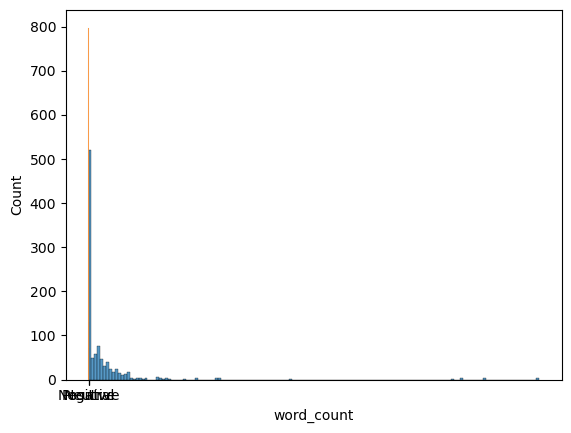


Pie chart of class distribution


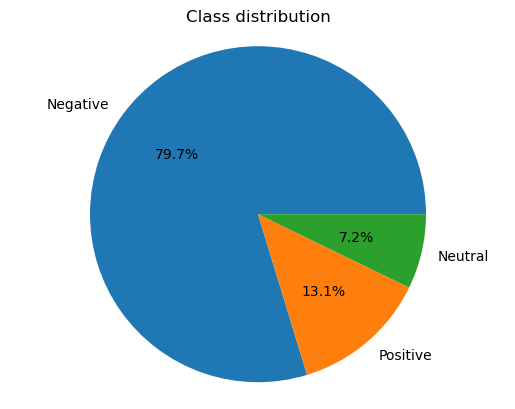


Most frequent words


,Word,Frequency
0,farm,1253
1,'s,659
2,dairy,641
3,’,606
4,cow,586
5,milk,524
6,would,512
7,animal,442
8,get,435
9,n't,405



Most frequent words by Score Negative

Most frequent words


,Word,Frequency
0,farm,1094
1,'s,616
2,dairy,600
3,cow,556
4,’,516
5,milk,498
6,would,466
7,get,393
8,animal,390
9,n't,354



Most frequent words by Score Positive

Most frequent words


,Word,Frequency
0,farm,29
1,’,18
2,dad,15
3,lik,15
4,n't,14
5,day,13
6,tim,12
7,vide,11
8,south,10
9,african,10



Most frequent words by Score Neutral

Most frequent words


,Word,Frequency
0,farm,130
1,’,72
2,agricultur,69
3,acr,58
4,animal,51
5,farming,43
6,land,40
7,would,39
8,get,37
9,n't,37



WordCloud


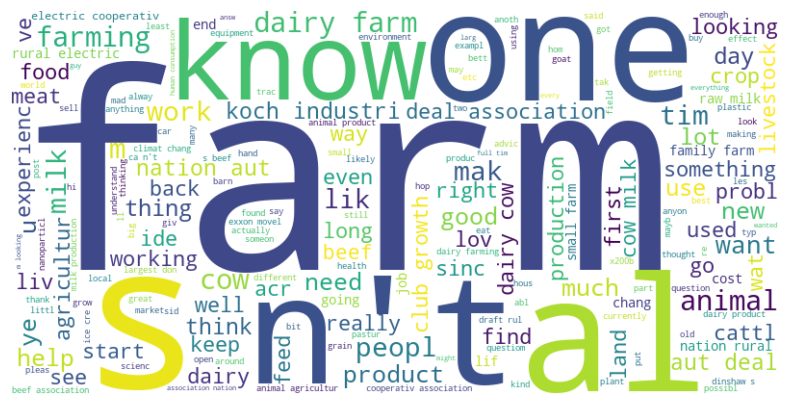

In [288]:
data_analytics(df_sentiment, 'stemmed_tokens', 'sentiment_new')

In [289]:
def join_tokens(tokens):
  return ' '.join(tokens)

df_sentiment['text_clean'] = df_sentiment['tokens_without_stopwords'].apply(join_tokens)

 Number of null per col:

Subreddit                     0
Search Term                   0
Title                         0
Score                         0
Author                        0
Created UTC                   0
Selftext                      0
Sentiment                     0
word_count                    0
removed_emoji                 0
removed_links                 0
tokens                        0
tokens_lowercase              0
tokens_without_punctuation    0
tokens_without_stopwords      0
stemmed_tokens                0
sentiment_new                 0
text_clean                    0
dtype: int64 

The minimum number of words in the dataset is: 0
The average number of words in the dataset is: 80.62637362637362
The maximum number of words in the dataset is: 2285

Histogram of word number frequency
Number of instances per class
sentiment_new
Negative    798
Positive    131
Neutral      72
Name: count, dtype: int64

Histogram of class distribution


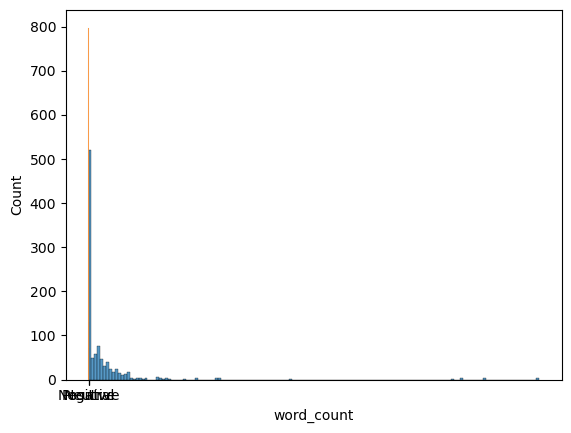


Pie chart of class distribution


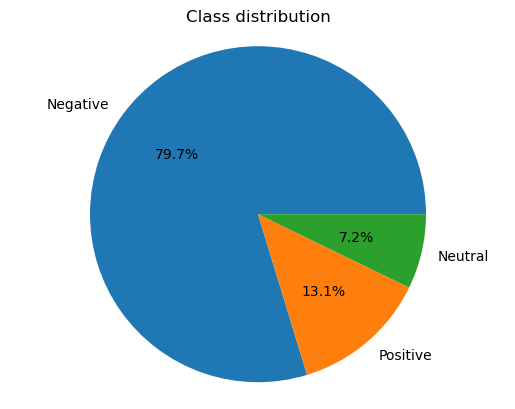


Most frequent words


,Word,Frequency
0,'s,659
1,dairy,641
2,’,606
3,farm,597
4,would,512
5,milk,507
6,n't,405
7,cows,388
8,farmers,336
9,'m,335



Most frequent words by Score Negative

Most frequent words


,Word,Frequency
0,'s,616
1,dairy,600
2,farm,529
3,’,516
4,milk,485
5,would,466
6,cows,364
7,n't,354
8,also,323
9,–,306



Most frequent words by Score Positive

Most frequent words


,Word,Frequency
0,farm,19
1,’,18
2,dad,15
3,like,15
4,n't,14
5,south,10
6,african,10
7,uk,10
8,video,10
9,``,9



Most frequent words by Score Neutral

Most frequent words


,Word,Frequency
0,’,72
1,agriculture,69
2,acres,56
3,farm,49
4,farmers,45
5,farming,43
6,land,40
7,would,39
8,n't,37
9,animals,36



WordCloud


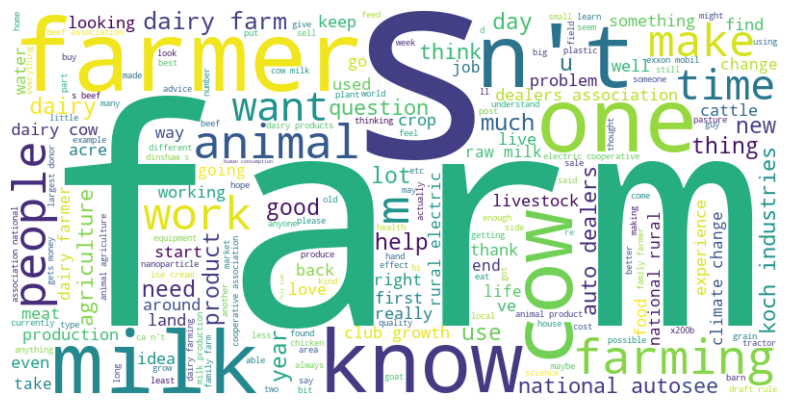

In [290]:
data_analytics(df_sentiment, 'text_clean', 'sentiment_new')

### Representando os dados numericamente
### Dividindo o conjunto de dados em treinamento e teste

In [292]:
print(df_sentiment['sentiment_new'].value_counts())


sentiment_new
Negative    798
Positive    131
Neutral      72
Name: count, dtype: int64


In [293]:
from sklearn.utils import resample
from sklearn.model_selection import train_test_split

# Fix seed for reproducibility
seed = 42

# Separate the classes
df_negative = df_sentiment[df_sentiment['sentiment_new'] == 'Negative']
df_positive = df_sentiment[df_sentiment['sentiment_new'] == 'Positive']
df_neutral = df_sentiment[df_sentiment['sentiment_new'] == 'Neutral']

# Oversample the minority classes to match the majority class
df_positive_oversampled = resample(df_positive, 
                                   replace=True, 
                                   n_samples=len(df_negative), 
                                   random_state=seed)

df_neutral_oversampled = resample(df_neutral, 
                                  replace=True, 
                                  n_samples=len(df_negative), 
                                  random_state=seed)

# Combine all classes into a single dataset
df_balanced = pd.concat([df_negative, df_positive_oversampled, df_neutral_oversampled])

# Perform train-test split
x_train, x_test, y_train, y_test = train_test_split(
    df_balanced['stemmed_tokens'], 
    df_balanced['sentiment_new'], 
    test_size=0.3, 
    stratify=df_balanced['sentiment_new'], 
    random_state=seed
)


In [294]:
len(x_train)

1675

In [295]:
len(x_test)

719

### Bag of Words

In [297]:
from sklearn.feature_extraction.text import CountVectorizer

bag_of_words = CountVectorizer()
x_train_num = bag_of_words.fit_transform(x_train)
x_test_num = bag_of_words.transform(x_test)

In [298]:
x_train_num

<1675x6563 sparse matrix of type '<class 'numpy.int64'>'
	with 66508 stored elements in Compressed Sparse Row format>

### Classification 
-Train and predition


In [300]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Instantiate the Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Train the model
rf.fit(x_train_num, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [301]:
from sklearn.ensemble import RandomForestClassifier######
from sklearn.metrics import accuracy_score, classification_report

# Instantiate the Random Forest Classifier
random  = RandomForestClassifier(n_estimators=180, criterion='entropy', random_state =0, max_depth=9)

# Train the model
random.fit(x_train_num, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=180,
                       random_state=0)

In [302]:
y_pred = rf.predict(x_test_num)
y_pred

array(['Negative', 'Positive', 'Positive', 'Neutral', 'Neutral',
       'Positive', 'Negative', 'Positive', 'Neutral', 'Positive',
       'Neutral', 'Neutral', 'Positive', 'Positive', 'Neutral',
       'Negative', 'Negative', 'Positive', 'Neutral', 'Negative',
       'Negative', 'Negative', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Positive', 'Positive', 'Neutral',
       'Positive', 'Positive', 'Negative', 'Positive', 'Neutral',
       'Neutral', 'Negative', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Positive', 'Neutral', 'Positive',
       'Positive', 'Positive', 'Positive', 'Positive', 'Neutral',
       'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Negative', 'Negative',
       'Positive', 'Neutral', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Negative', 'Positive', 'Positive',
       'Positive', 'Positive', 'Negative', 'Negative', 'Positive',
       'Negative', 'Positive', 'Neutral', 'Positive', 'Neutral',
  

In [303]:
y_prev_random  = random.predict(x_test_num)#####
y_prev_random 

array(['Negative', 'Positive', 'Positive', 'Neutral', 'Neutral',
       'Positive', 'Negative', 'Positive', 'Neutral', 'Positive',
       'Neutral', 'Neutral', 'Positive', 'Positive', 'Neutral',
       'Negative', 'Negative', 'Positive', 'Neutral', 'Negative',
       'Negative', 'Negative', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Positive', 'Positive', 'Neutral',
       'Positive', 'Positive', 'Negative', 'Positive', 'Neutral',
       'Neutral', 'Negative', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Positive', 'Neutral', 'Positive',
       'Positive', 'Positive', 'Positive', 'Positive', 'Neutral',
       'Neutral', 'Neutral', 'Neutral', 'Neutral', 'Negative', 'Negative',
       'Positive', 'Neutral', 'Positive', 'Positive', 'Positive',
       'Positive', 'Positive', 'Negative', 'Positive', 'Positive',
       'Positive', 'Positive', 'Negative', 'Negative', 'Positive',
       'Negative', 'Positive', 'Neutral', 'Positive', 'Neutral',
  

### Avaliar modelo no conjunto de teste

#### Verficando acuracia

In [306]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_pred, y_test))

Accuracy: 0.6842837273991655


#### Matriz de confusao

              precision    recall  f1-score   support

    Negative       1.00      0.57      0.73       239
     Neutral       1.00      0.48      0.65       240
    Positive       0.51      1.00      0.68       240

    accuracy                           0.68       719
   macro avg       0.84      0.68      0.69       719
weighted avg       0.84      0.68      0.69       719



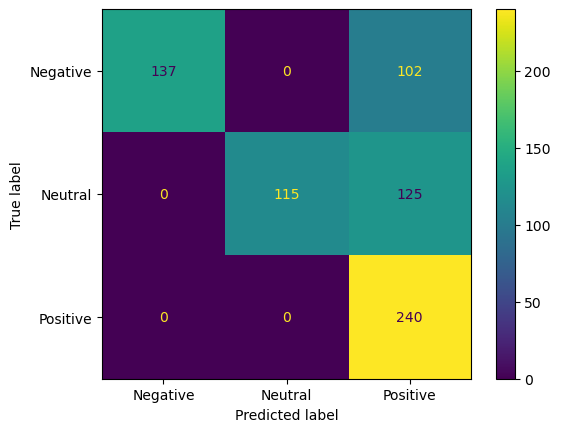

In [308]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, confusion_matrix

confusion = confusion_matrix(y_test, y_pred, labels = random.classes_)
display_confusion = ConfusionMatrixDisplay(confusion_matrix = confusion, display_labels = random.classes_)
display_confusion.plot()

# print the classification_report based on y_test and y_predict
print(classification_report(y_test, y_pred))

In [309]:
# usar a funcao de prepossasemento
def classifierNewData(text):
    text = process_text(text)
    x = bag_of_words.transform([text])#  passar lista de textos
    y = random.predict(x)
    print(y)

#### Positive Sentences for test:
- Dairygold's milk production continues to reach record levels this year.
- Farmers are reporting higher yields from their dairy cows this year.
- Milk production in the EU is experiencing steady improvements.

In [311]:
# vamos gerar casos para testar o mudelo.
classifierNewData('Dairygold milk production continues to reach record levels this year')


['Negative']


In [312]:
classifierNewData('milk is good')

['Positive']


In [313]:
classifierNewData('Farmers are reporting higher yields from their dairy cows this year.')

['Negative']


In [314]:
classifierNewData('Milk production in the EU is experiencing steady improvements.')

['Negative']


#### Negative Sentences:
- Dairy farming faces serious challenges due to rising production costst.
- Milk production has drastically decreased in drought-stricken regions.
- Milk production is declining in some areas due to lack of resources.

In [316]:
classifierNewData('Dairy farming faces serious challenges due to rising production costs')

['Negative']


In [317]:
classifierNewData('Milk production has drastically decreased in drought-stricken regions')

['Negative']


In [318]:
classifierNewData('Milk production is declining in some areas due to lack of resources')

['Negative']


#### Neutral Sentences:
- Milk production techniques vary widely across different farming regions.
- Dairy cows contribute significantly to overall milk supply chains.
- The EU released new guidelines for standardizing milk production.

In [320]:
classifierNewData('Milk production techniques vary widely across different farming regions')

['Negative']


In [321]:
classifierNewData('Dairy cows contribute significantly to overall milk supply chains.')

['Negative']


In [322]:
classifierNewData('The EU released new guidelines for standardizing milk production.')

['Negative']


 # Dashboard 

In [324]:
pip install streamlit

Note: you may need to restart the kernel to use updated packages.


In [325]:
import streamlit as st
import plotly.express as px


In [326]:
df_new_4.head()

,Area,Item,Year,Value
0,Albania,Raw milk of buffalo,1961,3701.63
1,Albania,Raw milk of buffalo,1962,3405.50
2,Albania,Raw milk of buffalo,1963,3035.34
3,Albania,Raw milk of buffalo,1964,2887.27
4,Albania,Raw milk of buffalo,1965,2591.14
